In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from utils import plot_volcano, enrich

In [4]:
sc.set_figure_params(dpi=100, frameon=False, color_map='Reds')
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.3 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


In [5]:
adata = sc.read('2301_annot_patient_integrated_ambient_removed.h5ad')

In [4]:
pd.crosstab(adata.obs.treatment, adata.obs.patient)

patient,Patient 1,Patient 2,Patient 3,Patient 4
treatment,,,,
BB94,0,0,0,2625
DMSO,0,0,0,1541
Gilteritinib,0,0,0,2590
IFNL,0,0,3957,3462
IFNa,3627,5706,3458,3360
IFNa + TNFa,3712,0,5500,2914
IFNg,3471,4131,4874,3404
IFNg + TGFb2,0,0,3755,3160
Sorafenib,3413,0,3943,4417


## Calculate categories

Take conditions appearing in all patients:

In [11]:
df = pd.crosstab(adata.obs.treatment, adata.obs.patient)
shared_conds = list(df.index[df.all(axis=1).values])

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


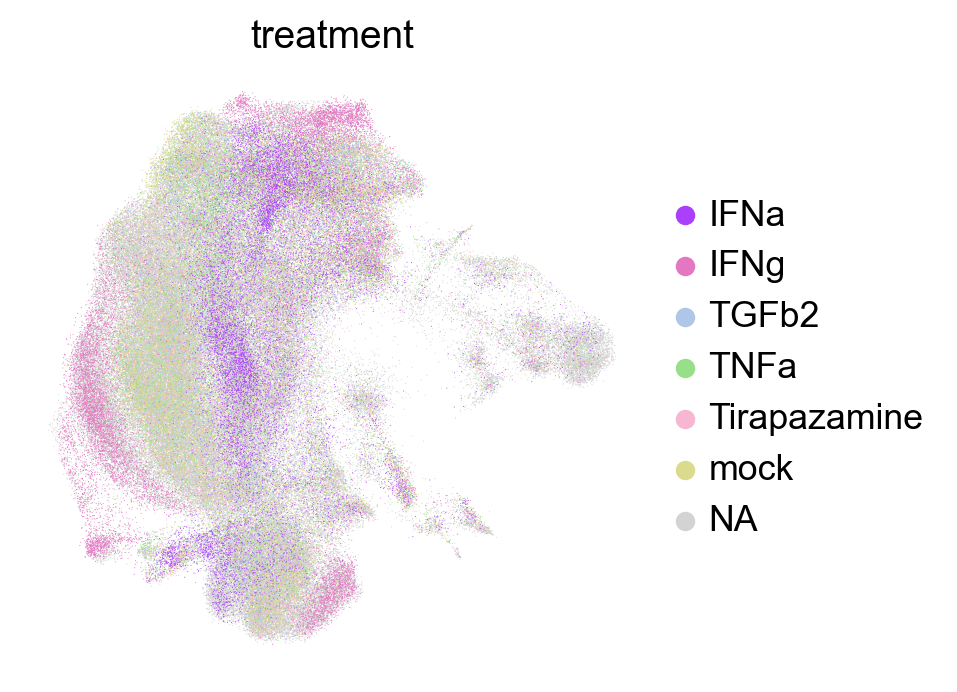

In [38]:
sc.pl.umap(adata, color='treatment', groups=shared_conds)

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


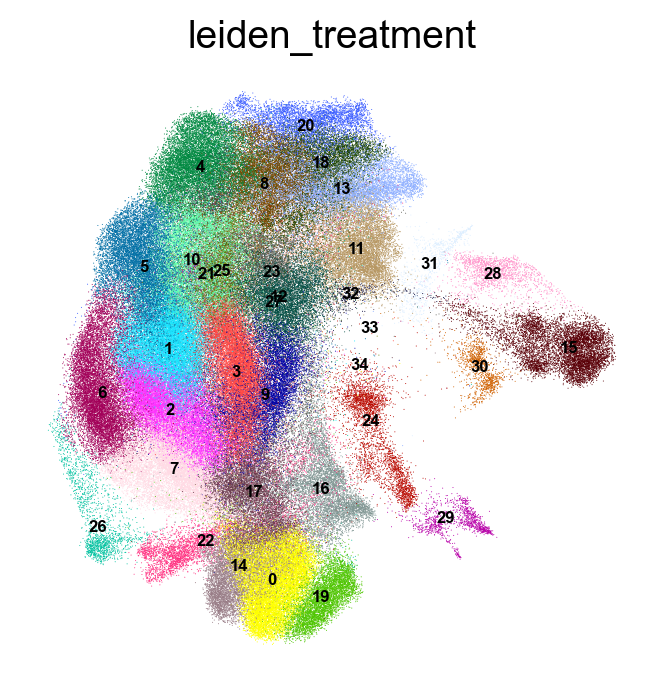

In [142]:
%%time
sc.tl.leiden(adata, resolution=2.5, key_added='leiden_treatment')
sc.pl.umap(adata, color='leiden_treatment', legend_loc='on data', legend_fontsize=6)

Label each leiden cluster with a treatment category.

In [205]:
# get percent nans per cluster and filter out
df = pd.concat([
    pd.DataFrame(adata.obs.leiden_treatment.value_counts()),
    pd.DataFrame(adata[adata.obs.treatment == 'nan'].obs.leiden_treatment.value_counts())
], axis=1).fillna(0)
df.columns = ['total', 'nans']
df['percent_nan'] = df.values[:, 1]/df.values[:, 0]
assign_clusters = df[(df.total > 100) & (df.percent_nan < .30)].index

<AxesSubplot: xlabel='treatment', ylabel='leiden_treatment'>

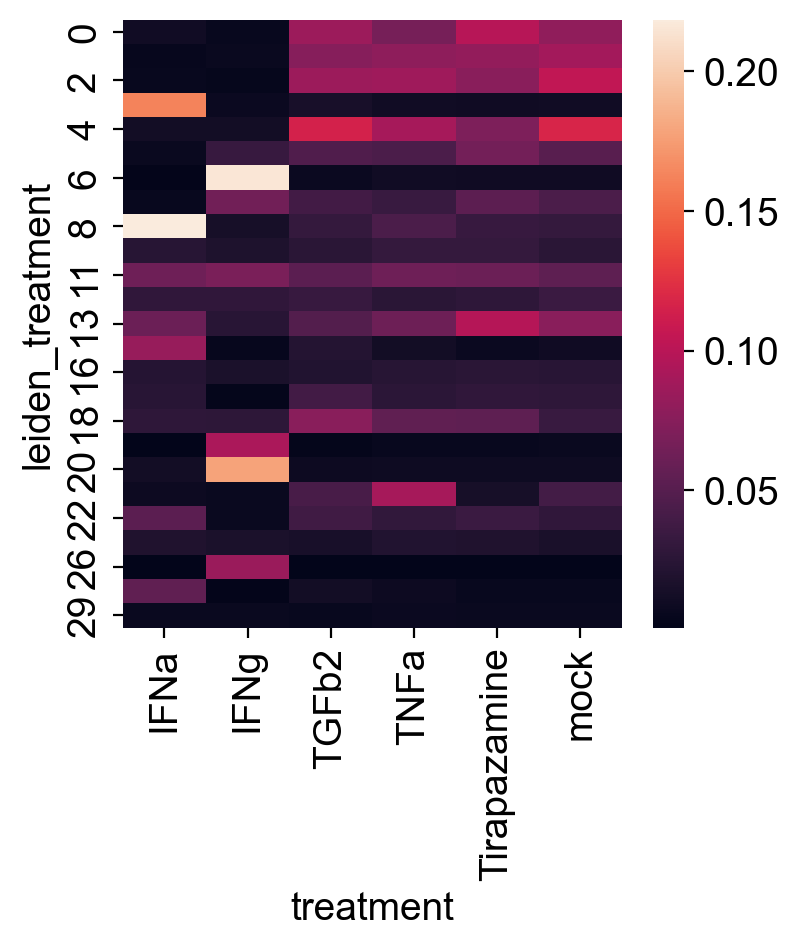

In [206]:
obs_df = pd.crosstab(adata.obs.leiden_treatment, adata.obs.treatment)
obs_df /= obs_df.sum(axis=0)
sns.heatmap(obs_df.T[assign_clusters].T[shared_conds])

There are some clusters that clearly belong to a condition and otherwise it's unclear. Only assign a cluster a category if it's significantly enriched with a condition.

In [240]:
signif_thresh = 2
assign_dict = {}
for c in adata.obs.leiden_treatment.cat.categories:
    if c not in assign_clusters:  # ones with too many nans
        pass
#         assign_dict[c] = 'no_category'
    else:
        n_large = obs_df[shared_conds].T[c].nlargest(2)
        if n_large[0] > n_large[1]*signif_thresh:
            assign_dict[c] = n_large.index[0]
        else:
            assign_dict[c] = 'mock'
            
adata.obs['trt_category'] = adata.obs.leiden_treatment.map(assign_dict)

/home/yuge/miniconda3/envs/fa_base/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


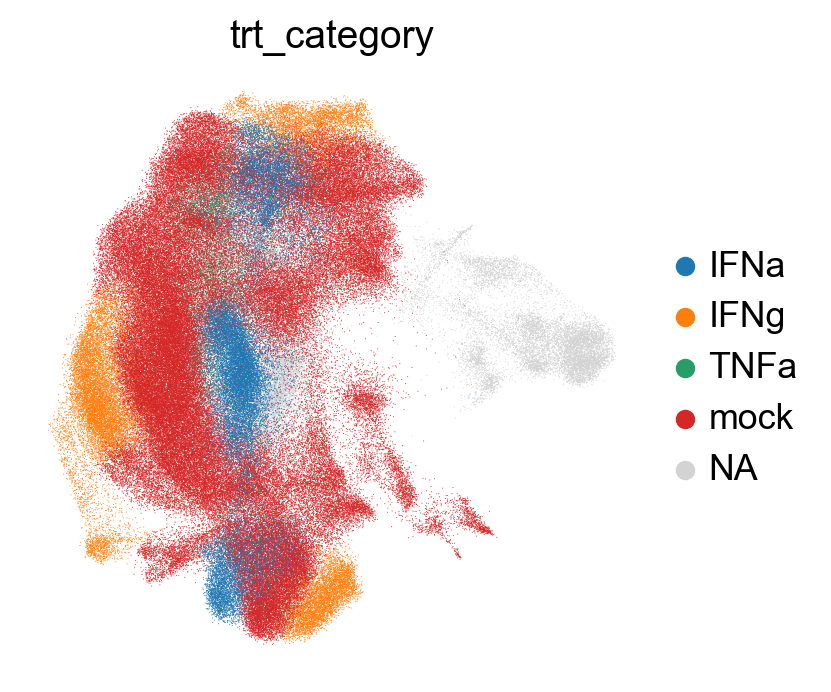

In [241]:
sc.pl.umap(adata, color='trt_category')

Check assignment:

In [242]:
pd.crosstab(adata.obs.trt_category, adata.obs.treatment)[shared_conds]

treatment,IFNa,IFNg,TGFb2,TNFa,Tirapazamine,mock
trt_category,,,,,,
IFNa,8390,449,1209,1052,742,1482
IFNg,258,9079,310,381,332,682
TNFa,136,103,654,1290,184,1027
mock,6007,5368,12267,10554,11029,21151


Re-categorize all treatments by representation in treatment category.

In [283]:
df = pd.crosstab(adata.obs.trt_category, adata.obs.treatment)
adata.obs['trt_category'] = adata.obs.treatment.map(dict(df.idxmax()))
# store mapping as dictionary
adata.uns['trt_categories'] = adata.obs[['trt_category', 'treatment']].groupby('treatment').first().reset_index().groupby('trt_category').agg(list).to_dict()['treatment']

adata.obs[['trt_category', 'treatment']].groupby('treatment').first().sort_values('trt_category')

,trt_category
treatment,
IFNL,IFNa
IFNa,IFNa
IFNa + TNFa,IFNa
IFNg,IFNg
IFNg + TGFb2,IFNg
TNFa + IFNg,IFNg
BB94,mock
Tirapazamine,mock
TNFa + Tirapazamine,mock


In [285]:
adata.write('2301_annot_patient_integrated_ambient_removed.h5ad')

## Count number of and plot significant DEGs between categories

For the rest of the analysis, we'll only use the uninfected cells as to avoid infection-specific effects of the cytokines.

In [30]:
adata = adata[adata.obs.infected == 'False']

In [31]:
adata

View of AnnData object with n_obs × n_vars = 90998 × 18115
    obs: 'identifier', 'patient', 'name', 'barcode_round', 'sample', 'viral_counts', 'treatment', 'treatment_virus', 'infected', 'n_counts', 'n_genes', 'percent_mito', 'percent_viral', 'leiden', 'final_bcs', 'batch', 'celltype_coarse', 'cell_type', 'infection_label', '_scvi_batch', '_scvi_labels', 'leiden_coarse', 'leiden_fine', 'leiden_subset', 'celltype_fine', 'celltype_approx', 'ambient', 'trt_category'
    var: 'used_for_scvi'
    uns: '_scvi', 'cell_type_colors', 'celltype_approx_colors', 'celltype_coarse_colors', 'celltype_fine_colors', 'dendrogram_leiden_fine', 'hvg', 'infected_colors', 'leiden', 'leiden_coarse_colors', 'leiden_colors', 'leiden_fine_colors', 'neighbors', 'patient_colors', 'rank_genes_groups', 'treatment_colors', 'trt_categories', 'trt_category_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


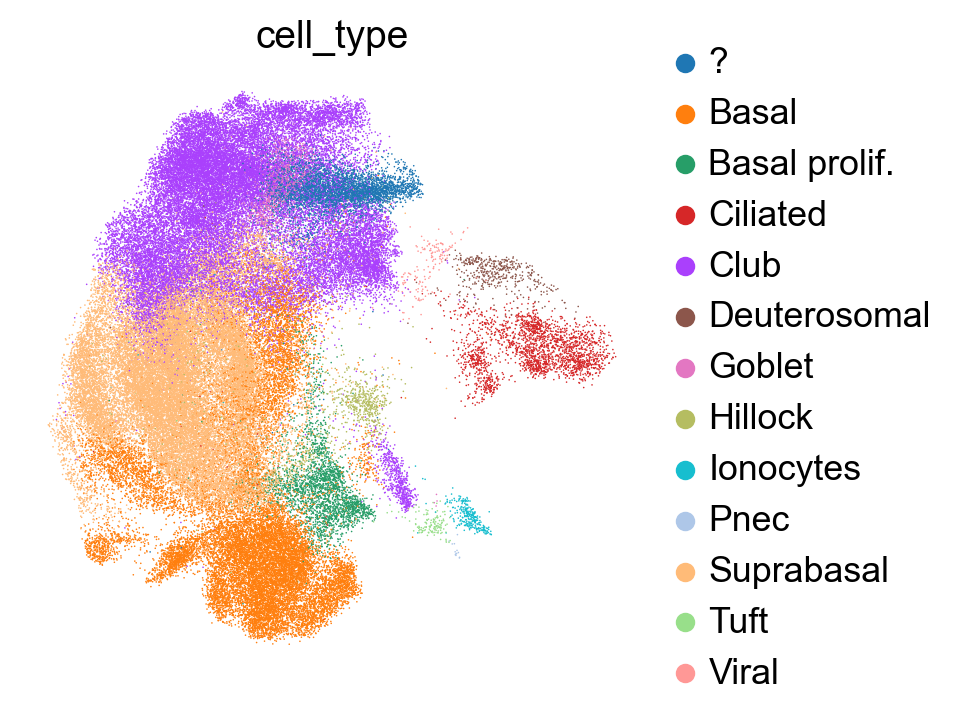

In [42]:
sc.pl.umap(adata, color='cell_type')

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


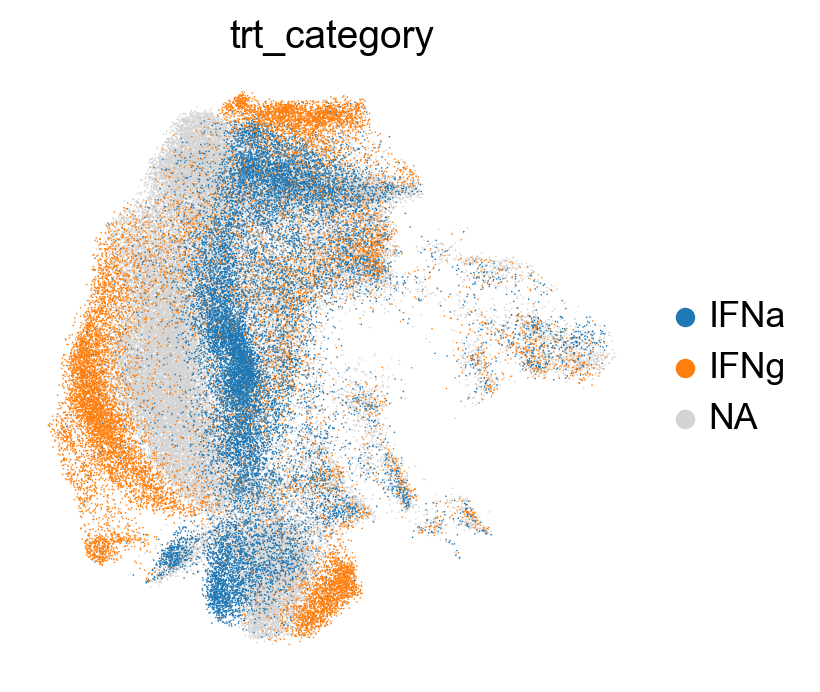

In [32]:
sc.pl.umap(adata, color='trt_category', groups=['IFNa', 'IFNg'])

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


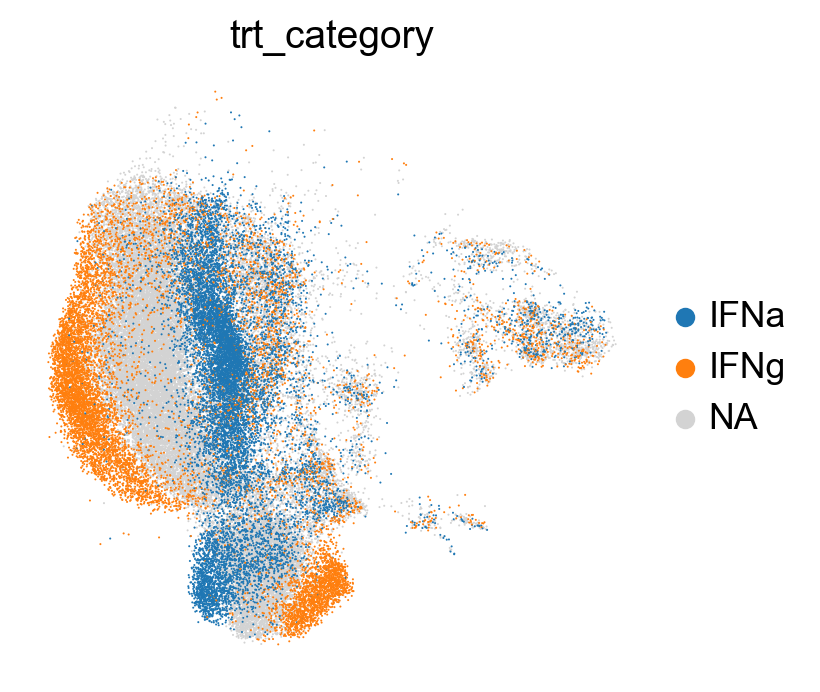

In [37]:
sc.pl.umap(adata[adata.obs.patient.isin(['Patient 3', 'Patient 4'])], color='trt_category', groups=['IFNa', 'IFNg'])

In [34]:
adata.uns['trt_categories']

{'IFNa': array(['IFNL', 'IFNa', 'IFNa + TNFa'], dtype=object),
 'IFNg': array(['IFNg', 'IFNg + TGFb2', 'TNFa + IFNg'], dtype=object),
 'mock': array(['BB94', 'DMSO', 'Gilteritinib', 'Sorafenib', 'TGFb2',
        'TGFb2 + Tirapazamine', 'TNFa', 'TNFa + TGFb2',
        'TNFa + Tirapazamine', 'Tirapazamine', 'mock', 'nan'], dtype=object)}

In [8]:
from utils import enrich

In [9]:
def plot_volcano(df, fc_thresh=2, logpval_thresh=50, plot=True):
    """Make a volcano plot from a rank_genes_groups dataframe.
    
    Returns
    -------
    df
        Modified dataframe with plot values.
    up_genes
        Genes with significantly increased differential expression.
    down_genes
        Genes with significantly decreased differential expression.
    """
    df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
    df = df.replace(np.inf, 325)
    sig_up = df[(df['logfoldchanges'] > fc_thresh) & (df['-log10(pvals)'] > logpval_thresh)].copy()
    sig_down = df[(df['logfoldchanges'] < -fc_thresh) & (df['-log10(pvals)'] > logpval_thresh)].copy()

    if plot:
        # grey - not significant
        plt.scatter(df['logfoldchanges'].values, df['-log10(pvals)'].values, s=4, c='grey')
        # red - up and significant
        plt.scatter(sig_up['logfoldchanges'].values, sig_up['-log10(pvals)'].values, s=4, c='darkred')
        # blue - down and significant
        plt.scatter(sig_down['logfoldchanges'].values, sig_down['-log10(pvals)'].values, s=4)

        plt.xlabel('logFC')
        plt.ylabel('-log10(pvals)')
        plt.xlim(-7, 7)  # to avoid plotting super high FC genes caused by dropout
    return df, sig_up.names.values, sig_down.names.values

In [35]:
sc.tl.rank_genes_groups(adata, groupby='trt_category', reference='mock')

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Volcano plots for general, non-celltype specific DEGs, using only patients 3 and 4 which contained all relevant treatments.

/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


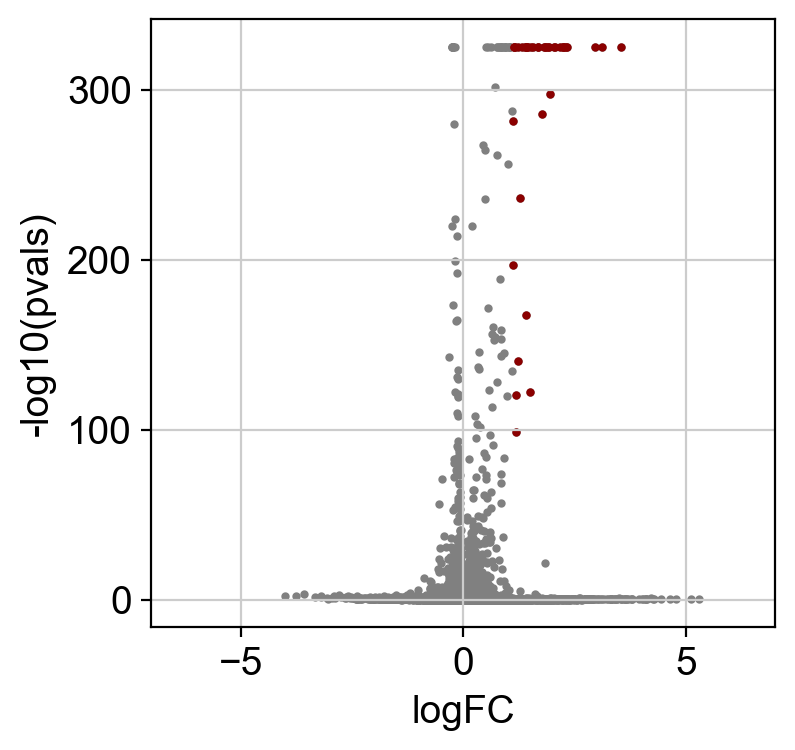

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


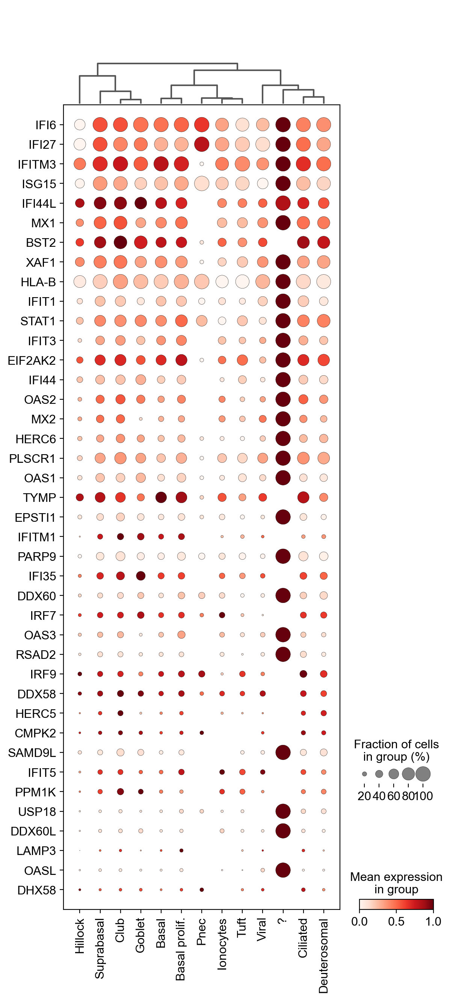

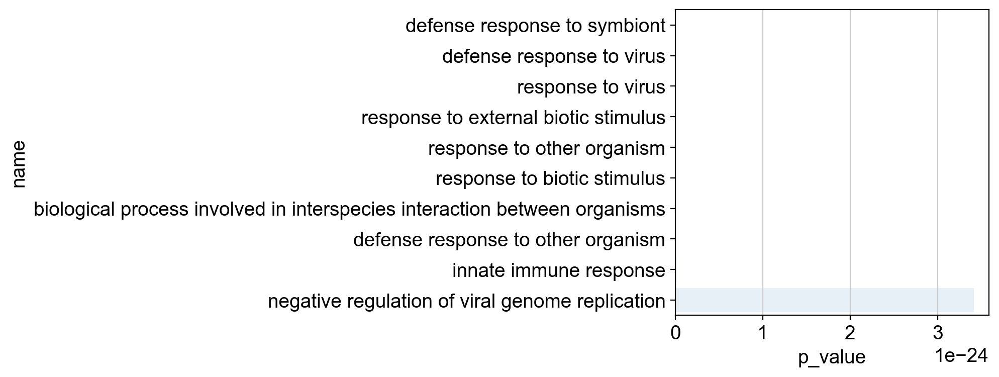

/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


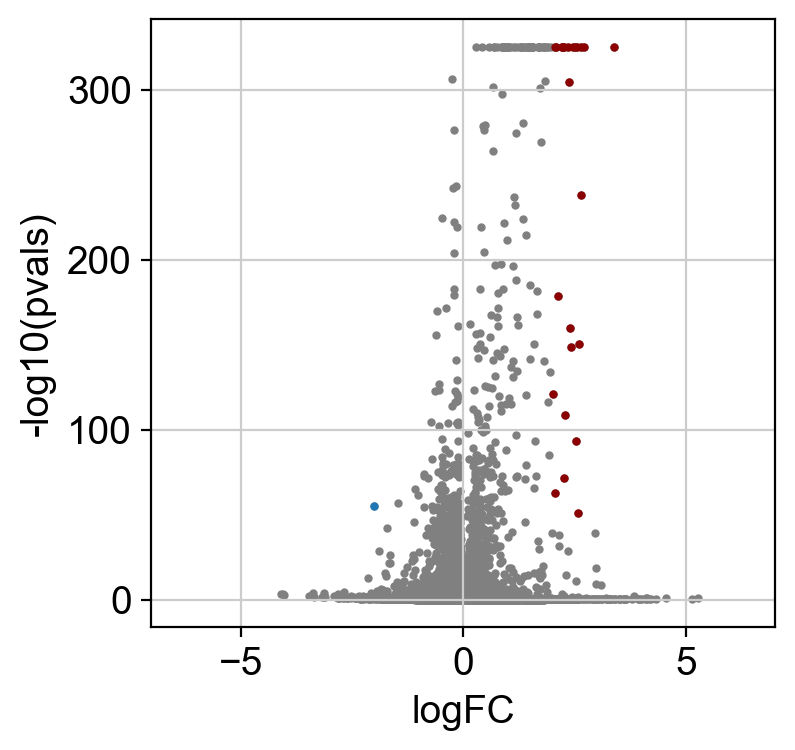

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


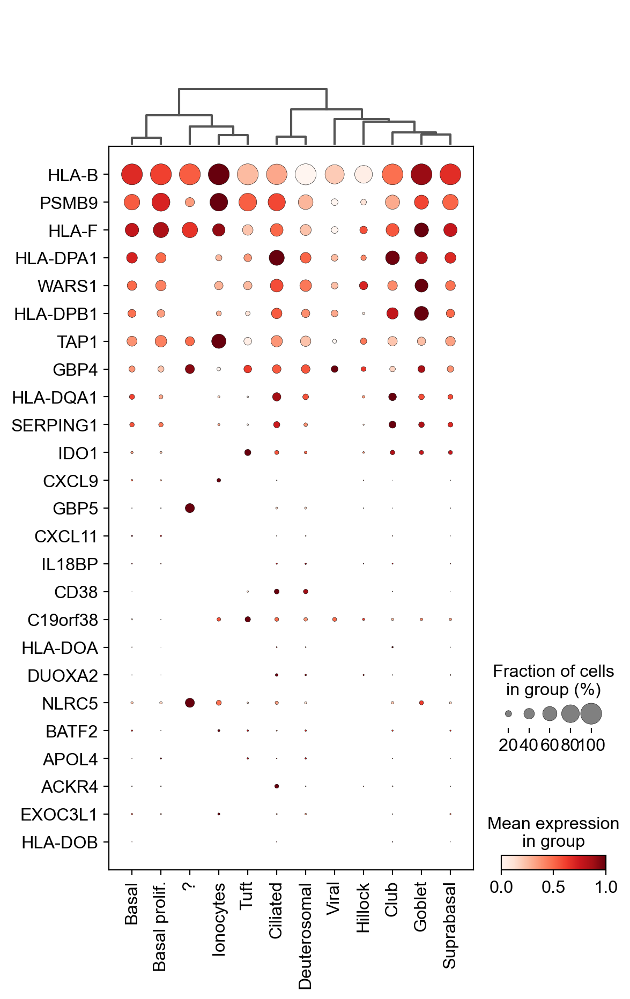

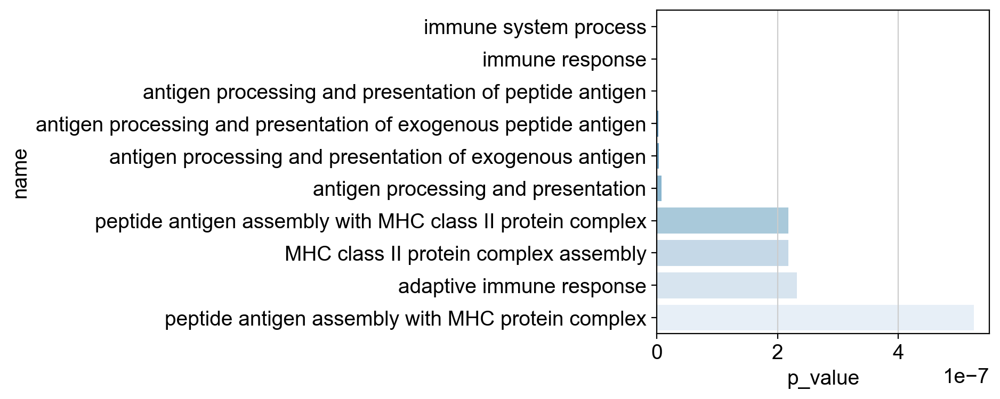

In [36]:
for cat, thresh in zip(['IFNa', 'IFNg'], [1.1, 2]):
    df, up, dn = plot_volcano(sc.get.rank_genes_groups_df(adata, group=cat), fc_thresh=thresh)
    plt.show()

#     for trt in adata.uns['trt_categories'][cat]:
#         sc.pl.dotplot(adata[adata.obs.treatment == trt], var_names=up, groupby='cell_type', standard_scale='var', title=trt)

    sc.pl.dotplot(
        adata[(adata.obs.treatment.isin(adata.uns['trt_categories'][cat])) & (adata.obs.patient.isin(['Patient 3', 'Patient 4']))],
        var_names=up, groupby='cell_type', standard_scale='var', swap_axes=True, dendrogram=True
    )

    sns.barplot(data=enrich(up, adata.var_names).head(10), x='p_value', y='name', palette='Blues_r')
    plt.show()

Calculate DEGs per cell type (if there are any):

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


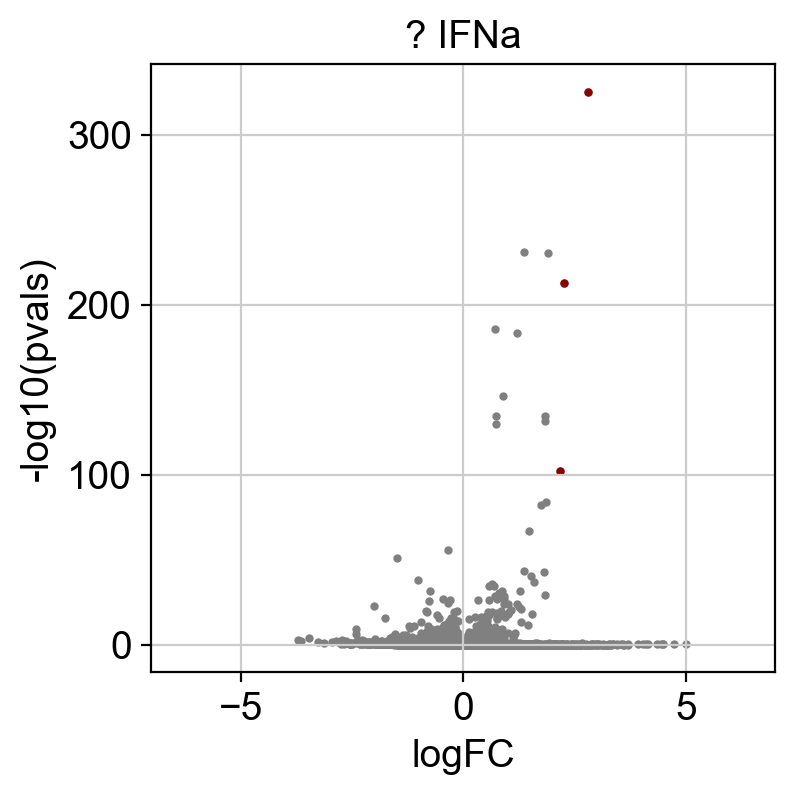

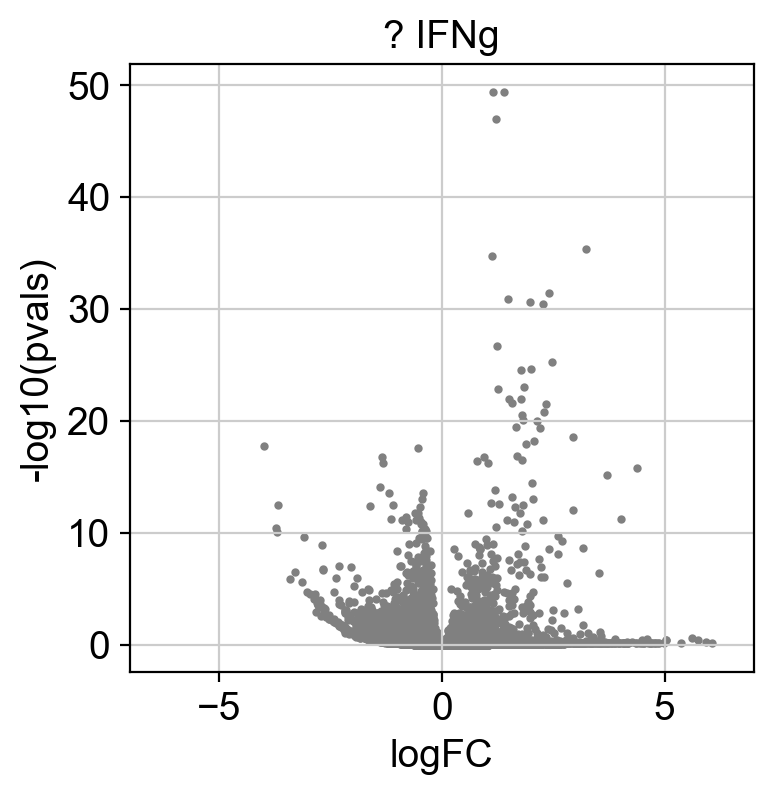

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


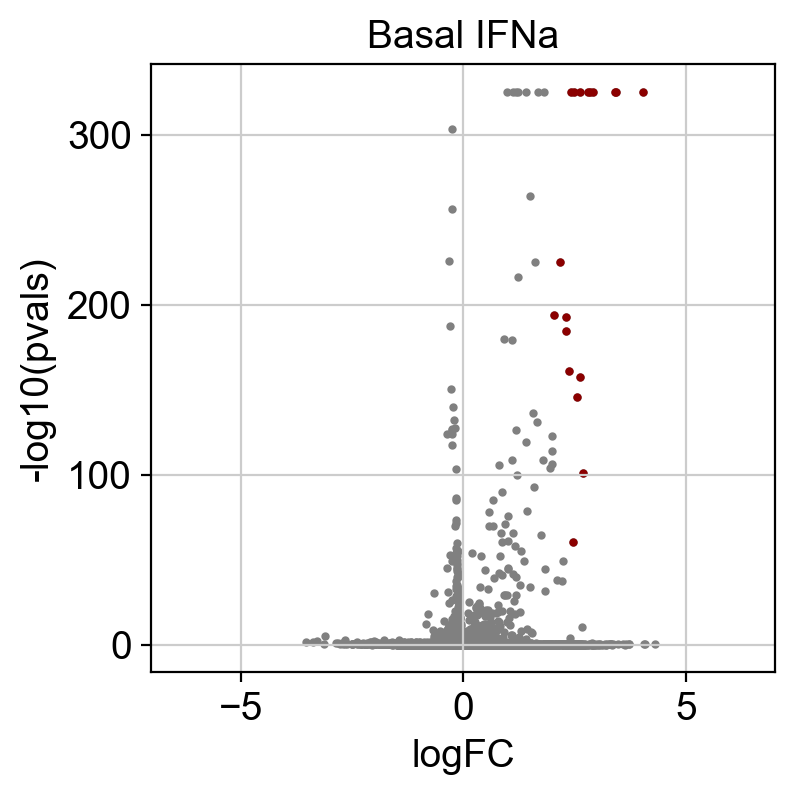

/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


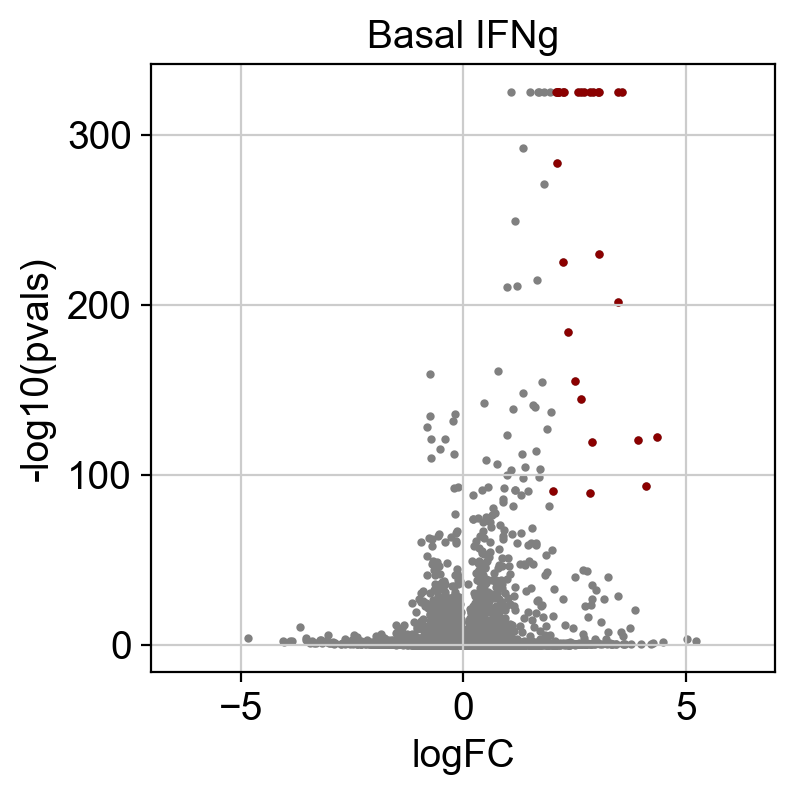

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


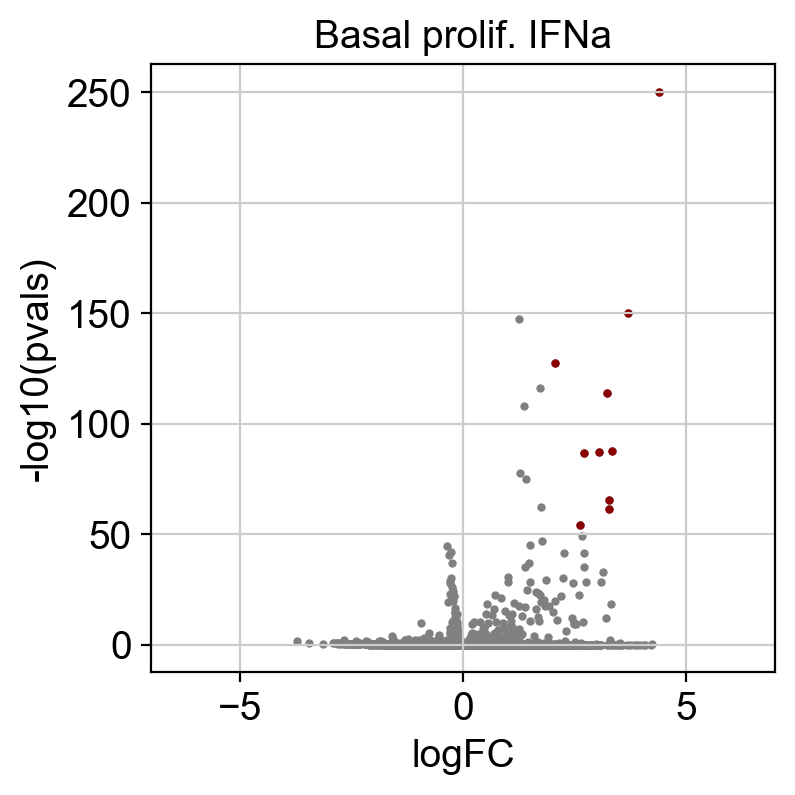

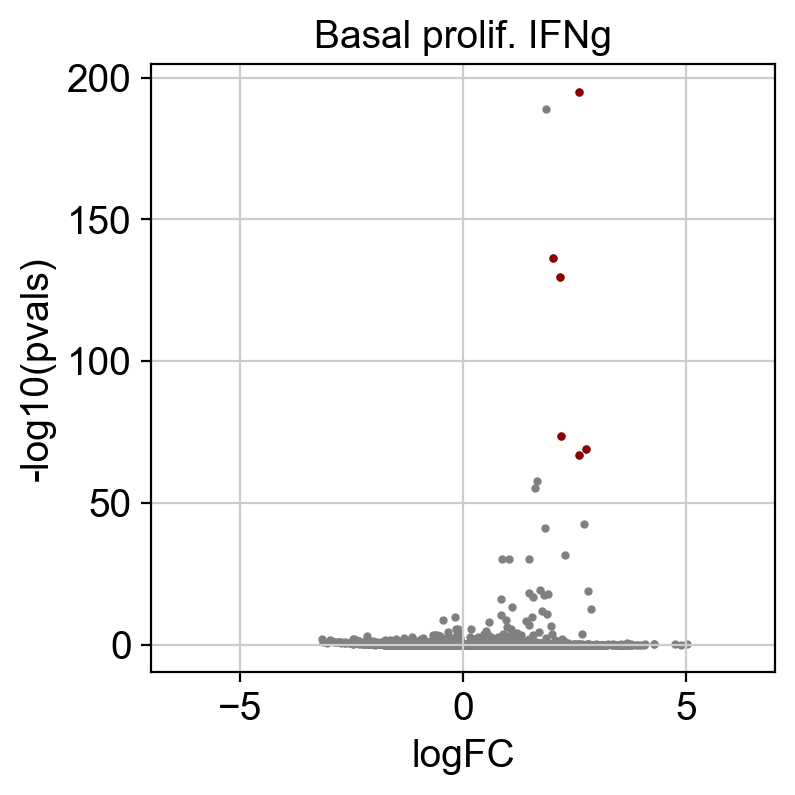

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


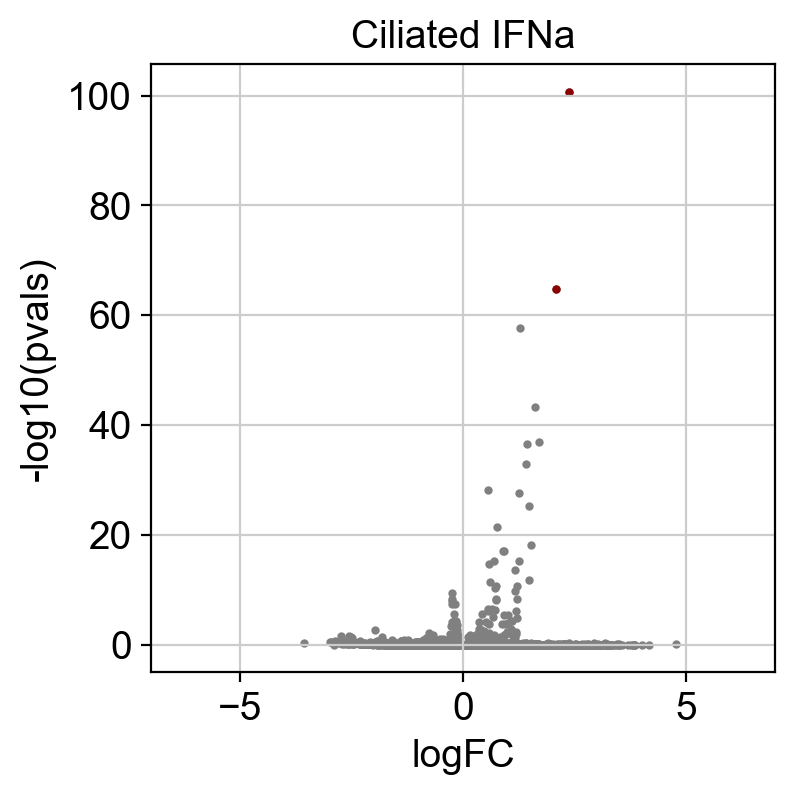

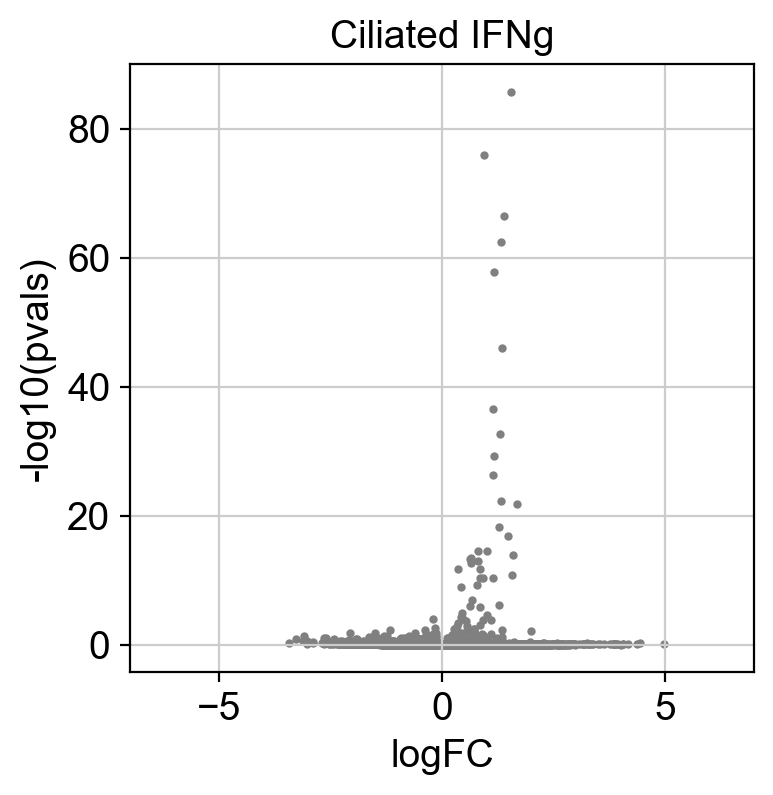

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


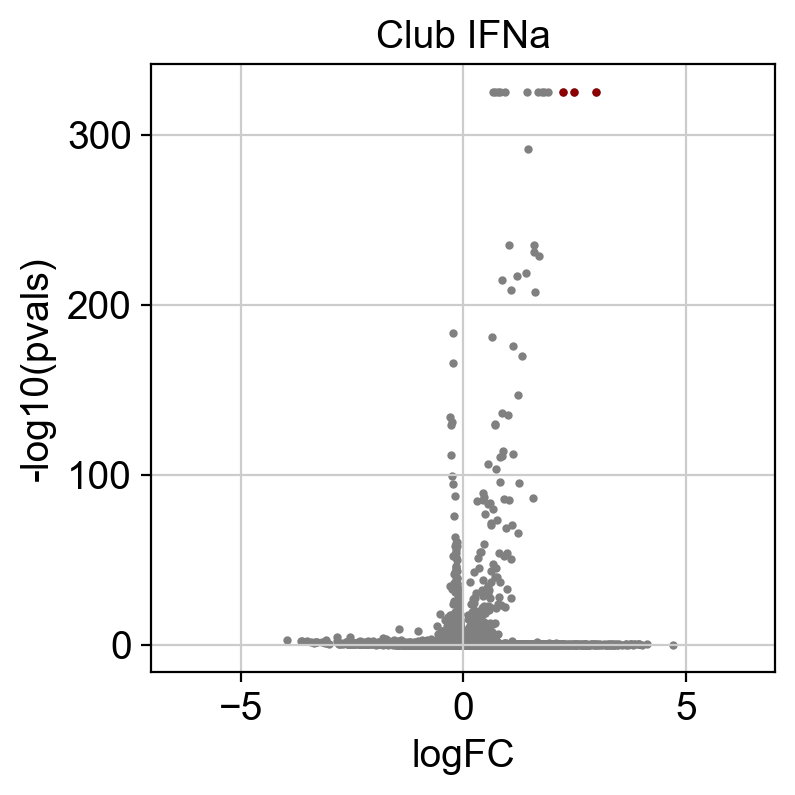

/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


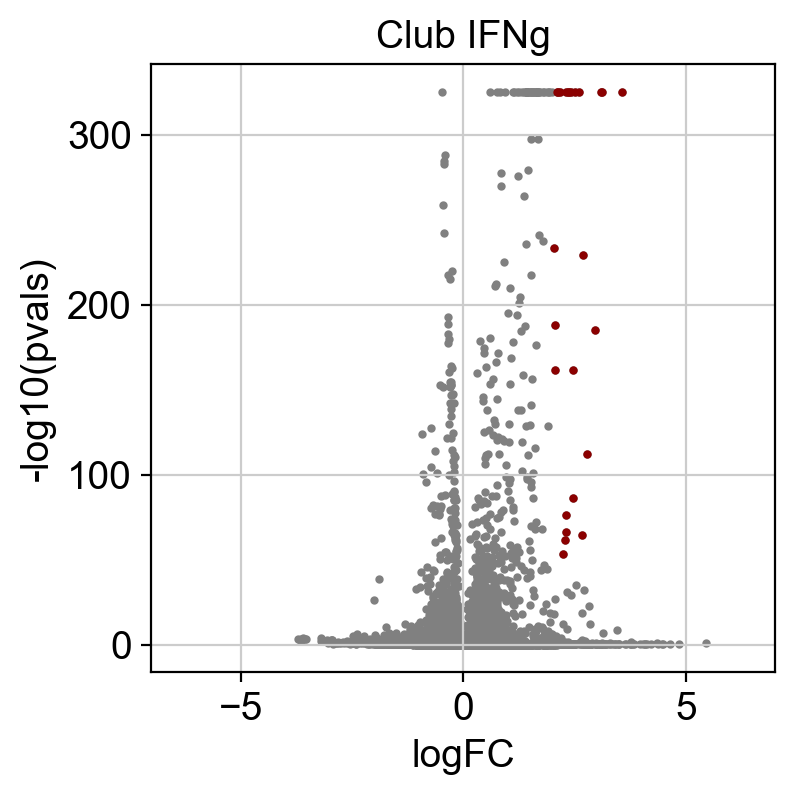

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


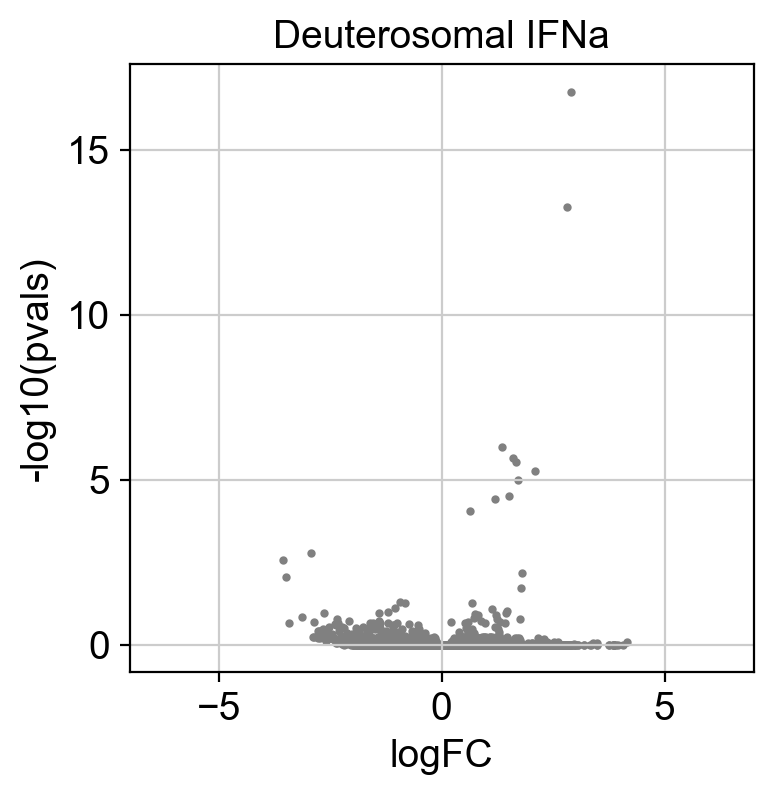

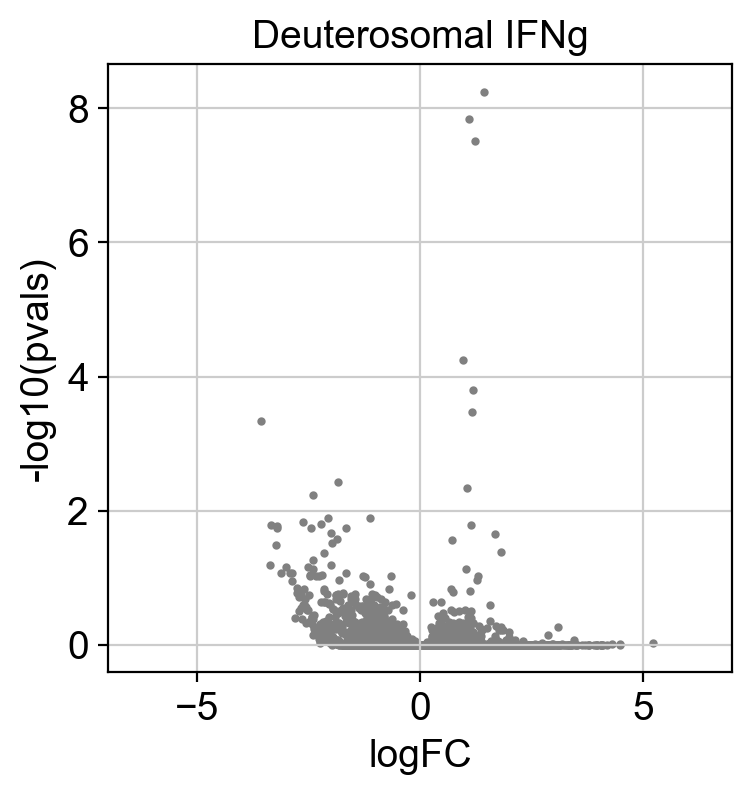

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


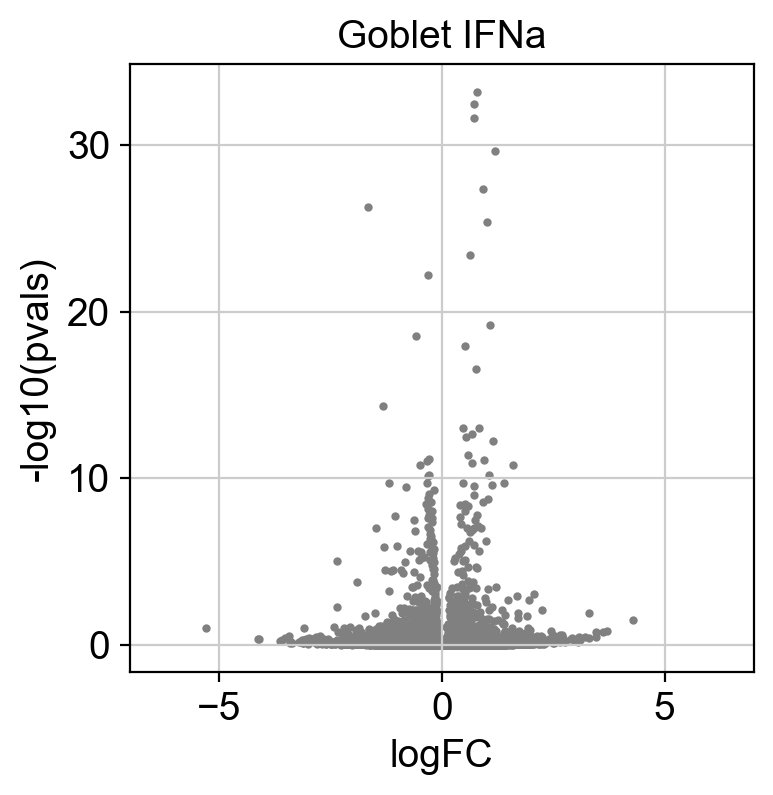

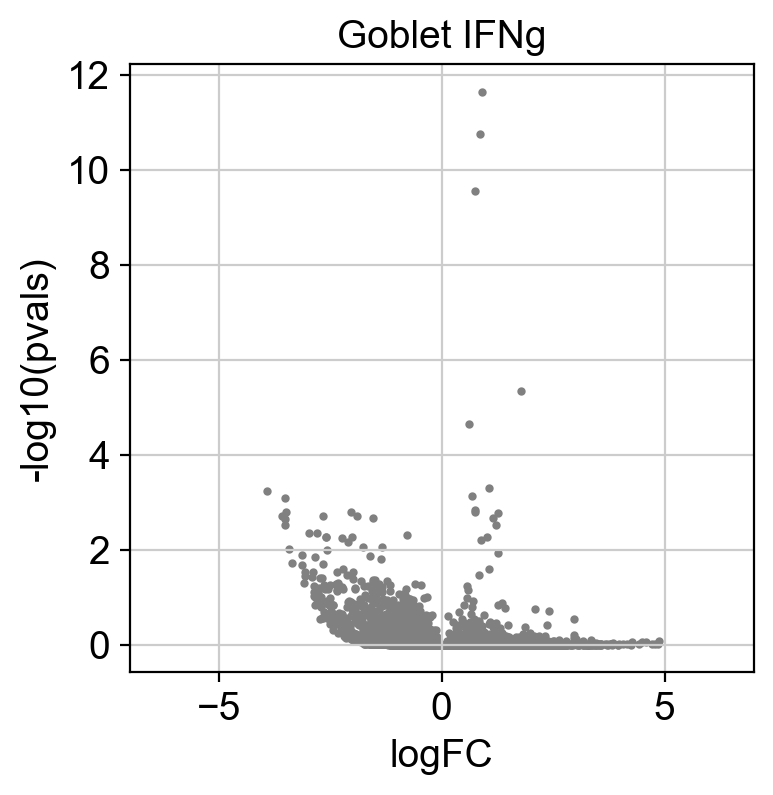

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


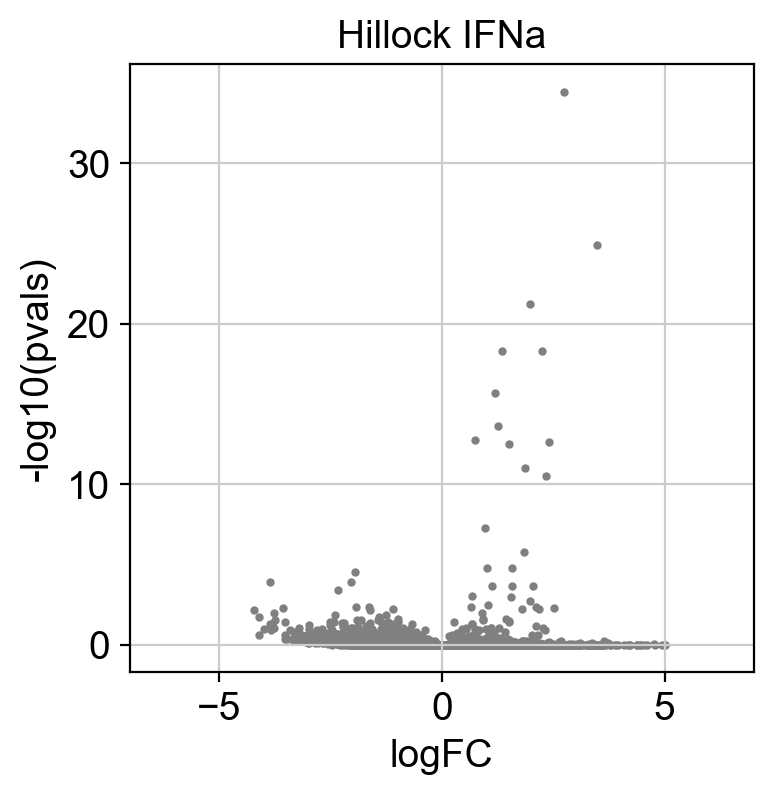

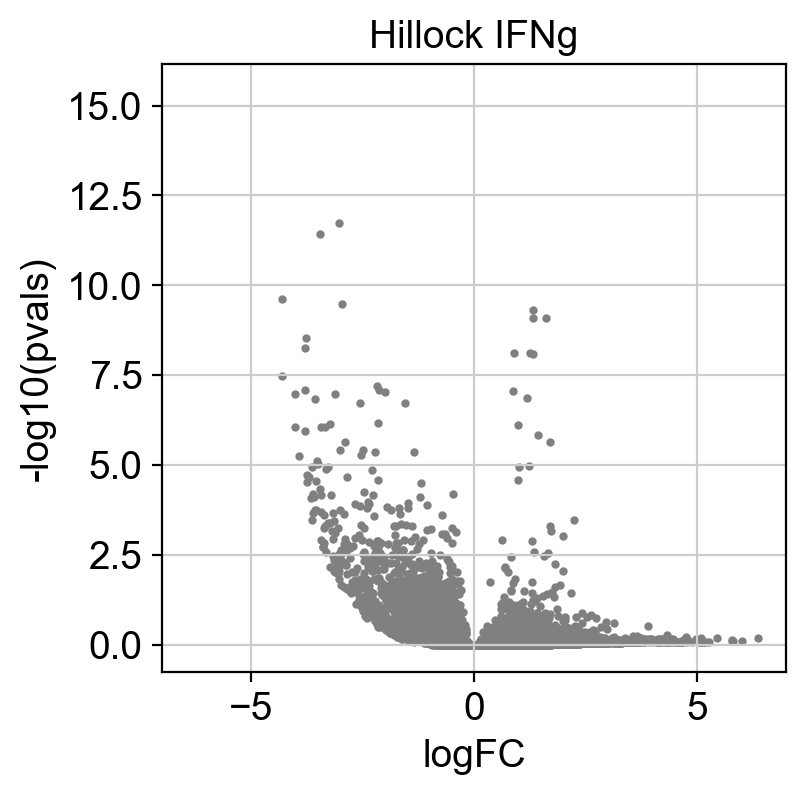

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


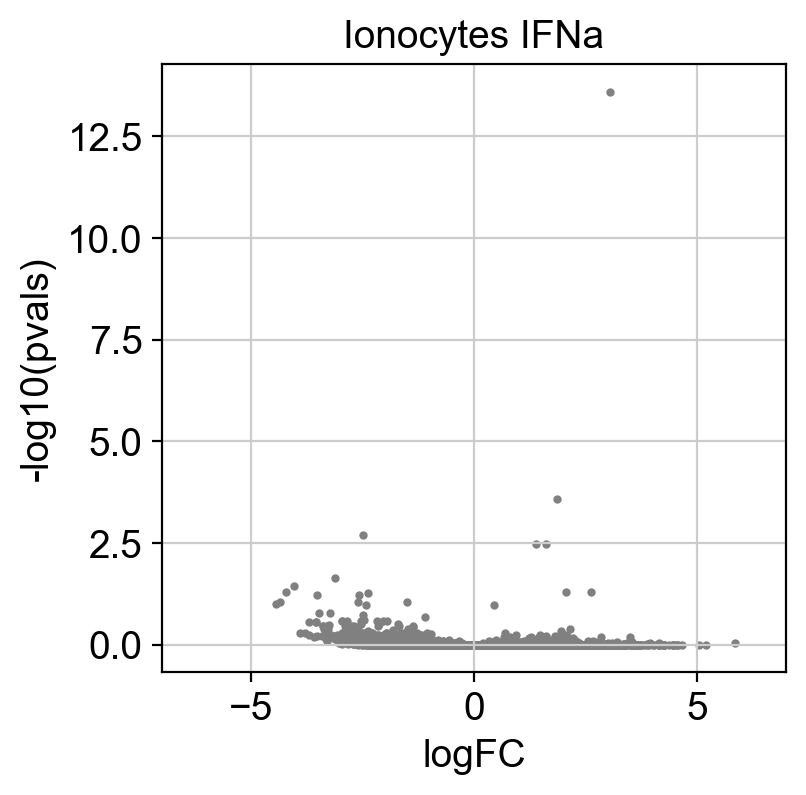

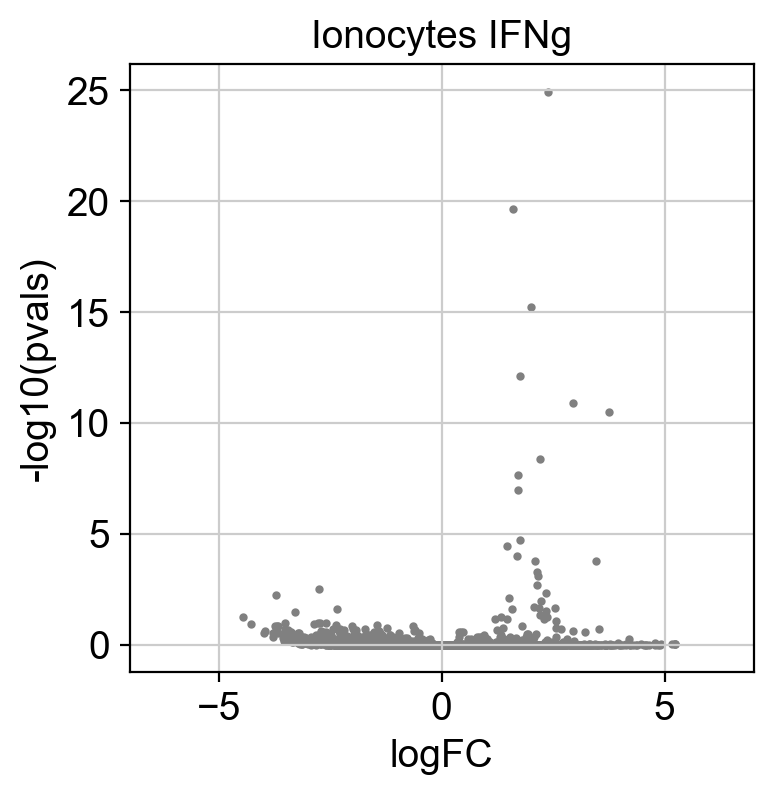

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


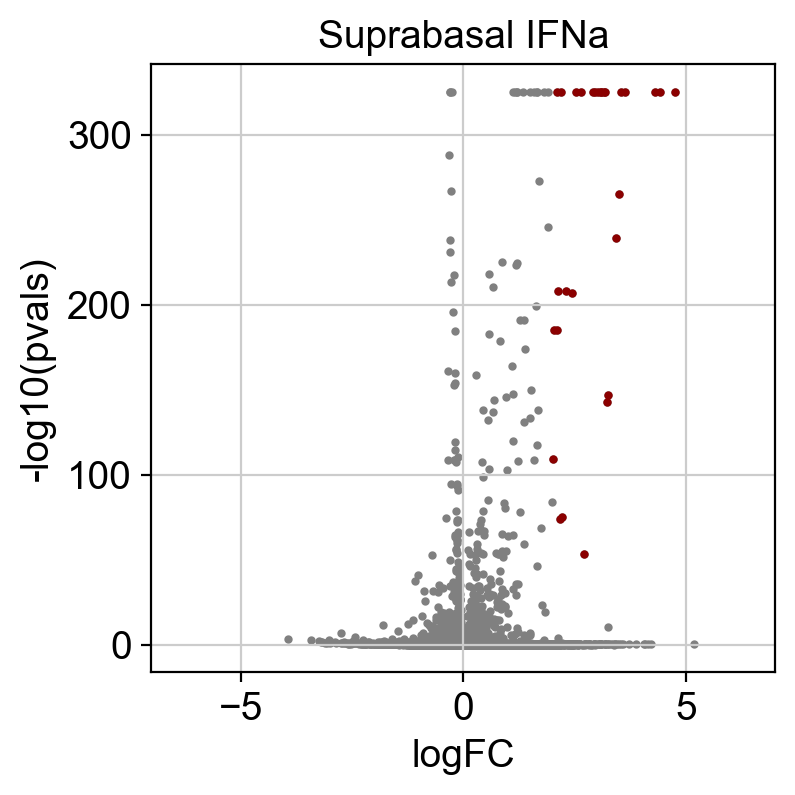

/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_97152/311615840.py:13: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)


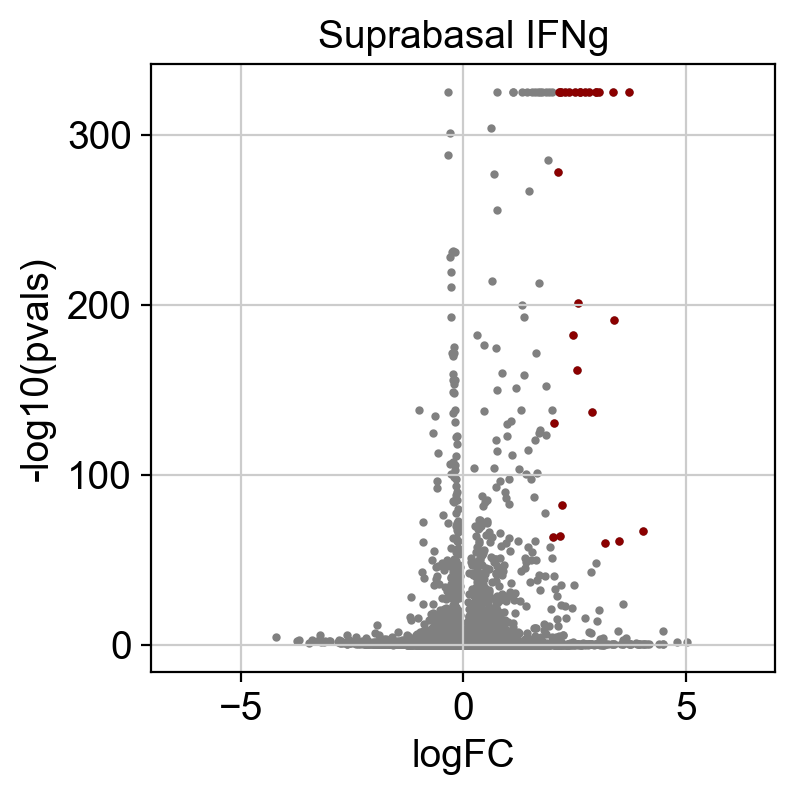

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


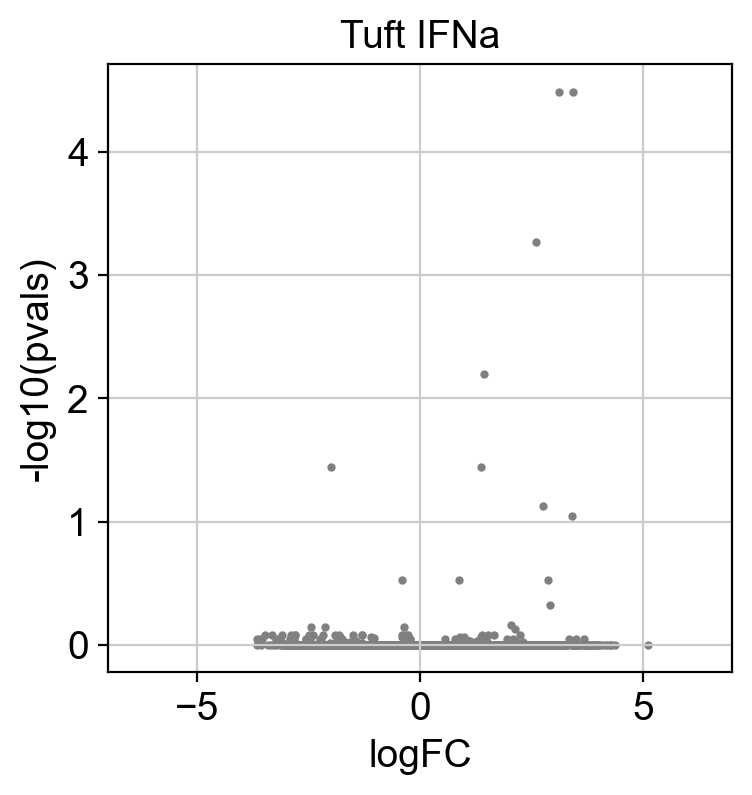

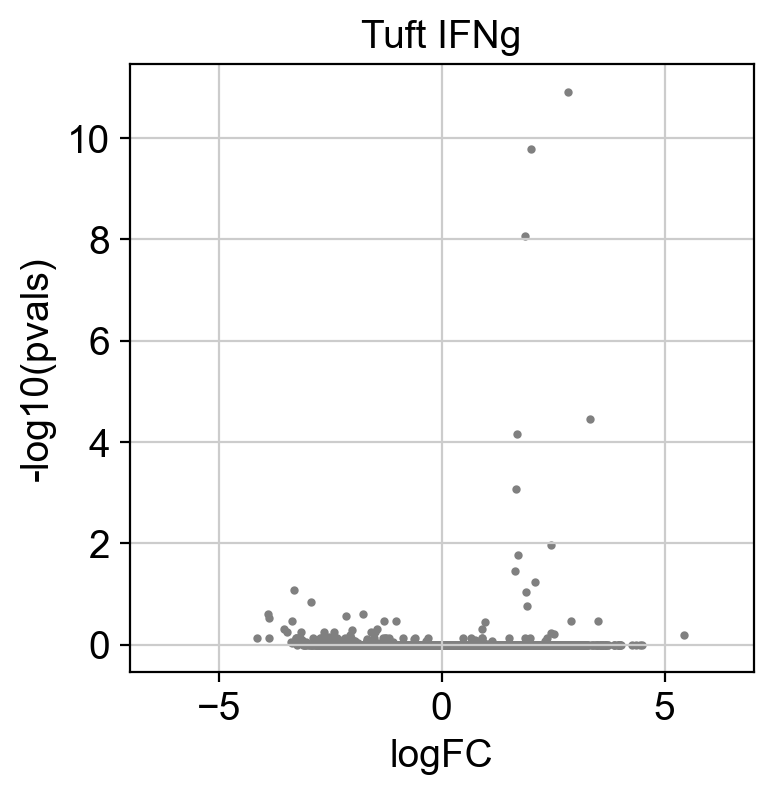

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


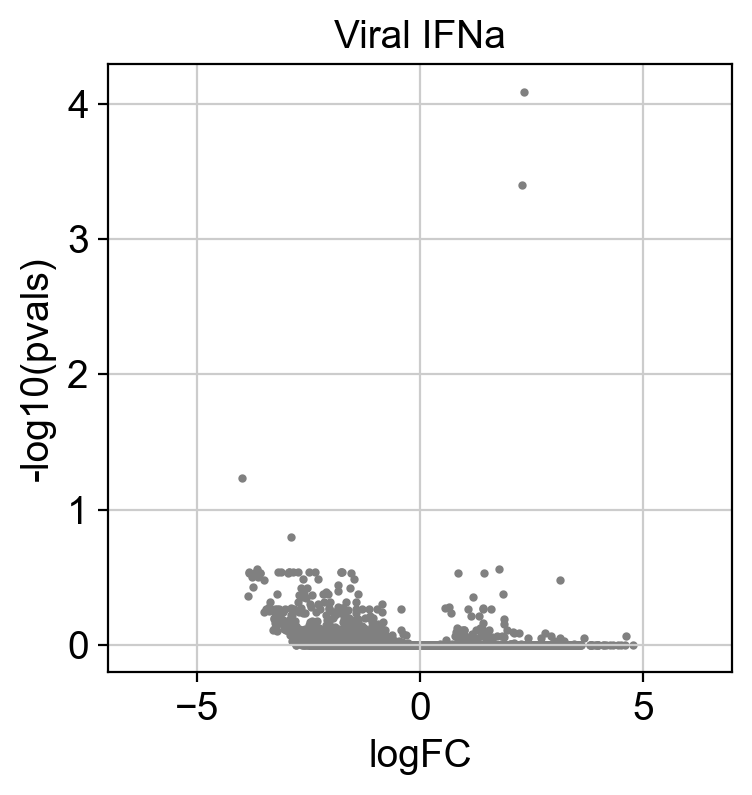

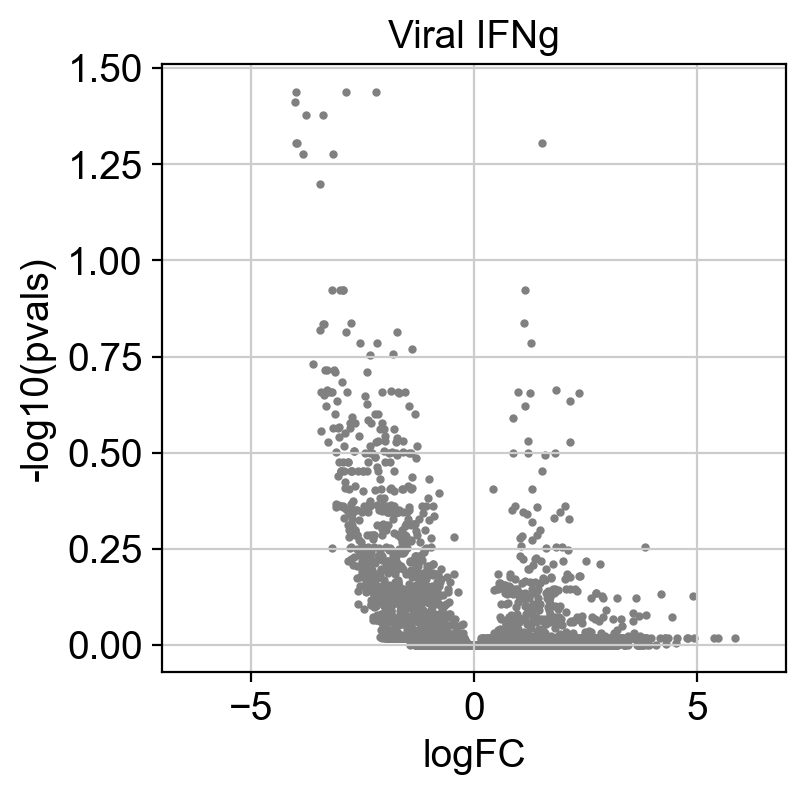

In [45]:
ndegs = {
    'IFNa': {},
    'IFNg': {}
}
for ct in adata.obs.cell_type.cat.categories:
    subset = adata[adata.obs.cell_type == ct]
    if subset.shape[0] < 50:  # don't calculate for fewer than 50 cells
        continue
    sc.tl.rank_genes_groups(subset, groupby='trt_category', reference='mock')
    for cat in ['IFNa', 'IFNg']:
        df, up, dn = plot_volcano(sc.get.rank_genes_groups_df(subset, group=cat), fc_thresh=2)
        plt.title(ct + ' ' + cat)
        plt.show()

#         if len(up) + len(dn) > 5:
#             print(ct, cat, len(up)+len(dn), up)
                
        ndegs[cat][ct] = len(up)+len(dn)

In [46]:
pd.DataFrame.from_dict(ndegs)

,IFNa,IFNg
?,3,0
Basal,18,29
Basal prolif.,10,6
Ciliated,2,0
Club,3,25
Deuterosomal,0,0
Goblet,0,0
Hillock,0,0
Ionocytes,0,0
Suprabasal,29,28


In [50]:
pd.DataFrame.from_dict(ndegs, orient='index')[['Basal', 'Basal prolif.', 'Club', 'Suprabasal']].T.mean()

IFNa    15.0
IFNg    22.0
dtype: float64

In [40]:
pd.crosstab([adata.obs.trt_category, adata.obs.patient], adata.obs.cell_type)

cell_type                  ?  Basal  Basal prolif.  Ciliated   Club  \
trt_category patient                                                  
IFNa         Patient 1   216    408              7         3   2841   
             Patient 2   762    345              5         6   1217   
             Patient 3     1   2056            321        66    676   
             Patient 4     0   1325            240       347    696   
IFNg         Patient 1    71    608              1         6   2402   
             Patient 2   114    305              2         4   1759   
             Patient 3     2   2339            206        63    521   
             Patient 4     1   1625            150       365    433   
mock         Patient 1  1059    849             25        29  10223   
             Patient 2  2243    584             11        14   3661   
             Patient 3     4   4798            699       112   2151   
             Patient 4     5   4270            848      1190   3415   

cell_type               Deuterosomal  Goblet  Hillock  Ionocytes  Pnec  \
trt_category patient                                                     
IFNa         Patient 1             3      77       79         27     1   
             Patient 2             5     470       15          4     0   
             Patient 3            34      15       20         17     4   
             Patient 4            42      10      110          4     2   
IFNg         Patient 1             2      30        9         23     0   
             Patient 2             3      30        8         19     1   
             Patient 3            27       6       11         14     0   
             Patient 4            34      11       67          6     0   
mock         Patient 1            23     166      184         86     0   
             Patient 2            15     176      104         31     0   
             Patient 3           106      16       63         40     2   
             Patient 4           164      34      347         25     3   

cell_type               Suprabasal  Tuft  Viral  
trt_category patient                             
IFNa         Patient 1         227     4      9  
             Patient 2          92     0     11  
             Patient 3        3550    18     10  
             Patient 4        2099    13      8  
IFNg         Patient 1         603     4     11  
             Patient 2         195     3      3  
             Patient 3        2681    16      6  
             Patient 4        1739    14      3  
mock         Patient 1        1269     7     41  
             Patient 2         897     1     18  
             Patient 3        9552    37     21  
             Patient 4        6247    40     19

## examine treatments individually (not cell type specific)

Calculate differentially expressed genes only using the subset of patients in which the treatment was performed to avoid DEGs arising from batch effect. 

In [7]:
adata = adata[adata.obs.treatment != 'nan']

In [109]:
np.log10(2)

0.3010299956639812

In [205]:
lfc_cutoff = .3 # np.log10(2)
def pval(lfc, logp_thresh=30, lfc_cutoff=.3, alpha=1):
    return alpha/(lfc - lfc_cutoff) + logp_thresh

In [206]:
x = np.array((range(100)))/10
y = pval(x)

/var/folders/v6/zs1gvsy159l1hq7s2sglwz2ncvz45z/T/ipykernel_40421/1349680760.py:3: RuntimeWarning: divide by zero encountered in divide
  return alpha/(lfc - lfc_cutoff) + logp_thresh


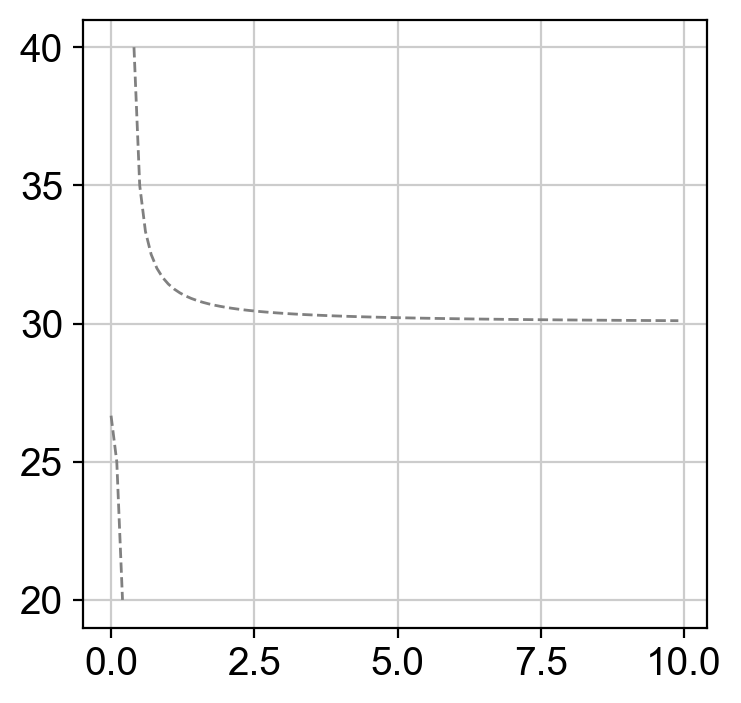

In [207]:
plt.plot(x, y, c='gray', ls='--', lw=1)
plt.show()

In [197]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


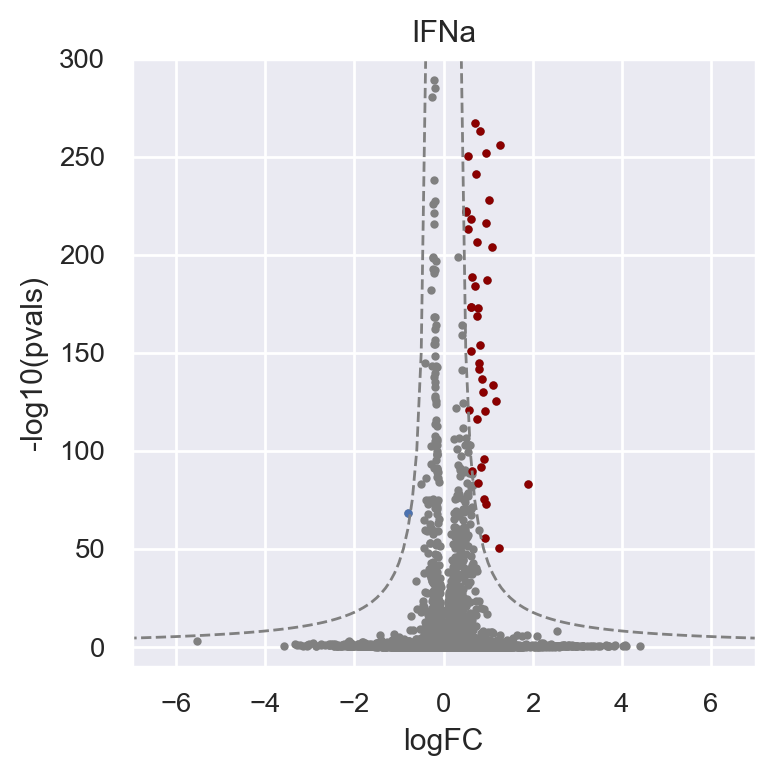

['IFI6' 'IFI27' 'IFITM3' 'IFI44L' 'BST2' 'ISG15' 'MX1' 'B2M' 'XAF1'
 'HLA-B' 'LY6E' 'HLA-A' 'HLA-C' 'IFIT1' 'STAT1' 'IFI44' 'PLSCR1' 'OAS2'
 'LGALS3BP' 'EIF2AK2' 'HERC6' 'OAS1' 'MX2' 'IFIT3' 'IFITM1' 'TYMP' 'SP100'
 'EPSTI1' 'SAMD9' 'PARP9' 'TRIM22' 'UBE2L6' 'DDX60' 'IFI35' 'PSME2'
 'ISG20' 'IRF7' 'MDK' 'HLA-E' 'PLAAT4' 'ODF3B' 'PSMB8' 'PARP14' 'IRF9'
 'RNF213' 'OAS3' 'LAP3' 'IFITM2' 'ADAR' 'HLA-F' 'SP110' 'SAMD9L' 'TGM2'
 'RTP4' 'MSMB' 'DDX58' 'CMPK2' 'REC8' 'HERC5' 'PSMB9' 'RSAD2' 'IFIH1'
 'HSH2D' 'IFIT5' 'RAMP1' 'PPM1K' 'MUC5AC' 'USP18' 'SERPINA1' 'DHX58'
 'MUC13']


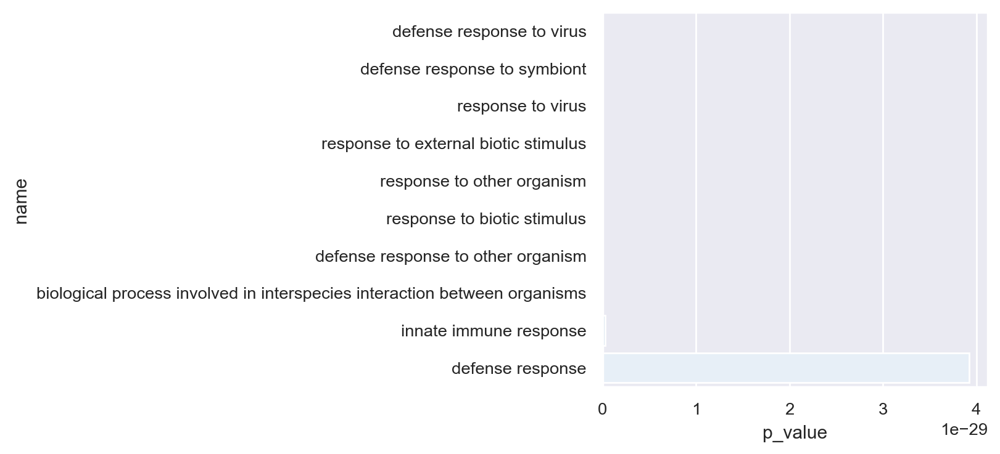

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


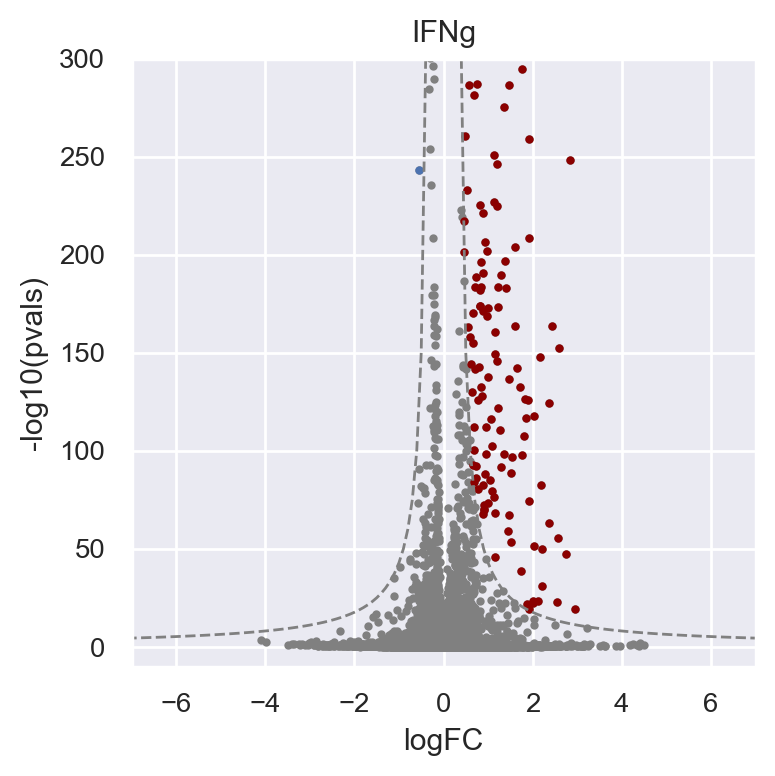

['HLA-B' 'B2M' 'HLA-A' 'HLA-C' 'PSMB9' 'CD74' 'HLA-DRA' 'HLA-E' 'STAT1'
 'WARS1' 'PSMB8' 'HLA-F' 'HLA-DPA1' 'PSME2' 'IRF1' 'HLA-DRB1' 'HLA-DPB1'
 'GBP1' 'PSME1' 'TAP1' 'PLAAT4' 'HLA-DQB1' 'GBP4' 'TYMP' 'LAP3' 'UBE2L6'
 'SERPING1' 'BST2' 'IDO1' 'HLA-DMA' 'IFITM3' 'TNFSF10' 'HLA-DQA1' 'CXCL9'
 'GBP2' 'GBP5' 'RNF213' 'APOL6' 'EPSTI1' 'MT2A' 'MDK' 'APOL1' 'XAF1'
 'IFIT3' 'TMSB10' 'IFI27' 'CXCL11' 'IFI6' 'IFI44L' 'CXCL10' 'TAP2' 'IFI35'
 'ISG20' 'HLA-DMB' 'TAPBP' 'BTN3A2' 'ISG15' 'SAMD9L' 'PARP14' 'ETV7'
 'CTSS' 'PSMA4' 'OPTN' 'IFITM1' 'MX1' 'PARP9' 'IL18BP' 'MCUB' 'SP110'
 'TNFRSF14' 'C1R' 'APOL2' 'TRIM22' 'NUPR1' 'SP100' 'PSMB10' 'DUOX2'
 'GSTK1' 'SAMHD1' 'DUOXA2' 'CD40' 'LGALS3BP' 'IFIT2' 'NUB1' 'DDX60' 'GBP3'
 'LY6E' 'CD38' 'ODF3B' 'BTN3A1' 'CLEC2B' 'PDIA3' 'HAPLN3' 'OAS1' 'RTP4'
 'TRIM69' 'CLIC3' 'HLA-DRB5' 'PML' 'TGM2' 'TNFSF13B' 'NMI' 'ZNFX1' 'CASP1'
 'SECTM1' 'IRF9' 'IFIH1' 'SAMD9' 'CFB' 'C19orf38' 'BTN3A3' 'CASP4' 'FBXO6'
 'RBCK1' 'VAMP5' 'HLA-DOA' 'ERAP2' 'TF' 'CBR3' 'CX3CL1' 'CII

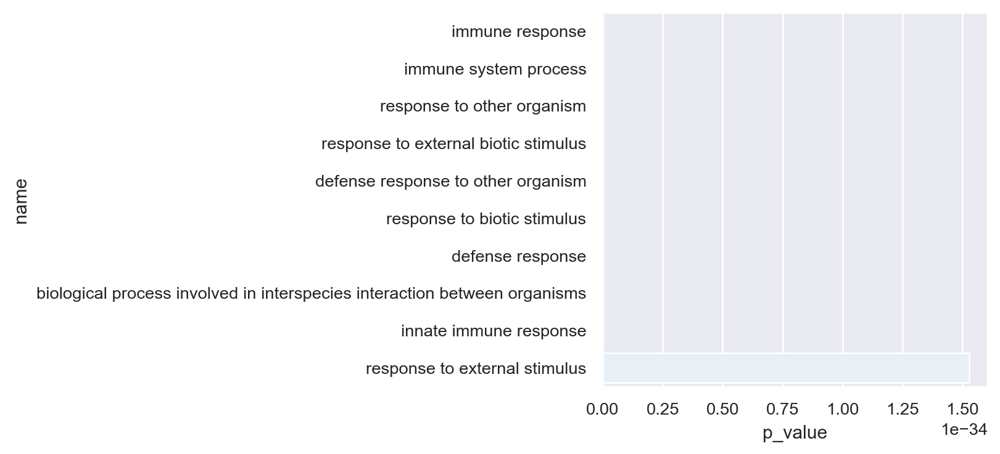

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


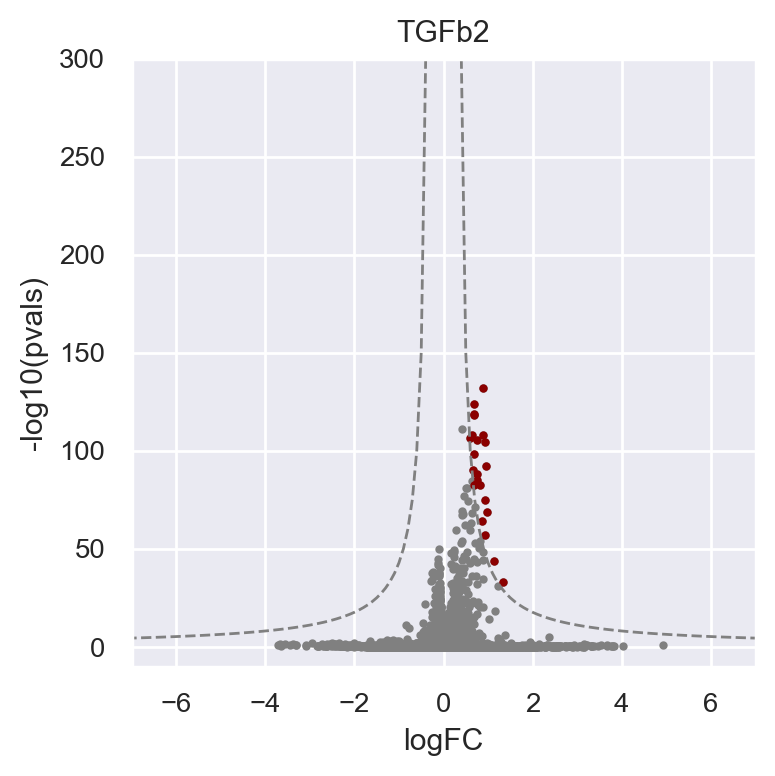

['IFIT1' 'MX1' 'IFI6' 'ISG15' 'MX2' 'BST2' 'SAMD9' 'IFIT3' 'IFIT2' 'OAS1'
 'RSAD2' 'IFI35' 'EPSTI1' 'OAS3' 'IFITM1' 'OAS2' 'OASL' 'HERC5' 'CMPK2'
 'TNFSF13B' 'MMP10' 'COMP']


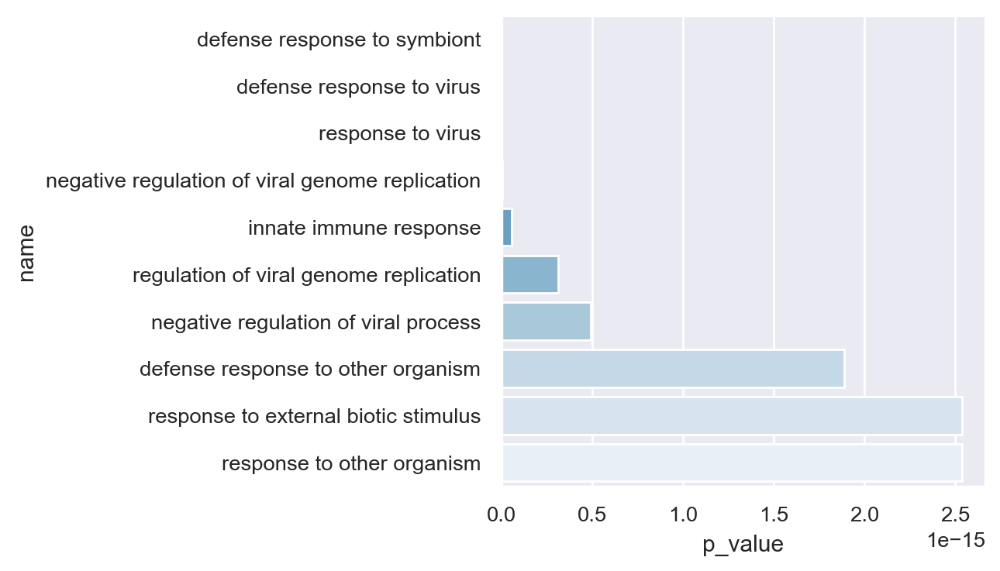

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


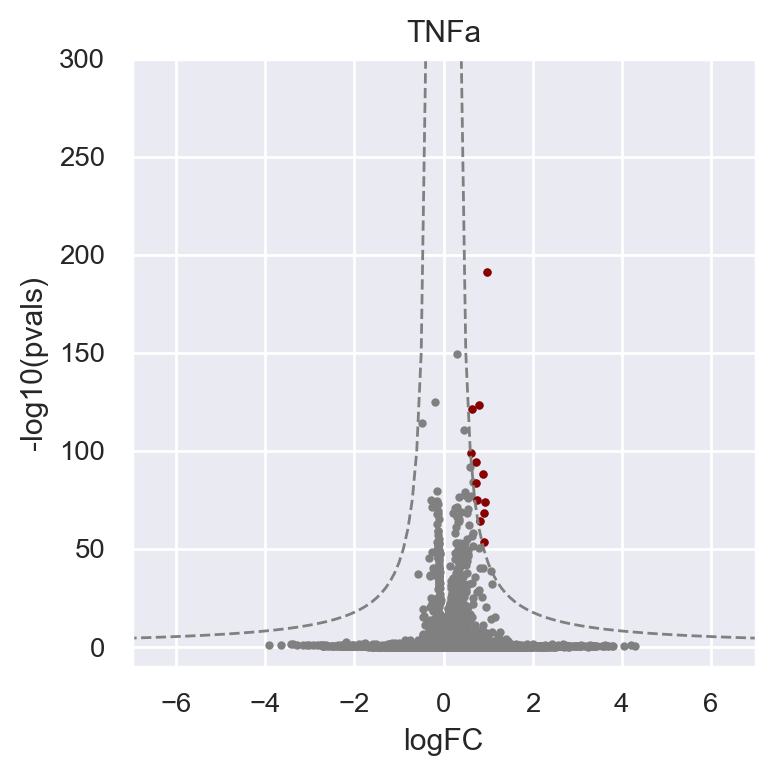

['TNFAIP2' 'MSMB' 'SLC34A2' 'BST2' 'IFIT3' 'IFIT2' 'IFIT1' 'MX2' 'CXCL10'
 'OASL' 'RSAD2' 'HERC5']


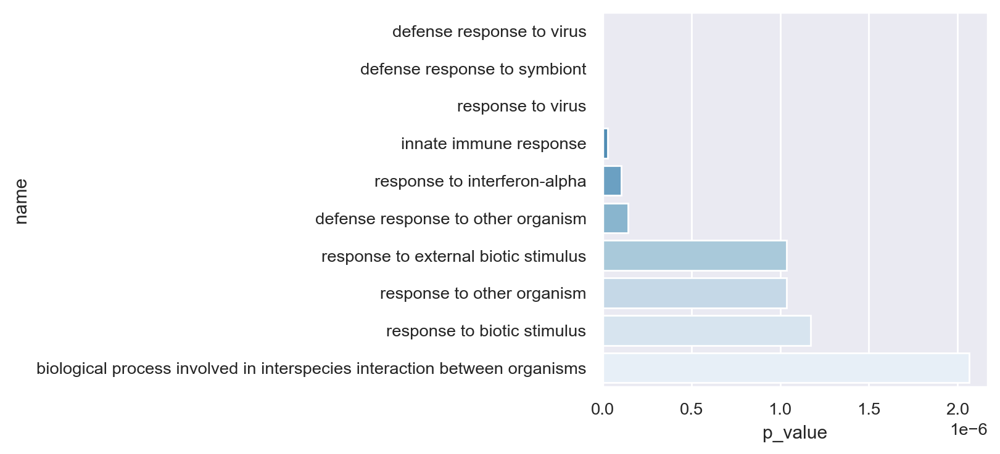

Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


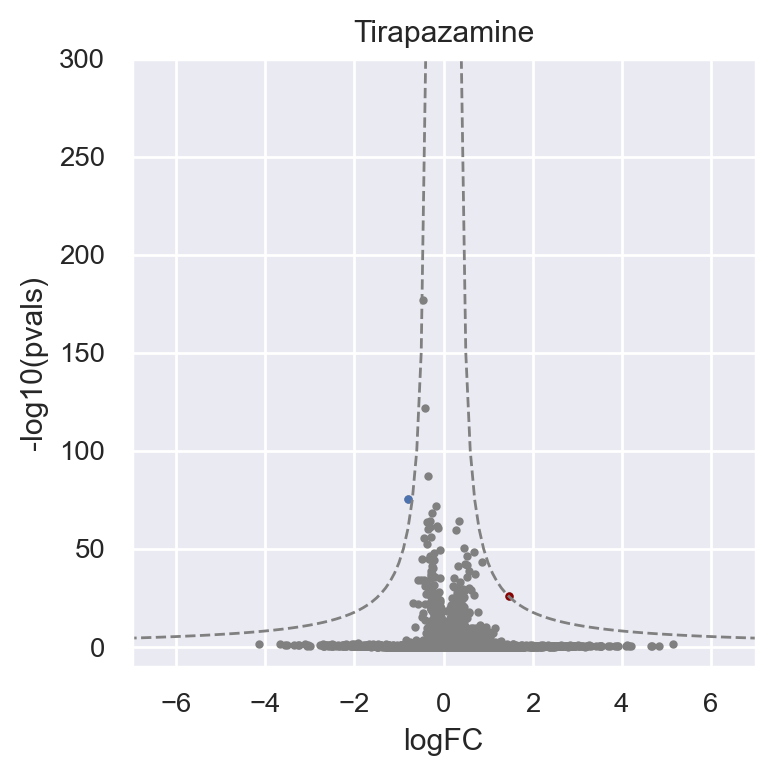

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


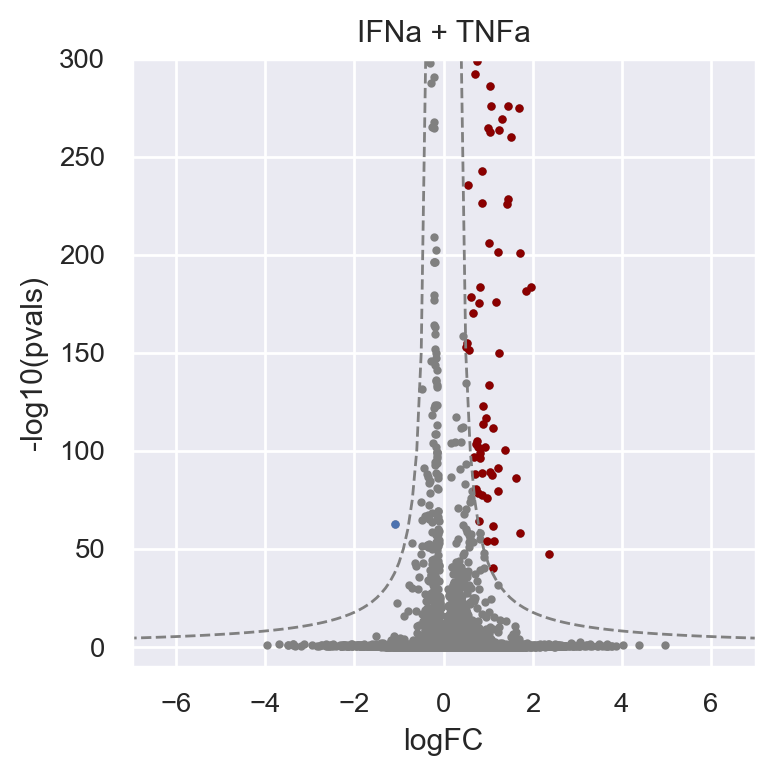

['IFI6' 'IFI27' 'IFI44L' 'IFITM3' 'ISG15' 'MX1' 'XAF1' 'B2M' 'BST2'
 'HLA-B' 'IFIT1' 'LY6E' 'STAT1' 'HLA-A' 'TYMP' 'IFIT3' 'HLA-C' 'IFI44'
 'OAS2' 'EIF2AK2' 'HERC6' 'MX2' 'PLSCR1' 'OAS1' 'IFITM1' 'EPSTI1' 'SP100'
 'IFI35' 'TRIM22' 'PARP9' 'LGALS3BP' 'PSMB8' 'PSME2' 'PARP14' 'IRF7'
 'DDX60' 'UBE2L6' 'ODF3B' 'LAP3' 'HLA-F' 'PSMB9' 'OAS3' 'ADAR' 'IFI16'
 'DDX58' 'IRF9' 'RNF213' 'SP110' 'IFIH1' 'RSAD2' 'HERC5' 'ISG20' 'CMPK2'
 'TAPBP' 'SAMD9L' 'SAMD9' 'PLAAT4' 'MT2A' 'HLA-E' 'CD74' 'PPM1K' 'TNFAIP2'
 'DTX3L' 'TRIM14' 'RTP4' 'IFIT5' 'STAT2' 'LGALS9' 'SAMHD1' 'NMI' 'USP18'
 'TAP1' 'NT5C3A' 'ZNFX1' 'HSH2D' 'IL32' 'SHFL' 'APOL6' 'PARP12' 'LAMP3'
 'PML' 'DDX60L' 'PNPT1' 'REC8' 'IFIT2' 'MMP7' 'OASL' 'C1S' 'DHX58' 'C1R'
 'GGT5' 'TNFSF13B']


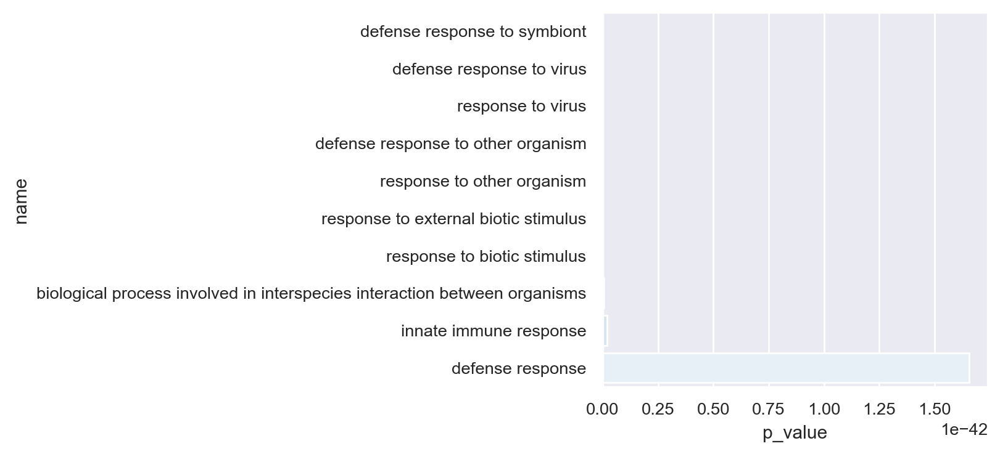

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


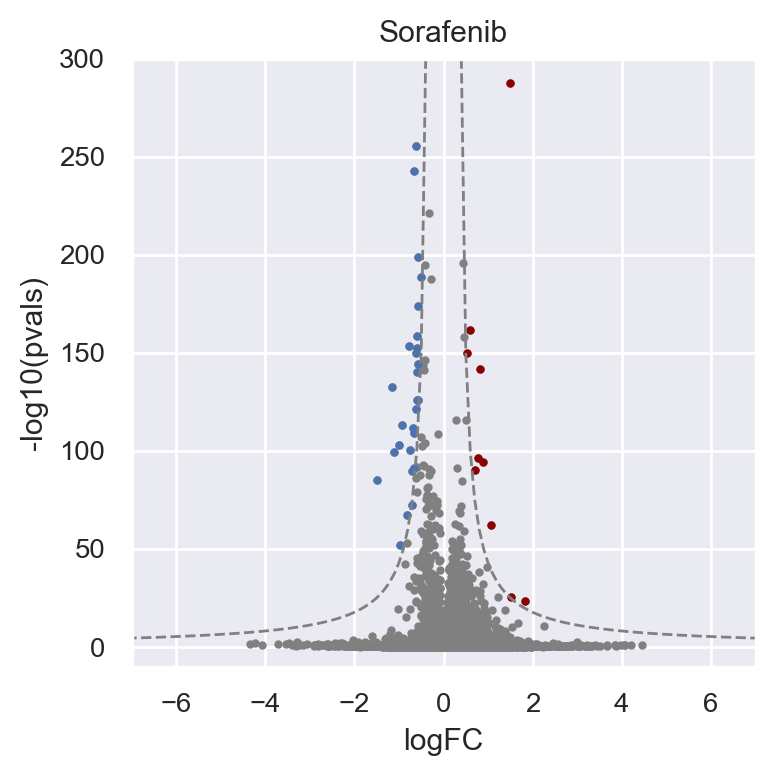

['CYP1B1' 'FOS' 'ID1' 'DDIT4' 'SCD' 'LGALS1' 'DUSP6' 'SPRY1' 'VCAN'
 'TMEM156']


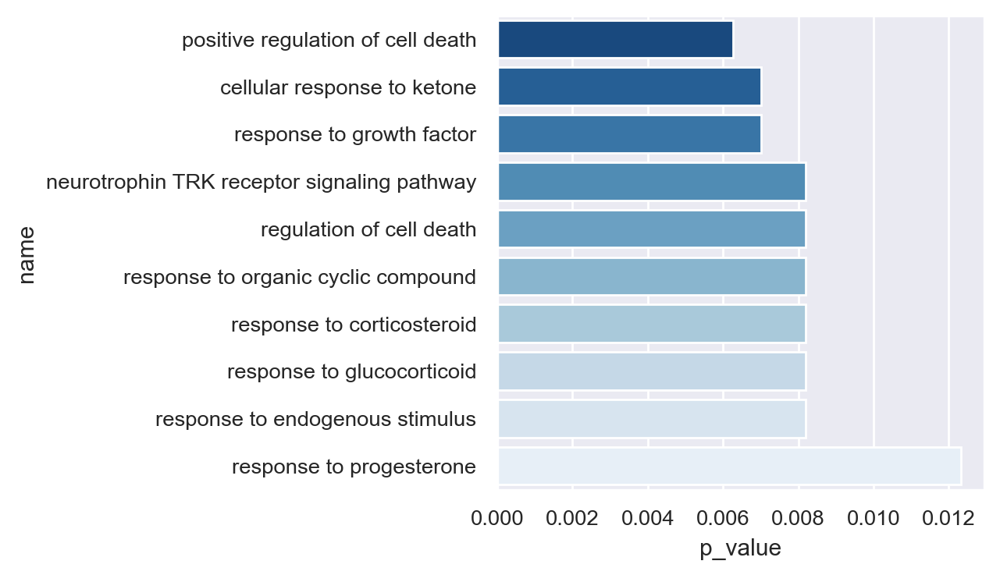

['PDK4' 'PRDM1' 'FOSL1' 'EDN2' 'SLC25A25' 'ITPKC' 'APOBEC3A' 'PLAUR' 'ADM'
 'AVPI1' 'EGR3' 'LBH' 'CD55' 'RNF39' 'AQP5' 'ANKRD37' 'ERRFI1' 'S100P'
 'AREG' 'PLAC8' 'ZNF750' 'GSTA1' 'NR4A1' 'CLDN4' 'ATF3' 'DUSP5' 'NCOA7']


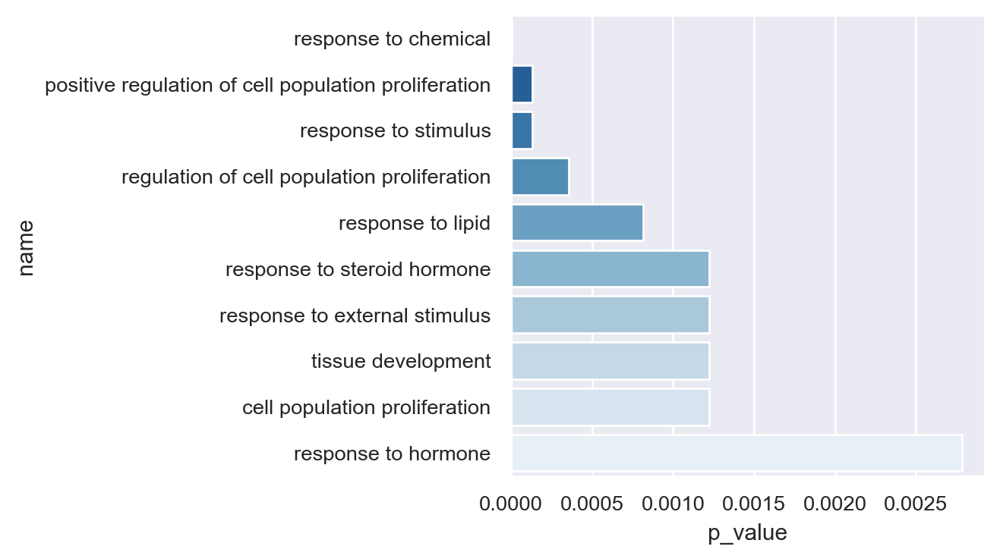

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


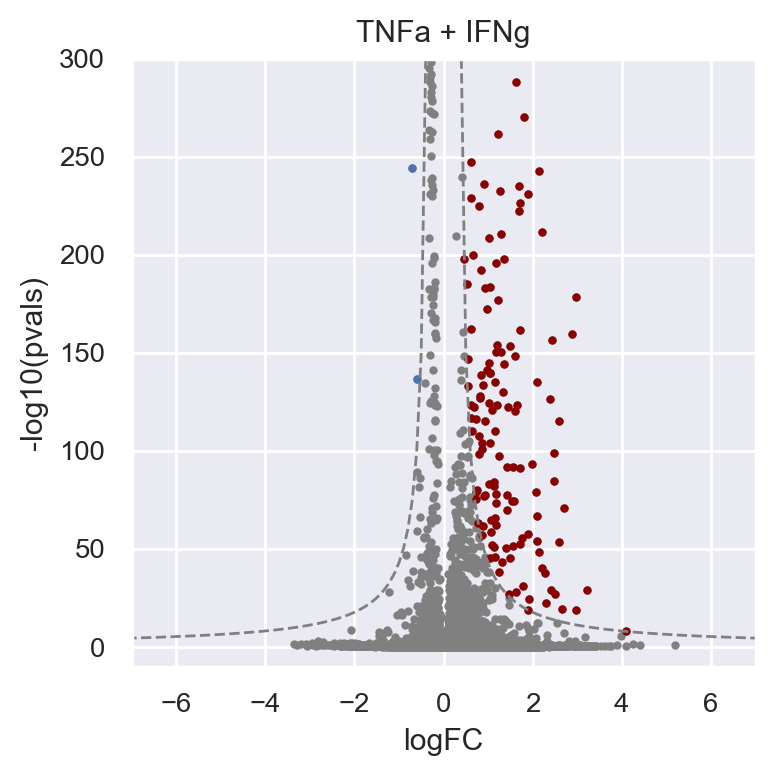

['HLA-B' 'B2M' 'HLA-A' 'HLA-C' 'CD74' 'HLA-DRA' 'PSMB9' 'HLA-E' 'STAT1'
 'PSMB8' 'HLA-F' 'HLA-DPA1' 'HLA-DRB1' 'PSME2' 'WARS1' 'TYMP' 'PSME1'
 'PLAAT4' 'HLA-DPB1' 'BST2' 'IRF1' 'TAP1' 'HLA-DQA1' 'IFI27' 'HLA-DQB1'
 'GBP1' 'UBE2L6' 'IFITM3' 'HLA-DMA' 'TMSB10' 'LAP3' 'TNFSF10' 'GBP4'
 'IDO1' 'IFI6' 'TAPBP' 'XAF1' 'IL32' 'RNF213' 'APOL6' 'EPSTI1' 'IFIT3'
 'IFI44L' 'MDK' 'MT2A' 'ISG15' 'SERPING1' 'PARP14' 'IFI35' 'MX1' 'OPTN'
 'CXCL9' 'GBP2' 'ISG20' 'CTSS' 'APOL1' 'SAMD9L' 'HLA-DMB' 'PARP9' 'LY6E'
 'C1R' 'TAP2' 'TRIM22' 'IFITM1' 'SAA1' 'CFB' 'PSMA4' 'SP100' 'BTN3A2'
 'CXCL10' 'ODF3B' 'TNFRSF14' 'DNAJA1' 'TNFAIP2' 'DYNLT1' 'OAS1' 'CD47'
 'NUPR1' 'SP110' 'CLIC3' 'C1S' 'SAA2' 'TGM2' 'ETV7' 'ID1' 'CD38' 'CXCL11'
 'SAMHD1' 'IFIT2' 'IRF9' 'IFIH1' 'APOL2' 'LGALS3BP' 'GBP3' 'PSMB10' 'NMI'
 'PML' 'ZNFX1' 'NUB1' 'TNFSF13B' 'OAS2' 'LGALS9' 'SPATS2L' 'DDX60' 'SCO2'
 'UBD' 'PDZK1IP1' 'RTP4' 'MCUB' 'CD40' 'GLRX' 'TRIM69' 'PLSCR1' 'IFIT1'
 'HAPLN3' 'MARCKSL1' 'TRIM31' 'C3' 'DTX3L' 'OAS3' 'ADAR' 'SLC34A2'

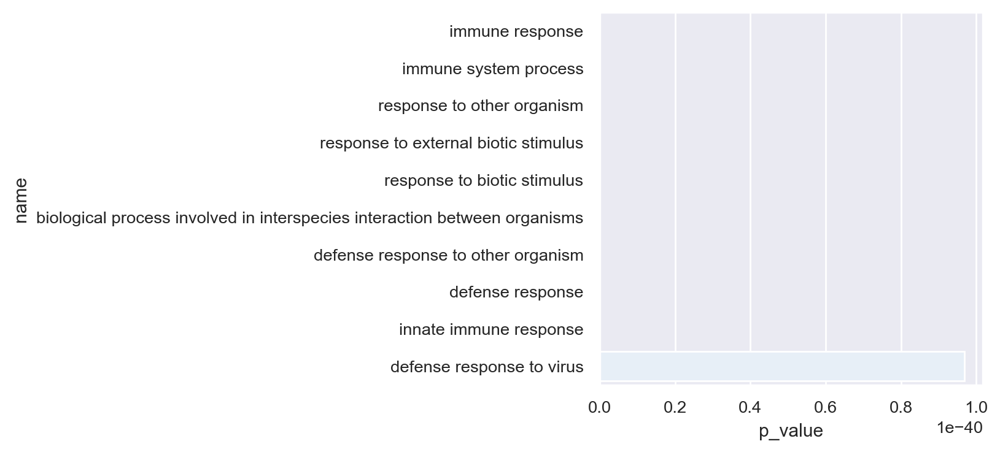

TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


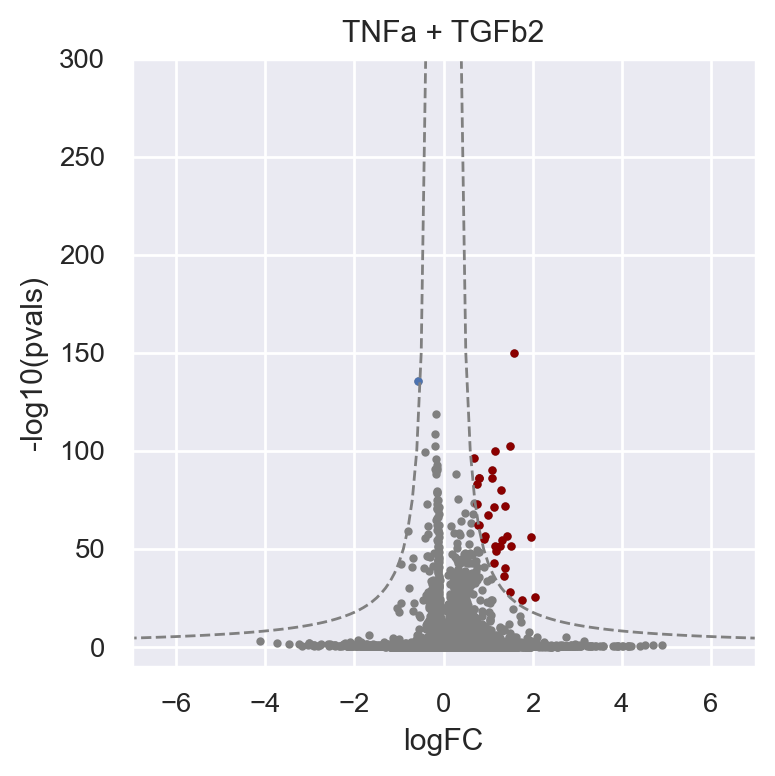

['IL32' 'CST6' 'MMP7' 'TYMP' 'IFIT3' 'PMEPA1' 'IFIT1' 'MX1' 'BST2' 'IFIT2'
 'ANXA3' 'RSAD2' 'MX2' 'EPSTI1' 'IFI35' 'IFI44L' 'HERC5' 'DDX58' 'ANKRD1'
 'OAS3' 'OASL' 'TNFSF13B' 'CXCL10' 'CMPK2' 'NCF2' 'VIM' 'LAMP3' 'GMPR'
 'CD38' 'GGT5' 'COL4A2']


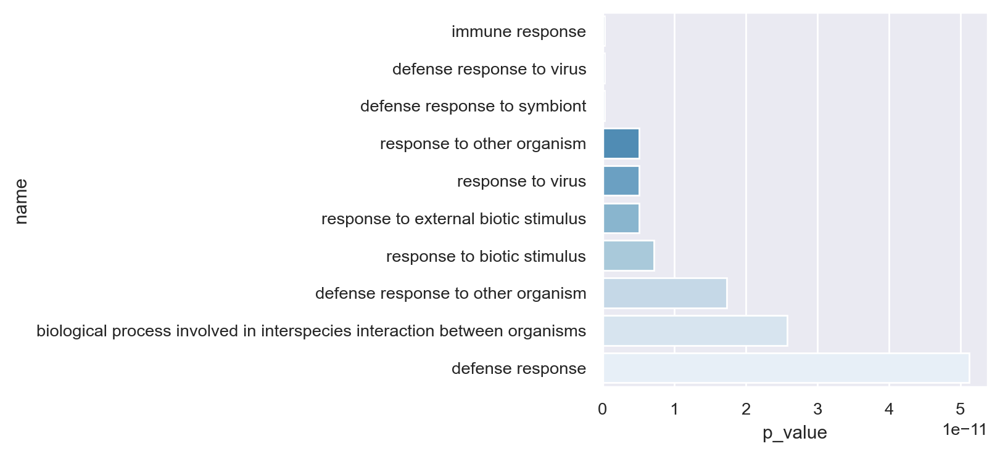

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


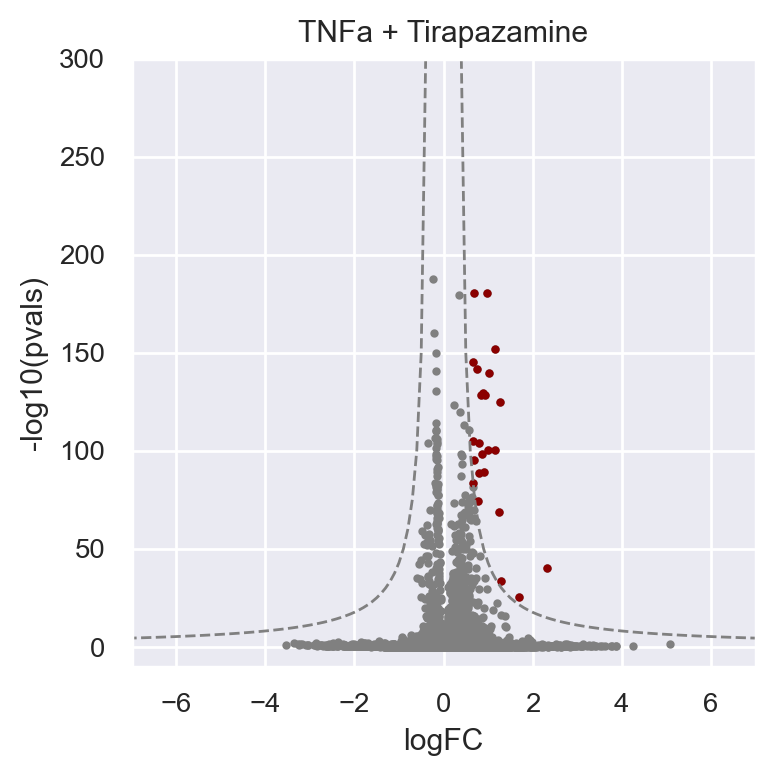

['SLC34A2' 'CD74' 'TNFAIP2' 'HLA-DRA' 'HLA-DRB1' 'MSMB' 'SAA1' 'CAPN13'
 'CXCL8' 'IL32' 'C3' 'RARRES1' 'MMP7' 'HLA-DQA1' 'SAA2' 'TGM2' 'BPIFA1'
 'BCL2A1' 'CXCL2' 'ICAM1' 'TCIM' 'GGT5' 'UBD' 'HP']


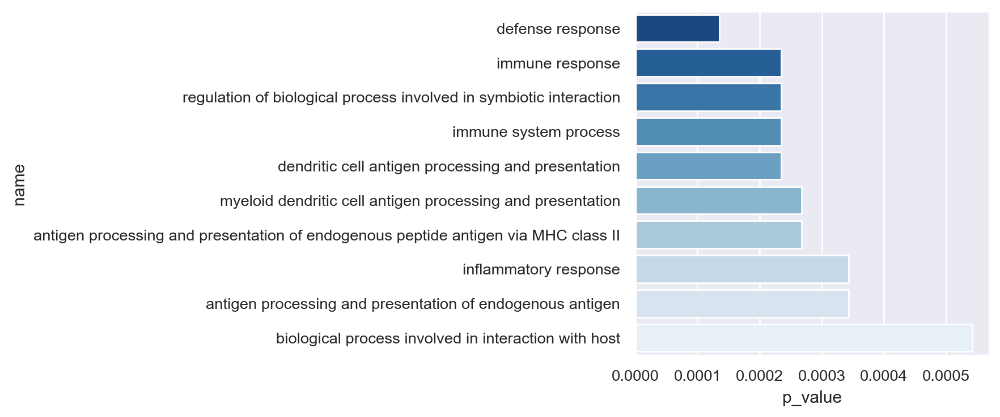

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [ ]:
def plot_sets(treatments, subset, fc_thresh=.3, logpval_thresh=30):
    """Plots volcano plots, runs enrichment, and records up-dn genes for treatment in treatments.
    Patient specific.
    """
    num_up_dn = {}
    up_dn_genes = {}
    sc.tl.rank_genes_groups(subset, groupby='treatment', reference='mock')
    for trt in treatments:
        print(trt)
        df, up, dn = plot_volcano(sc.get.rank_genes_groups_df(subset, group=trt), fc_thresh=fc_thresh, logpval_thresh=logpval_thresh)
        plt.title(trt)
        plt.show()

        diff_genes = list(up) + list(dn)
        num_up_dn[trt] = (len(up), len(dn))
        up_dn_genes[trt] = diff_genes
        
        # general plotting        
        if len(diff_genes) > 10 and len(up) > 1:
    #         sc.pl.dotplot(adata, groupby='cell_type', var_names=diff_genes, standard_scale='var', swap_axes=True)
            print(up)
            try:
                sns.barplot(data=enrich(up, subset.var_names).head(10), x='p_value', y='name', palette='Blues_r')
                plt.show()
            except ValueError:  # no pathways
                pass
            
        # special cases
        if trt == 'Sorafenib':
            print(dn)
            sns.barplot(data=enrich(dn, subset.var_names).head(10), x='p_value', y='name', palette='Blues_r')
            plt.show()
    return num_up_dn, up_dn_genes
         

up_dn_dict = {}
genes_dict = {}
for treatment_set, subset in [
        # patients 1, 2, 3, and 4
        (['IFNa', 'IFNg', 'TGFb2', 'TNFa', 'Tirapazamine'], adata),
        # patients 1, 3, + 4
        (['IFNa + TNFa', 'Sorafenib', 'TNFa + IFNg', 'TNFa + TGFb2', 'TNFa + Tirapazamine'], adata[adata.obs.patient != 'Patient 2']),
        # patients 3 + 4
        (['IFNL', 'IFNg + TGFb2', 'TGFb2 + Tirapazamine'], adata[adata.obs.patient.isin(['Patient 3', 'Patient 4'])]),
        # patient 4 only
        (['BB94', 'DMSO', 'Gilteritinib'], adata[adata.obs.patient == 'Patient 4'])
    ]:
    
    num, lists = plot_sets(treatment_set, subset)
    up_dn_dict = {**up_dn_dict, **num}
    genes_dict = {**genes_dict, **lists}

In [185]:
df = pd.DataFrame.from_dict(up_dn_dict, orient='index')
df.columns = ['up', 'dn']
df.sort_index()

,up,dn
BB94,0,3
DMSO,0,0
Gilteritinib,0,0
IFNL,119,6
IFNa,71,1
IFNa + TNFa,92,1
IFNg,185,1
IFNg + TGFb2,65,0
Sorafenib,10,27
TGFb2,22,0


A closer look at autophagic effect in Sorafenib.

In [186]:
genes_dict['Sorafenib']

['CYP1B1',
 'FOS',
 'ID1',
 'DDIT4',
 'SCD',
 'LGALS1',
 'DUSP6',
 'SPRY1',
 'VCAN',
 'TMEM156',
 'PDK4',
 'PRDM1',
 'FOSL1',
 'EDN2',
 'SLC25A25',
 'ITPKC',
 'APOBEC3A',
 'PLAUR',
 'ADM',
 'AVPI1',
 'EGR3',
 'LBH',
 'CD55',
 'RNF39',
 'AQP5',
 'ANKRD37',
 'ERRFI1',
 'S100P',
 'AREG',
 'PLAC8',
 'ZNF750',
 'GSTA1',
 'NR4A1',
 'CLDN4',
 'ATF3',
 'DUSP5',
 'NCOA7']

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


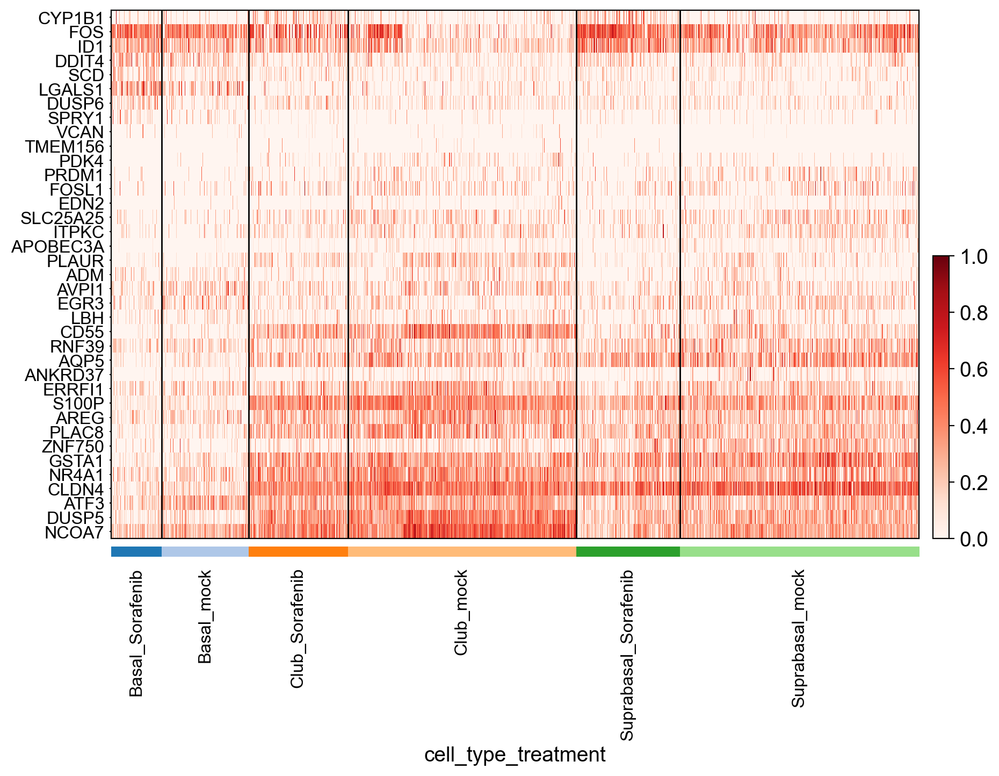

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


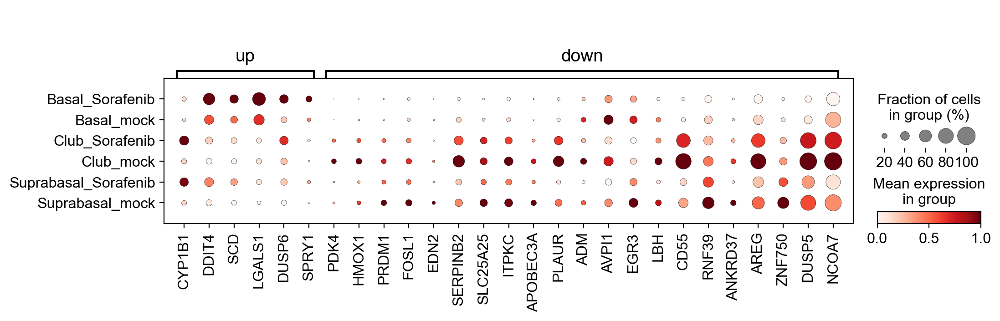

In [187]:
# sorafenib
sc.pl.heatmap(
    adata[(adata.obs.treatment.isin(['mock', 'Sorafenib'])) & (adata.obs.cell_type.isin(['Basal', 'Club', 'Suprabasal']))],
    var_names=genes_dict['Sorafenib'], groupby=['cell_type', 'treatment'], standard_scale='var', cmap='Reds', swap_axes=True)

sc.pl.dotplot(
    adata[(adata.obs.treatment.isin(['mock', 'Sorafenib'])) & (adata.obs.cell_type.isin(['Basal', 'Club', 'Suprabasal']))],
    {'up': ['CYP1B1', 'DDIT4', 'SCD', 'LGALS1', 'DUSP6', 'SPRY1'], 'down':['PDK4', 'HMOX1', 'PRDM1', 'FOSL1', 'EDN2', 'SERPINB2', 'SLC25A25', 'ITPKC', 'APOBEC3A', 'PLAUR', 'ADM', 'AVPI1', 'EGR3', 'LBH', 'CD55', 'RNF39', 'ANKRD37', 'AREG', 'ZNF750', 'DUSP5', 'NCOA7']},
    groupby=['cell_type', 'treatment'], standard_scale='var')

Also calculate cell-type specific DEGs for a subset of the treatments.

In [237]:
pd.crosstab(adata.obs.cell_type, adata.obs.treatment)

treatment,BB94,DMSO,Gilteritinib,IFNL,IFNa,IFNa + TNFa,IFNg,IFNg + TGFb2,Sorafenib,TGFb2,TGFb2 + Tirapazamine,TNFa,TNFa + IFNg,TNFa + TGFb2,TNFa + Tirapazamine,Tirapazamine,mock
cell_type,,,,,,,,,,,,,,,,,
?,1,0,2,3,969,270,366,0,285,676,3,763,118,530,235,1199,1795
Basal,641,258,675,1711,2501,2260,2554,1456,2028,2521,1541,1808,1134,1314,1148,2134,3496
Basal prolif.,52,71,55,411,361,430,259,267,676,326,285,328,209,274,255,338,633
Ciliated,203,112,168,257,252,363,275,257,360,276,262,256,324,292,272,313,390
Club,442,307,410,880,5569,4013,5756,626,4003,6019,1040,5765,3155,2940,4266,4634,9194
Deuterosomal,38,11,32,42,84,69,43,40,47,68,42,76,59,65,65,70,143
Goblet,3,7,4,16,1495,101,73,10,66,113,11,132,49,38,72,80,224
Ionocytes,4,2,2,18,56,35,54,12,28,52,6,62,32,15,34,45,89
PNEC,1,1,3,1,3,4,3,0,0,2,1,3,0,2,2,3,3


/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


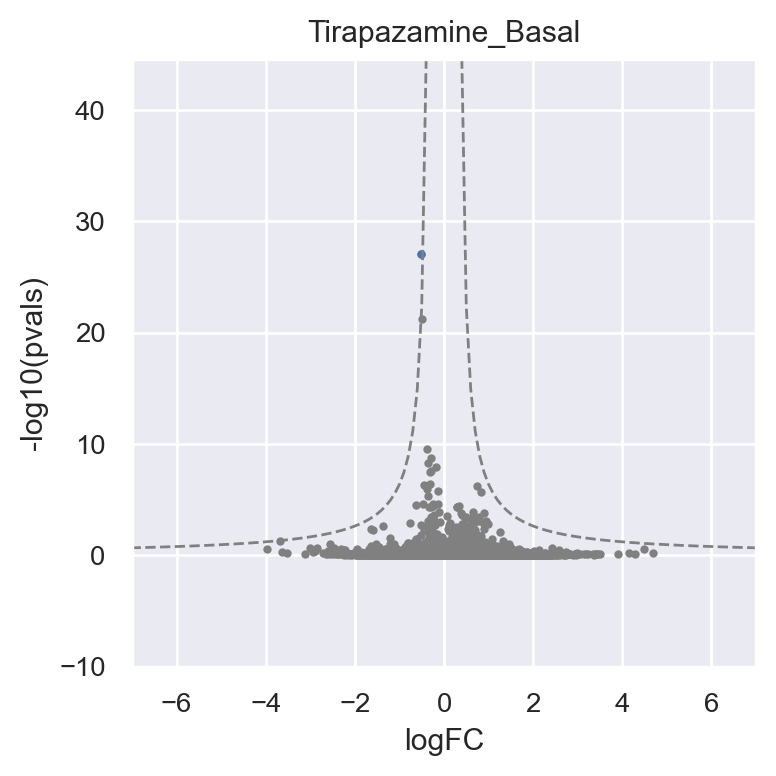

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


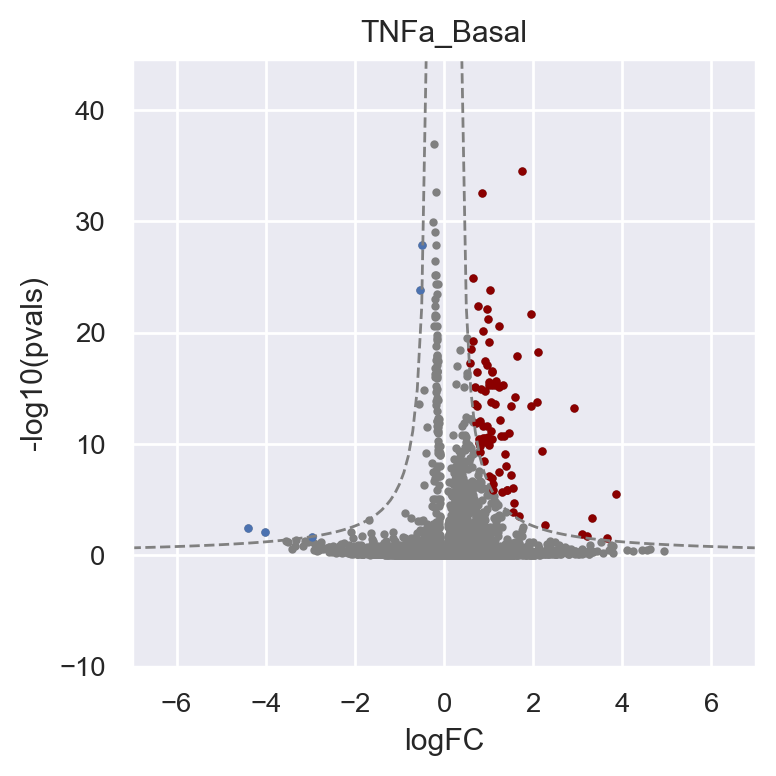

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


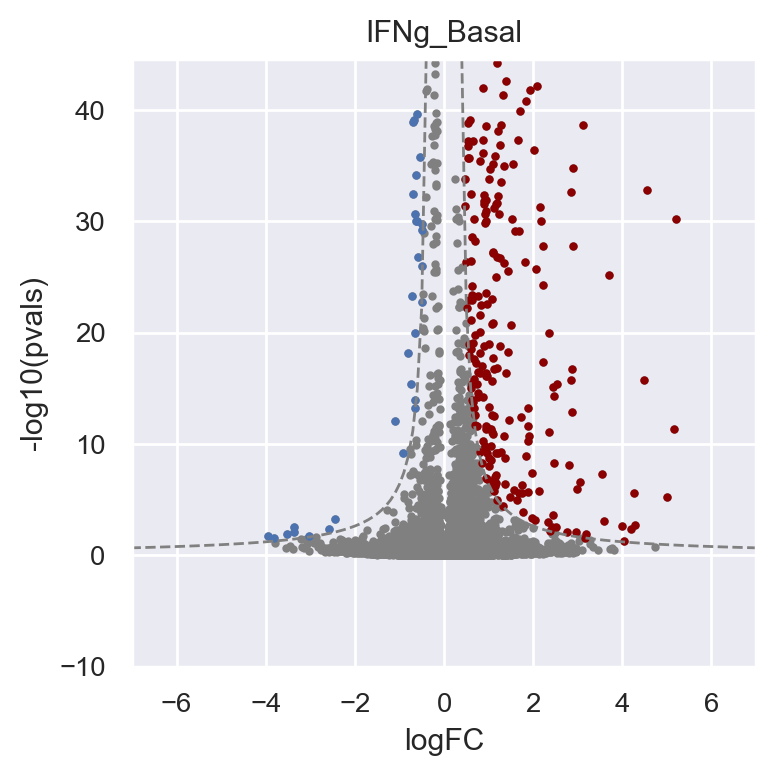

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


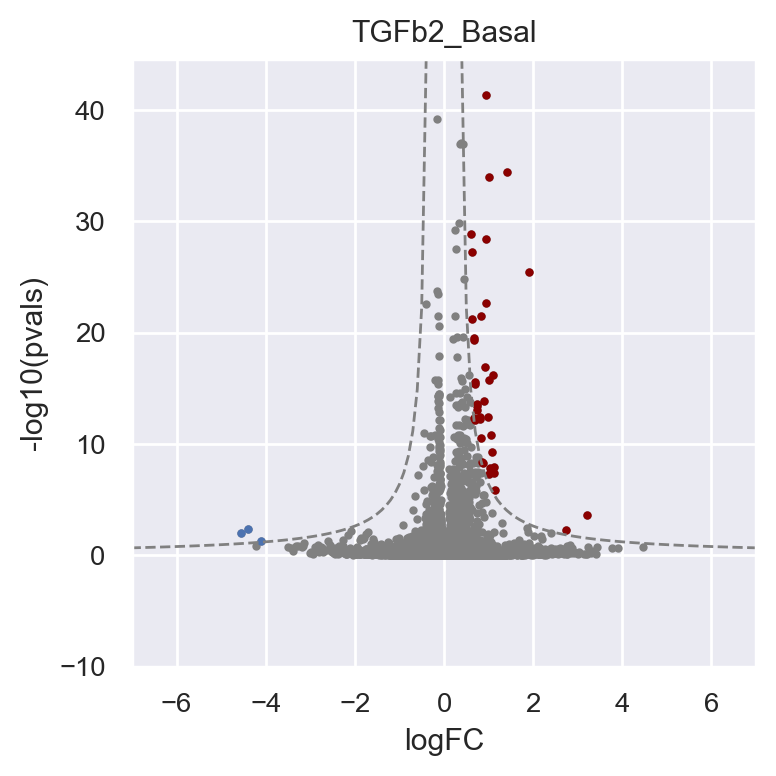

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


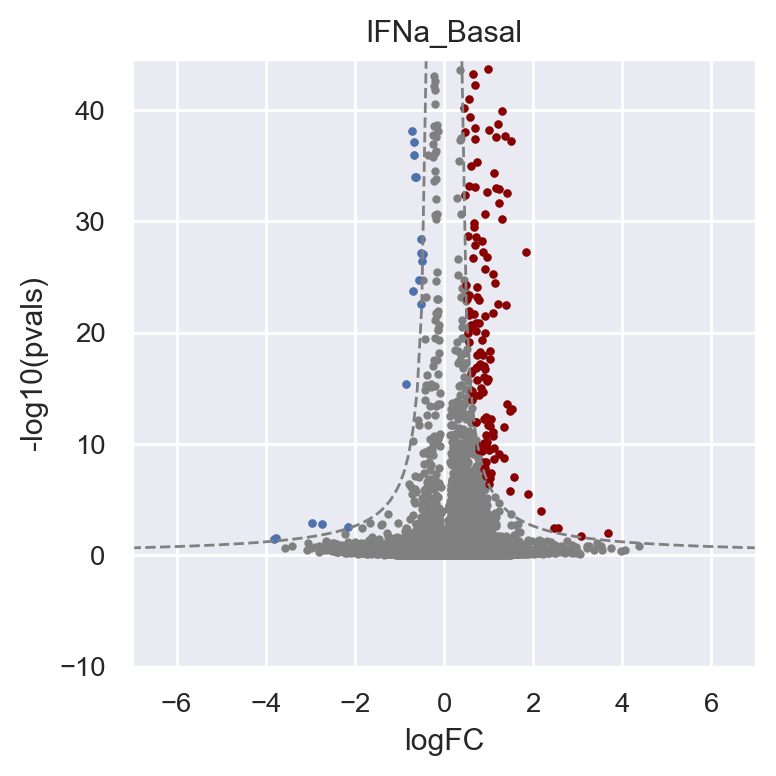

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


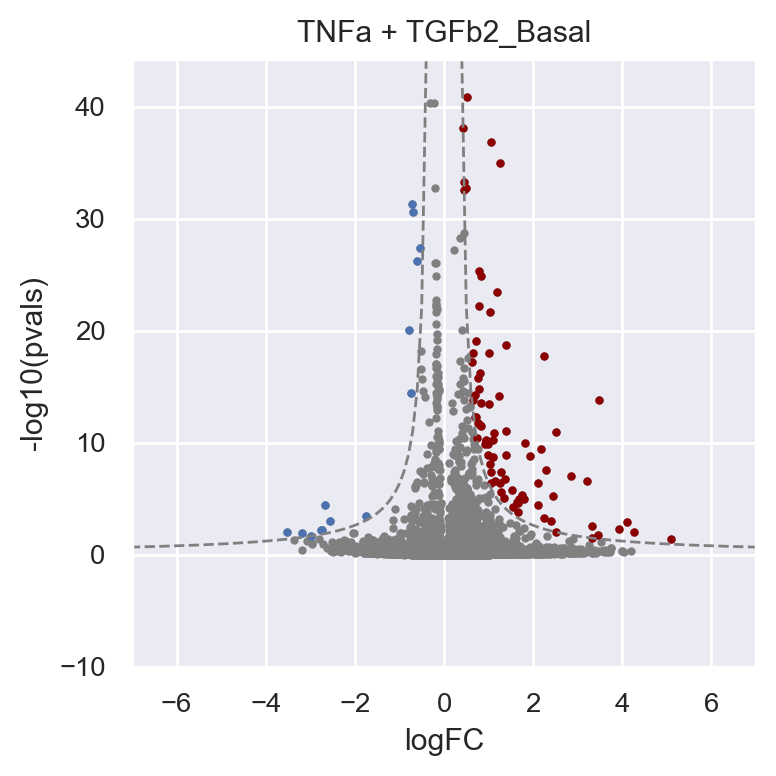

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


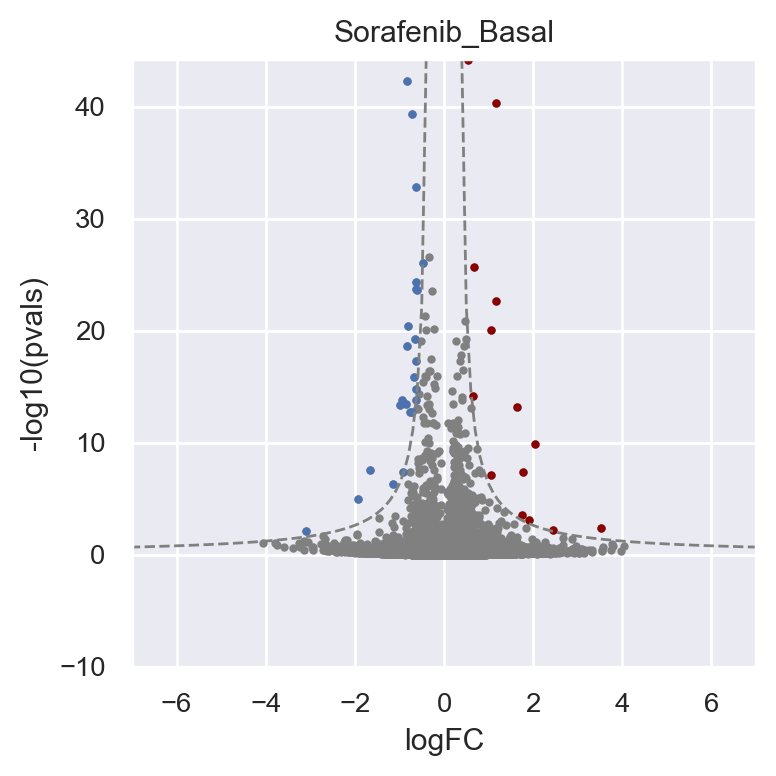

IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


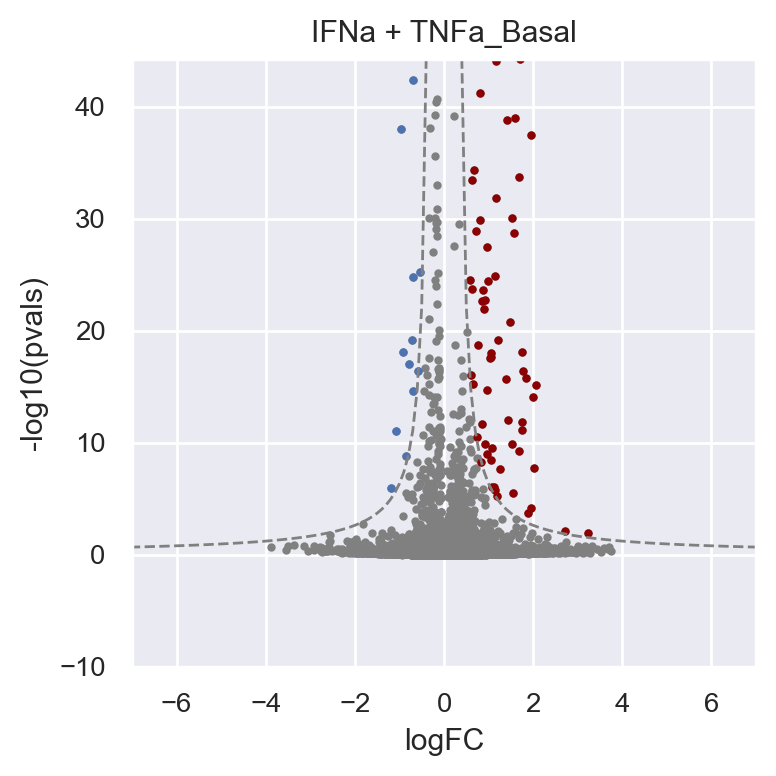

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


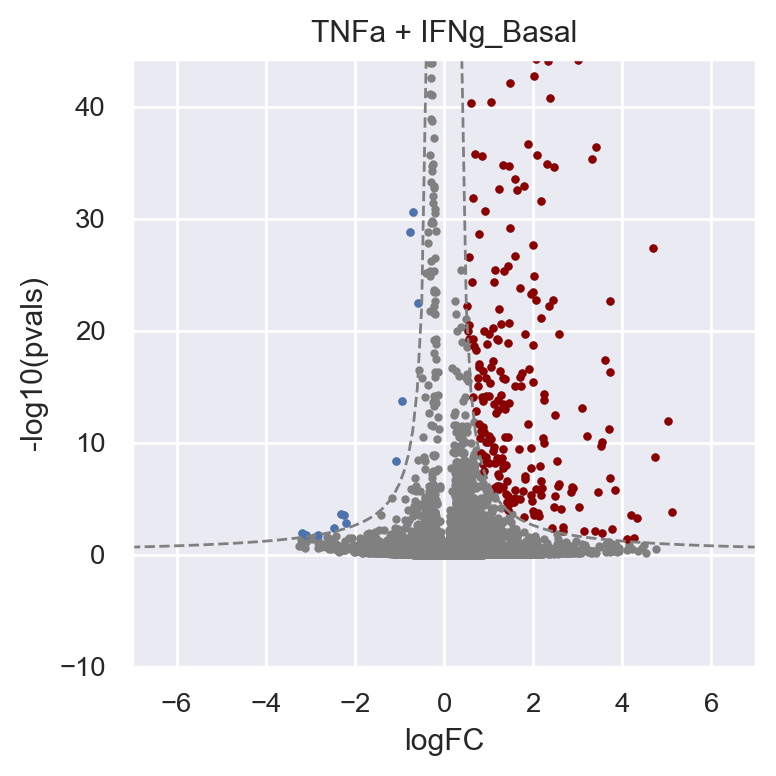

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


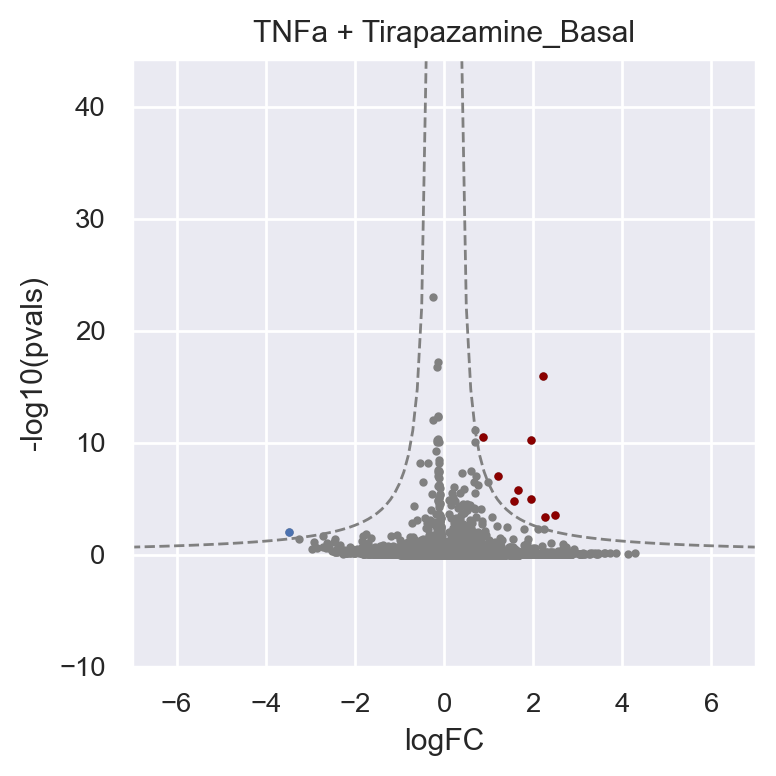

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNL


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


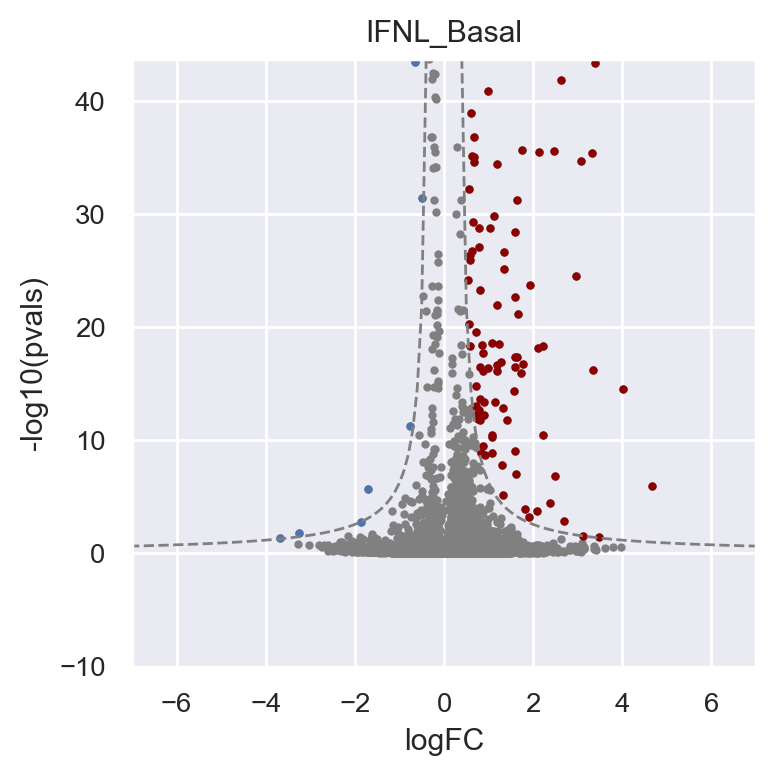

IFNg + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


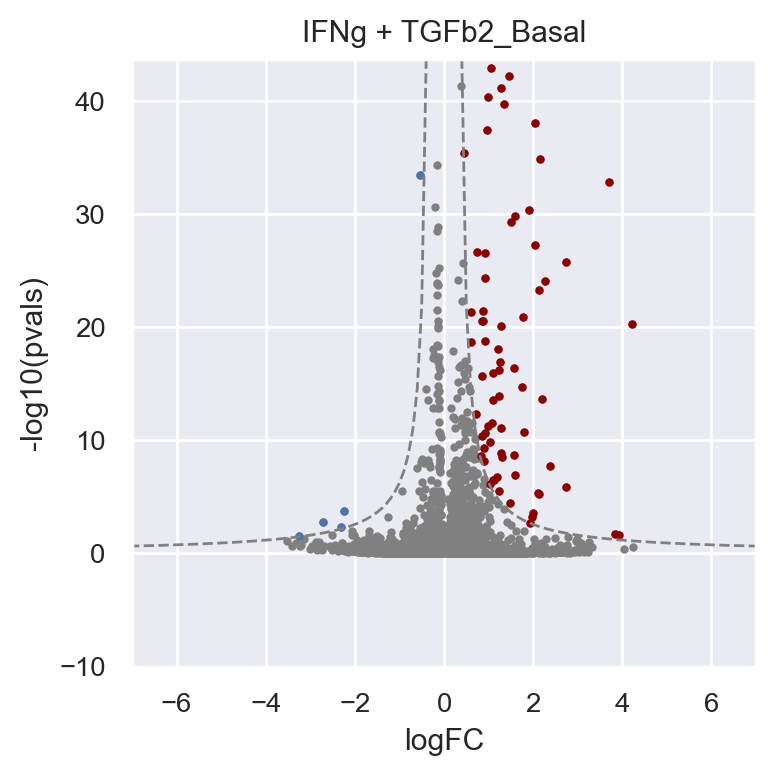

TGFb2 + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


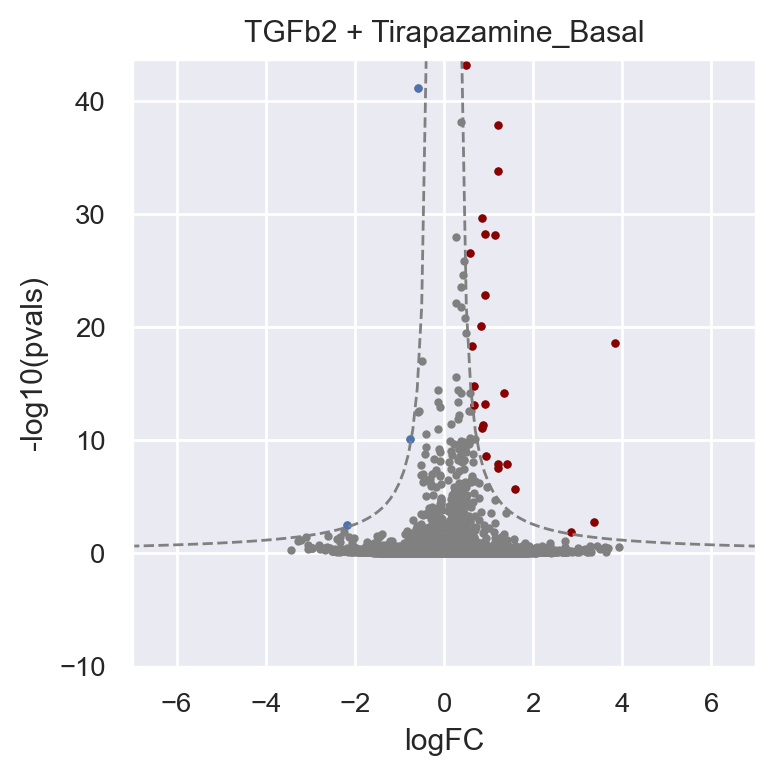

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


DMSO


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


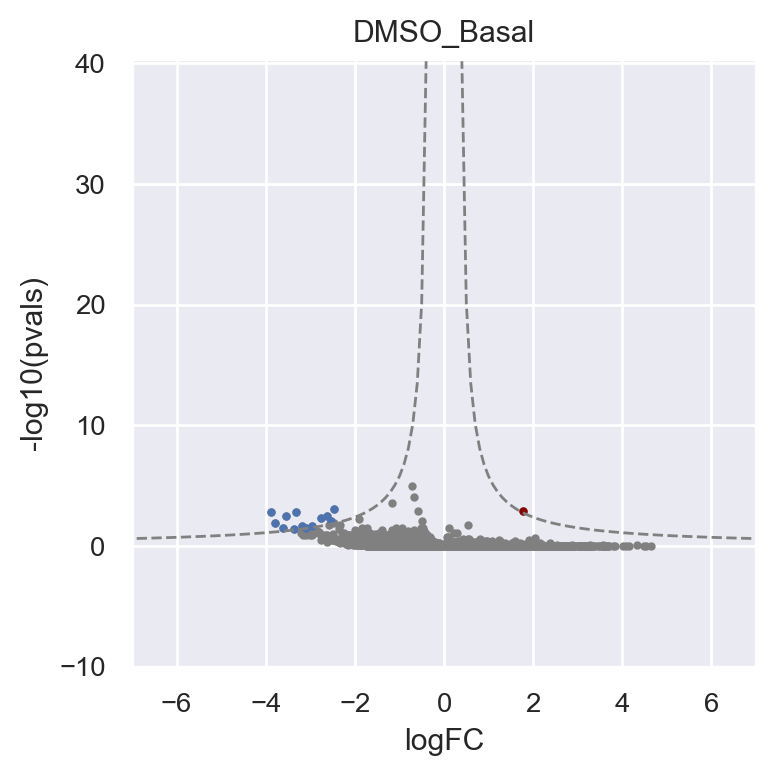

BB94


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


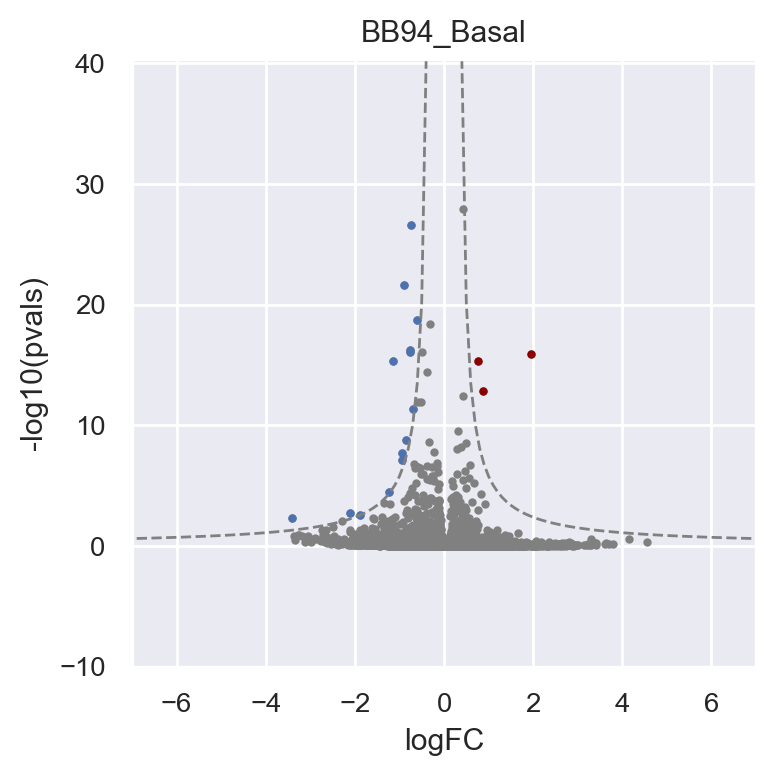

Gilteritinib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


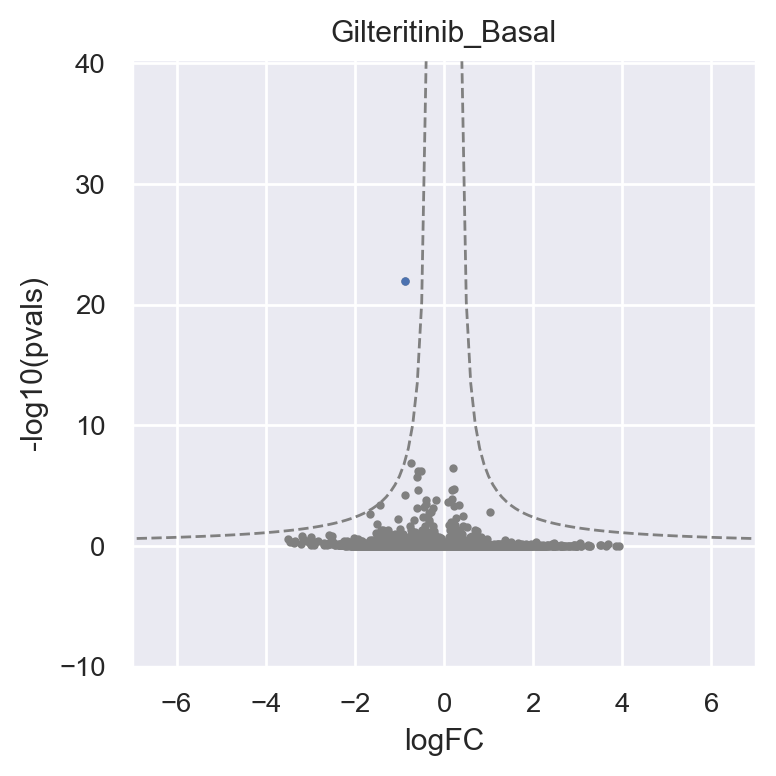

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


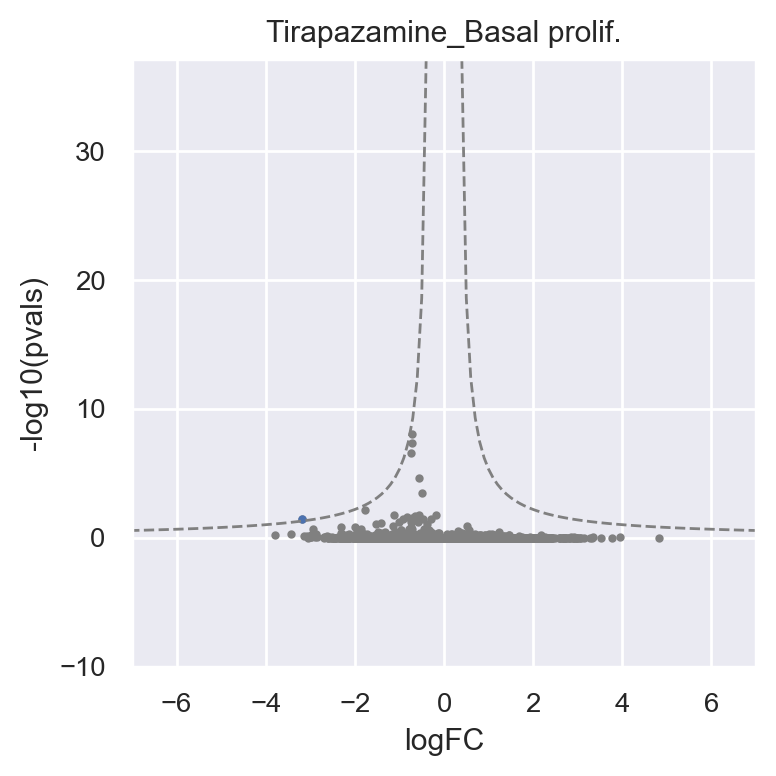

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


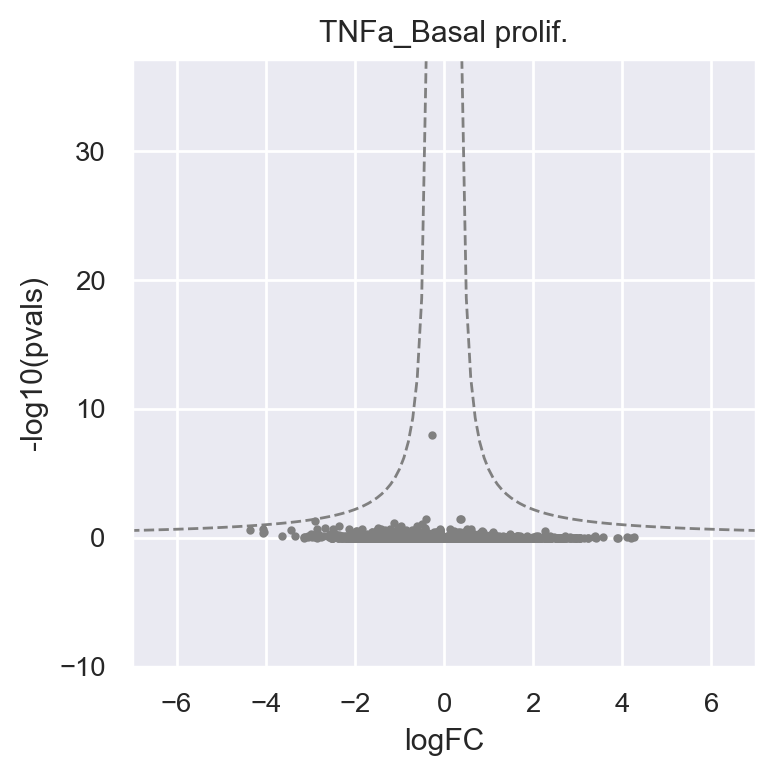

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


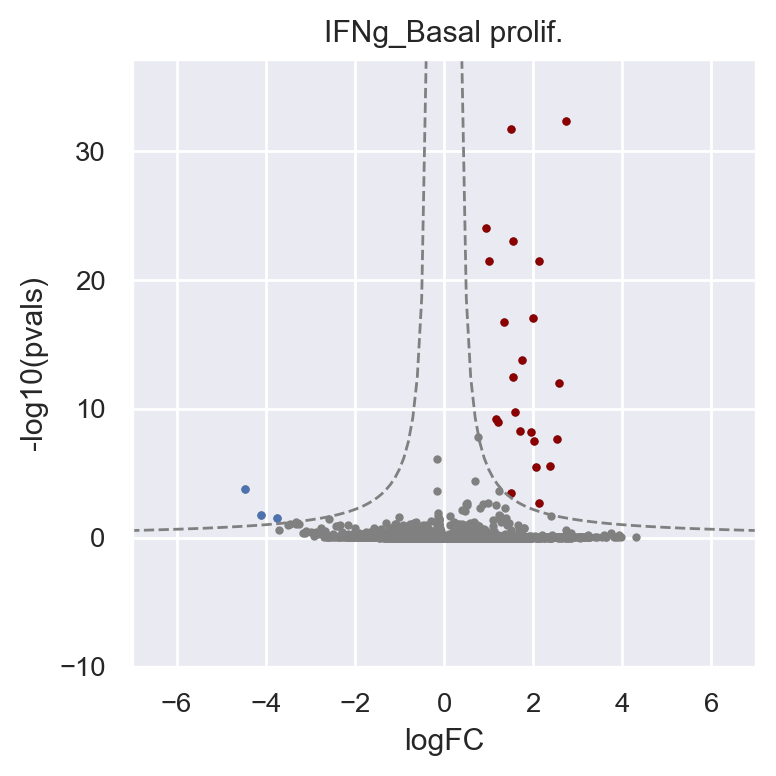

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


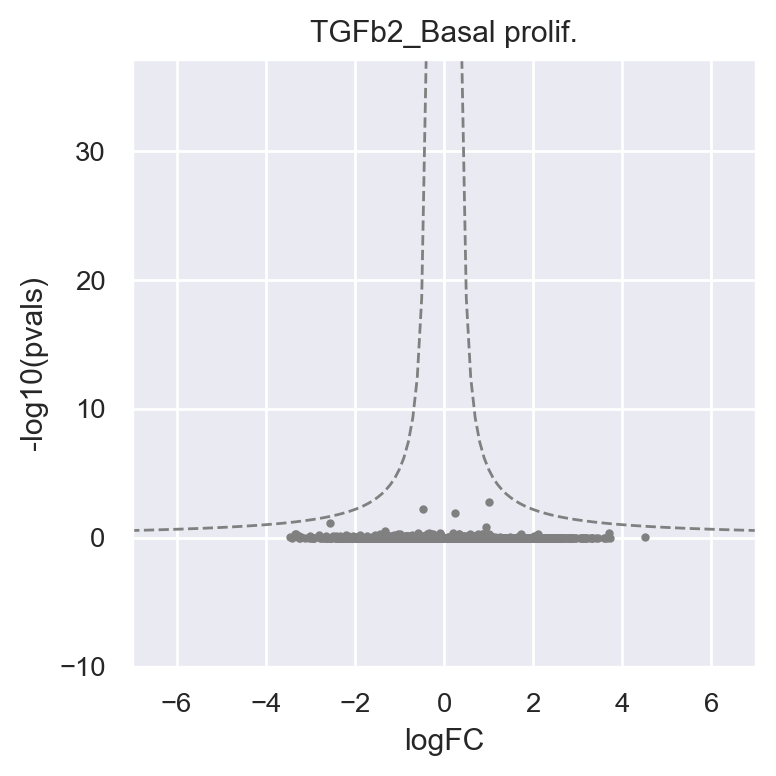

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


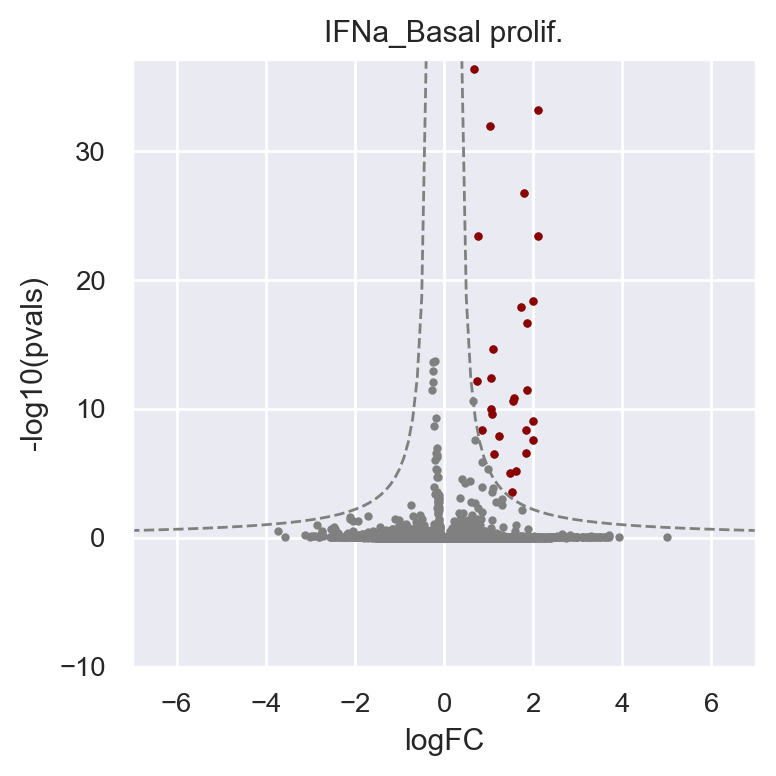

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


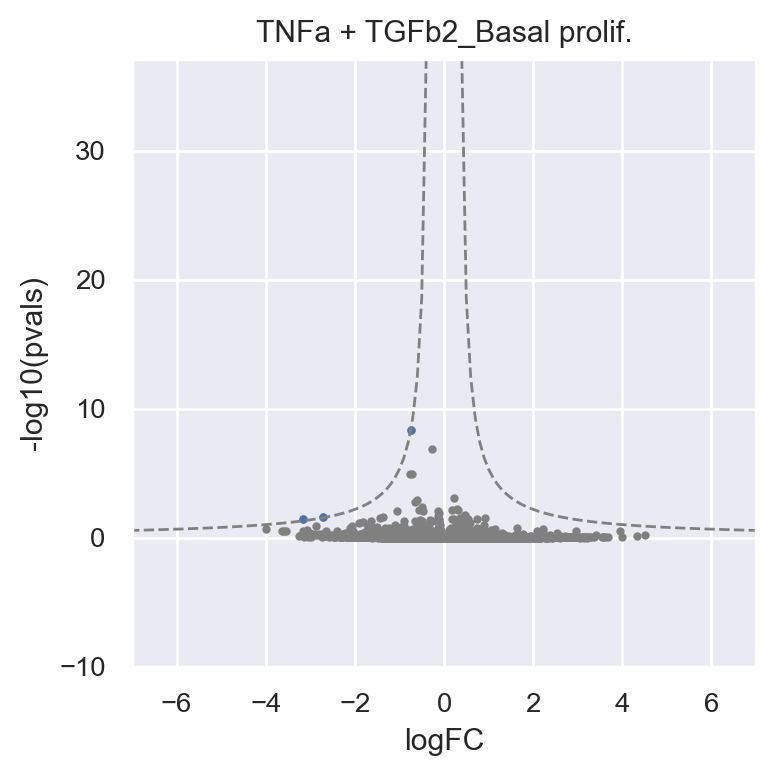

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


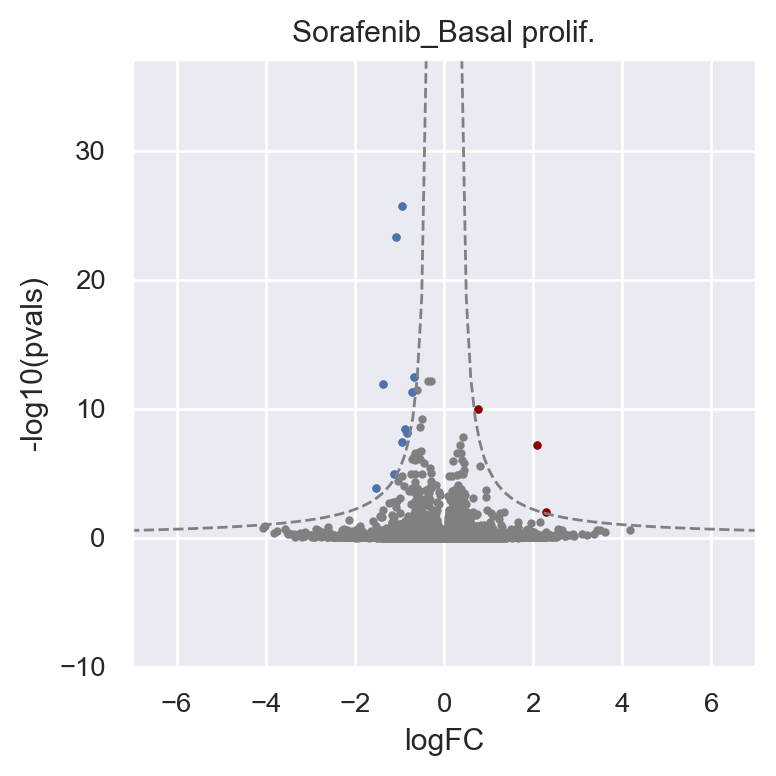

IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


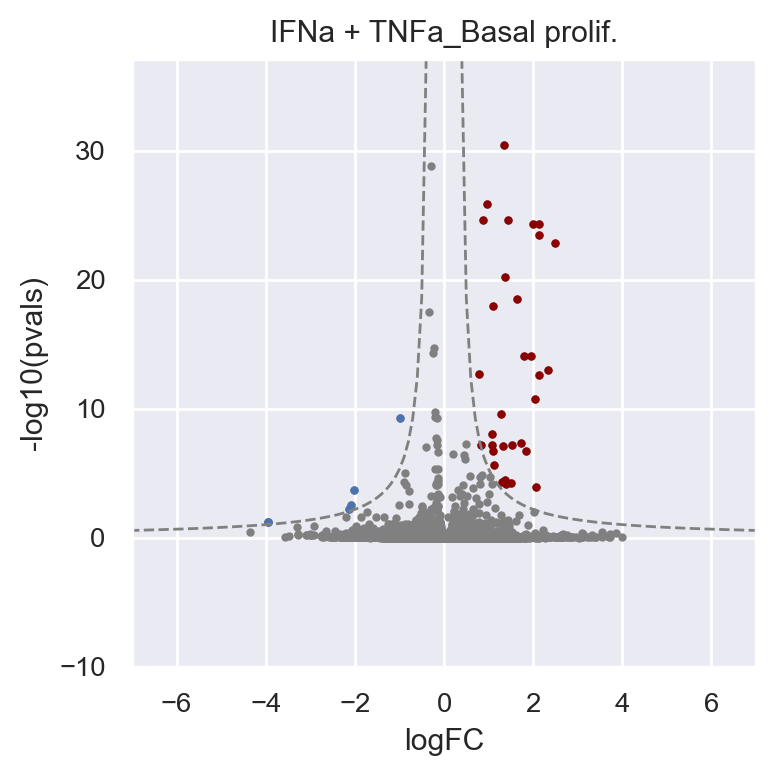

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


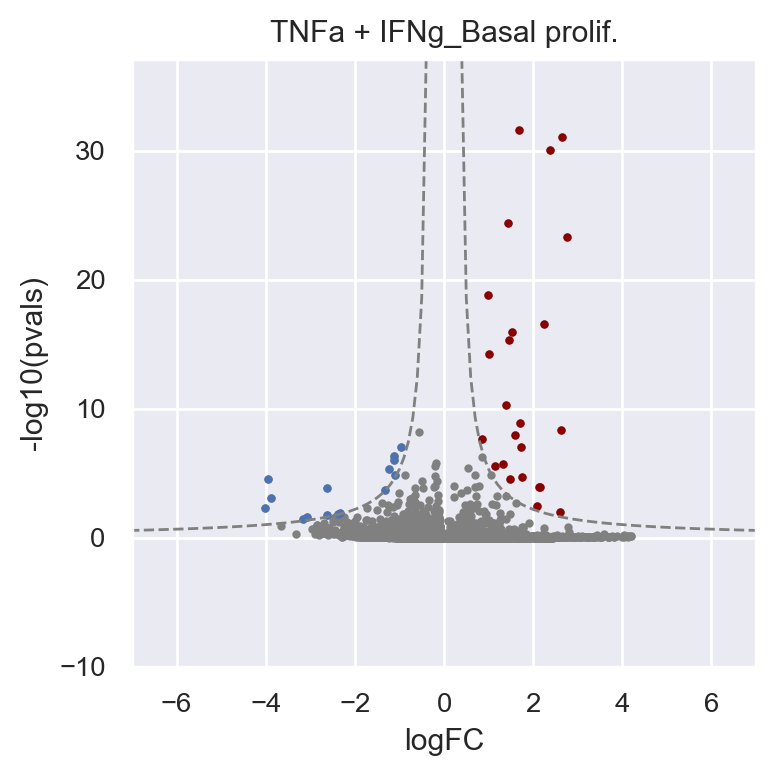

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


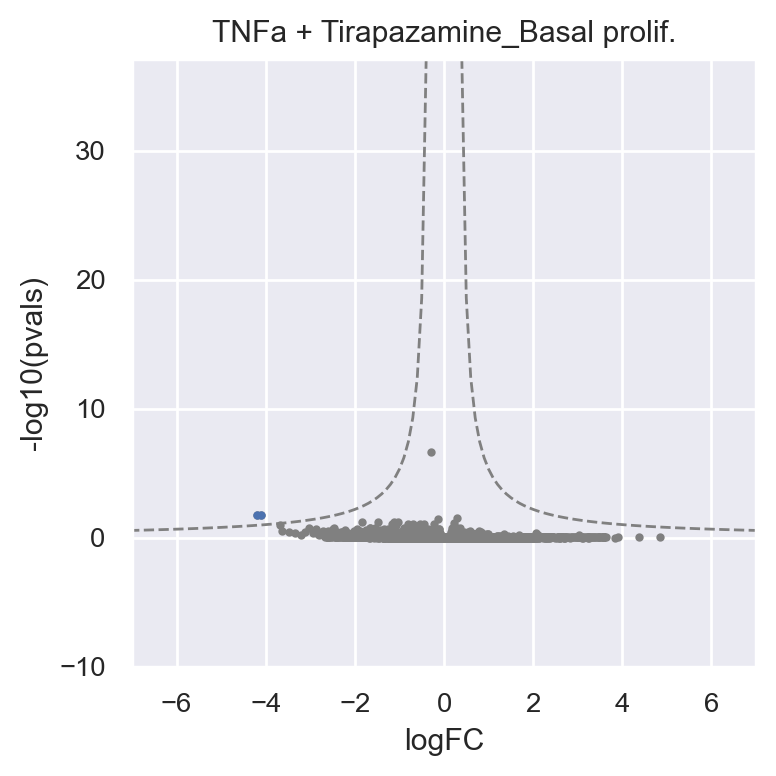

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNL


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


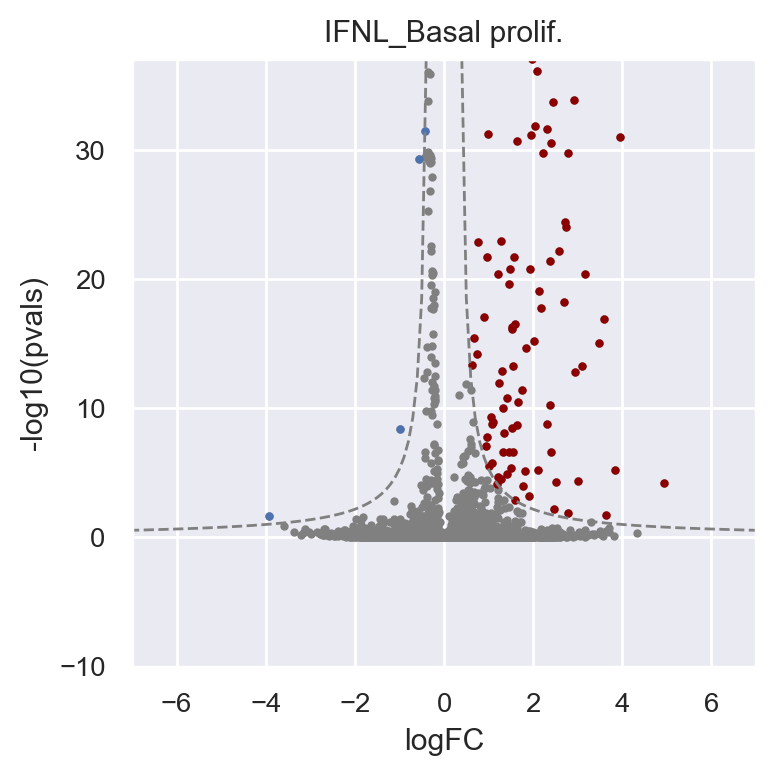

IFNg + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


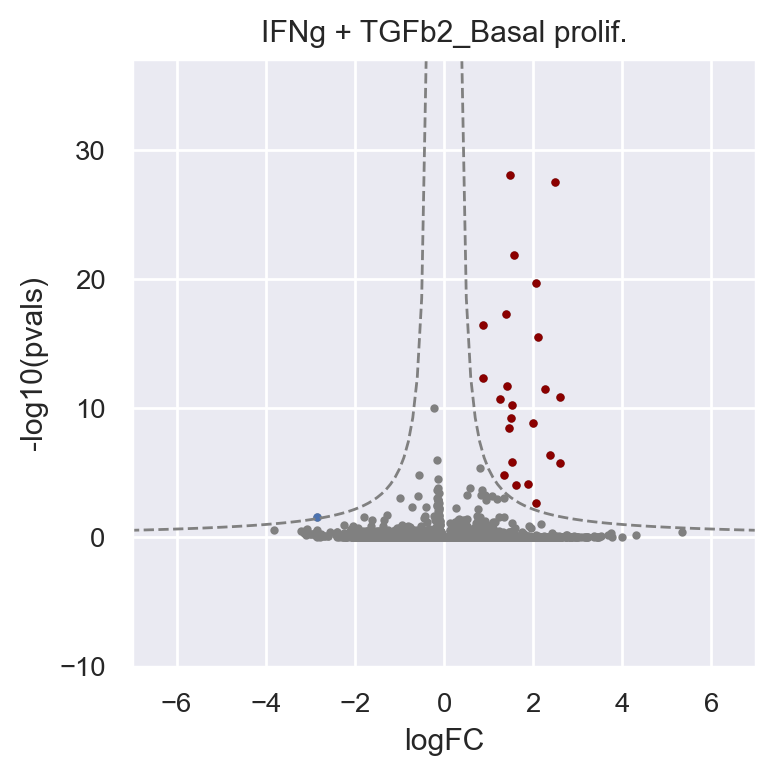

TGFb2 + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


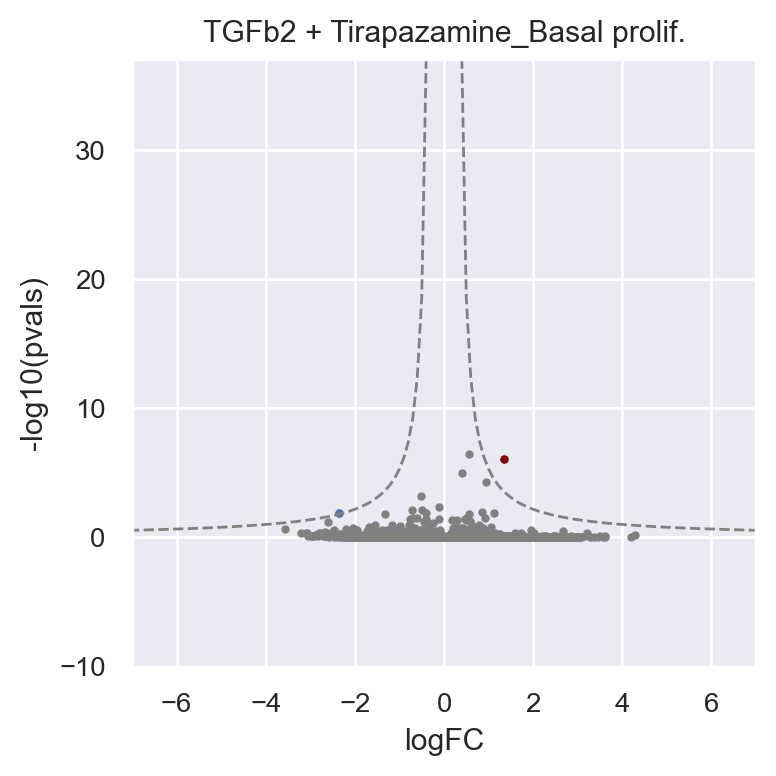

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


DMSO


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


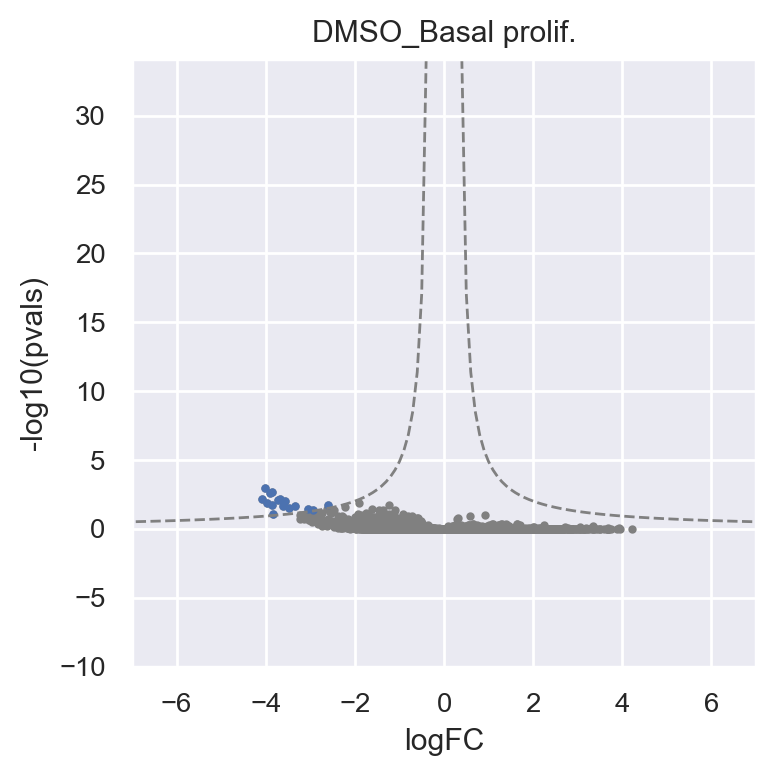

BB94


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


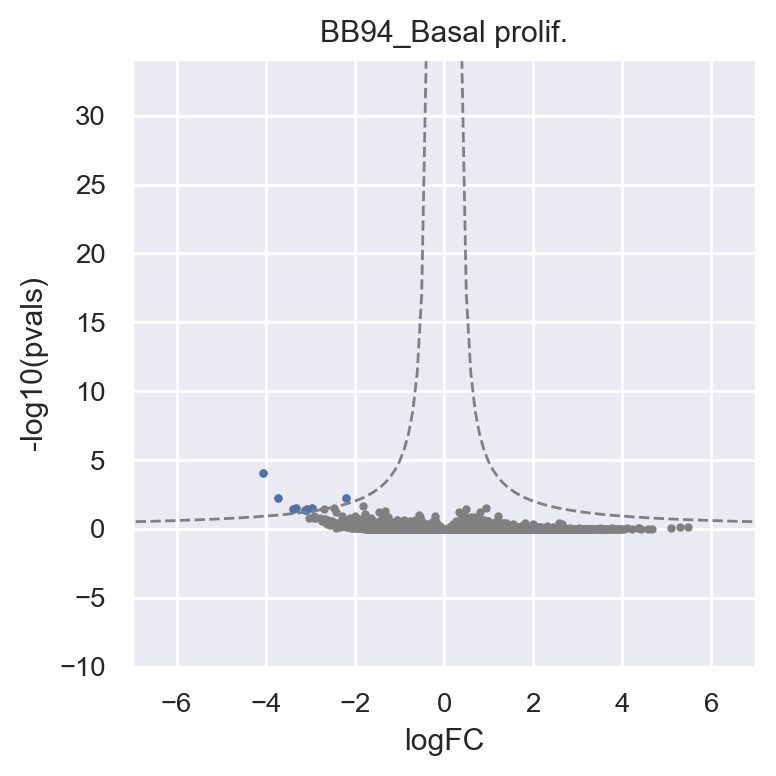

Gilteritinib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


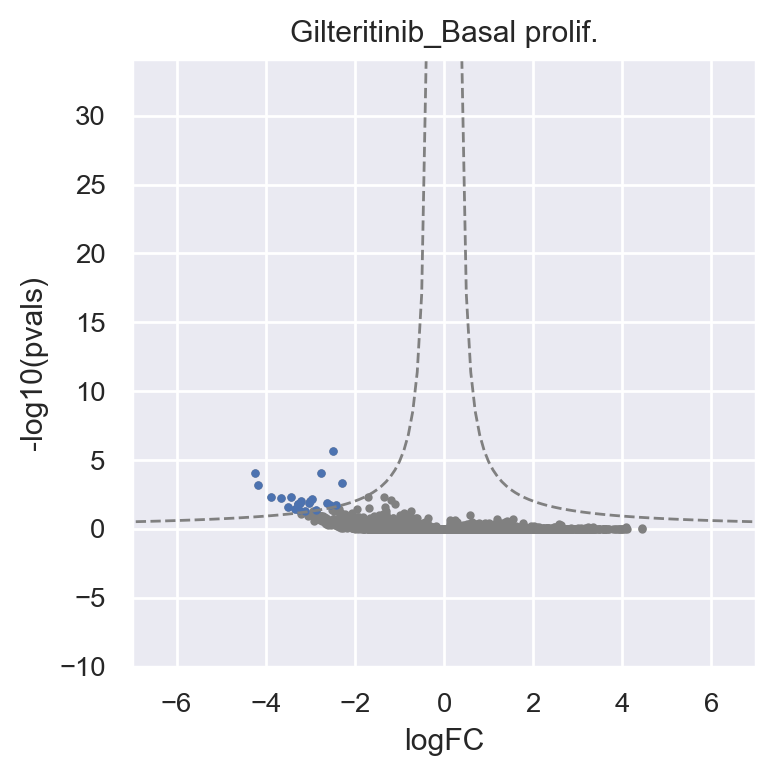

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


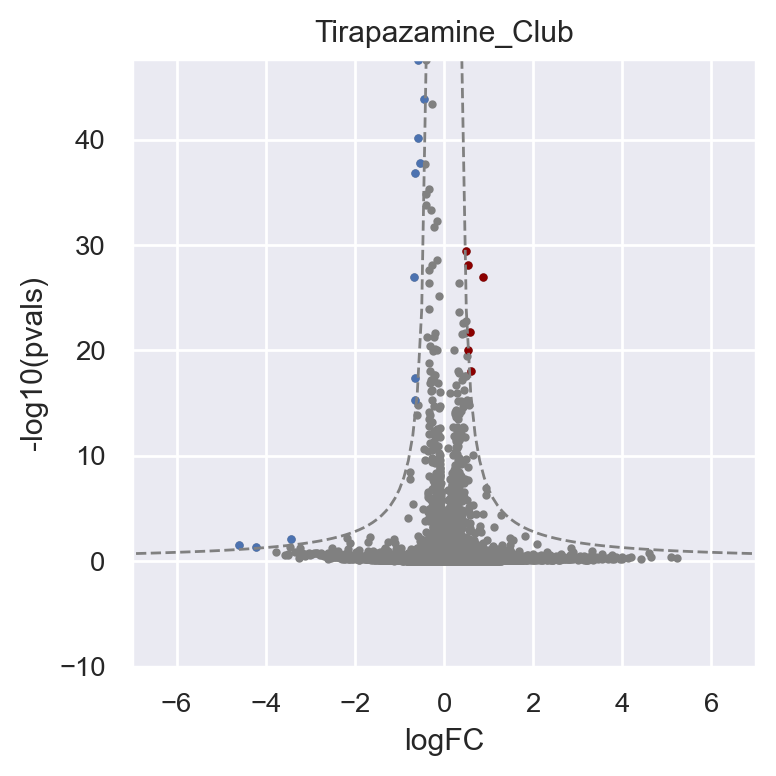

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


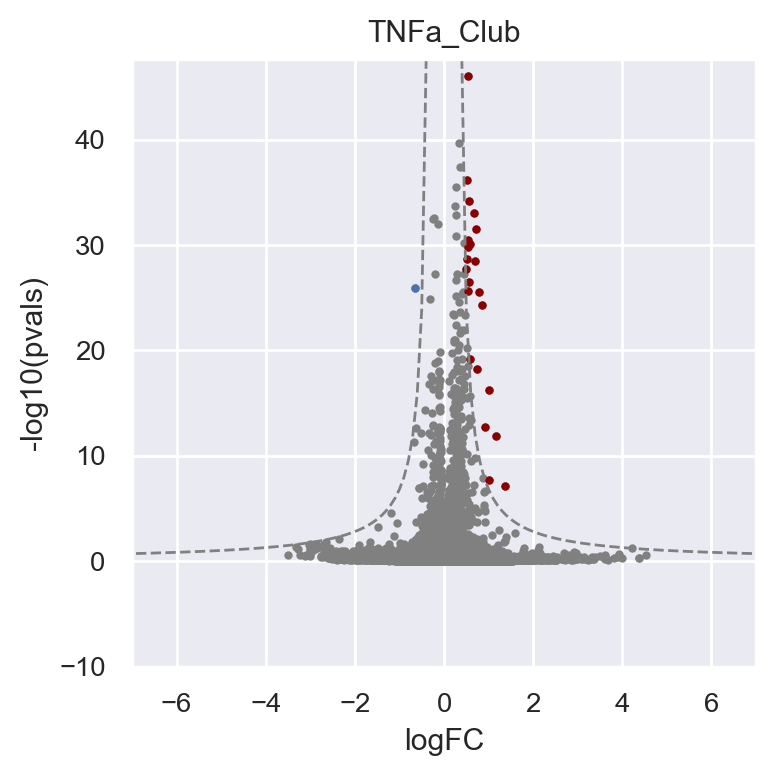

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


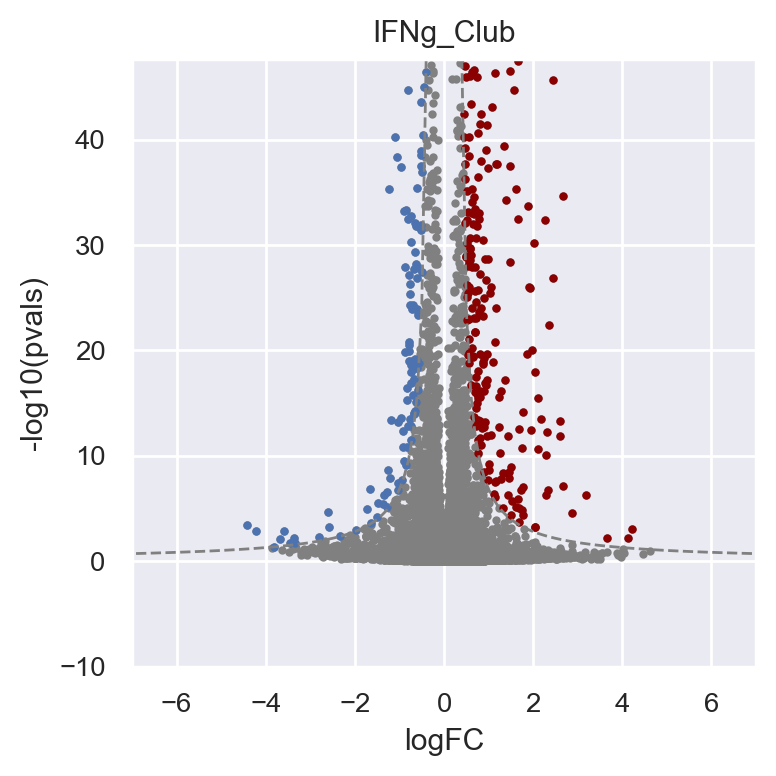

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


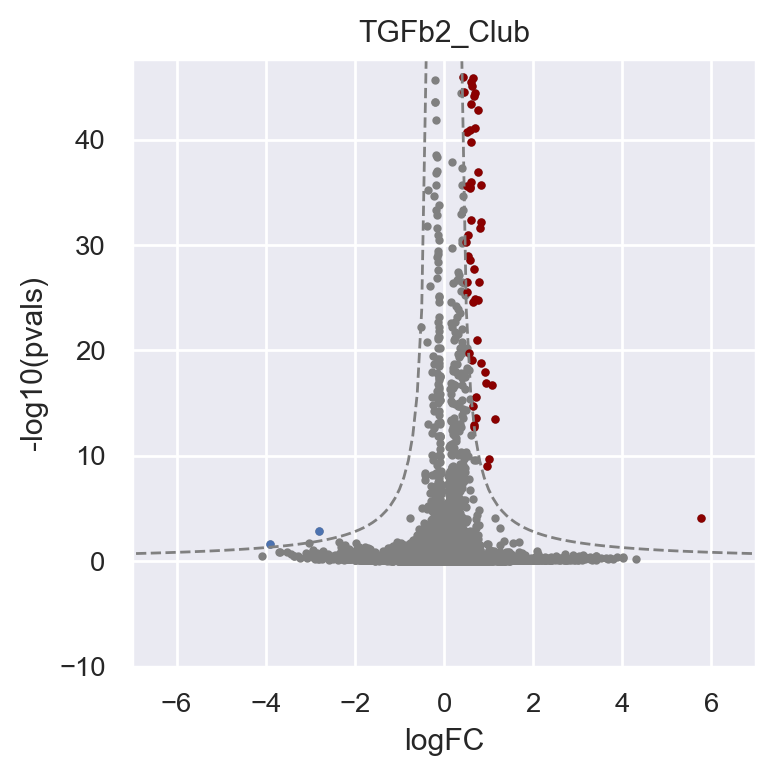

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


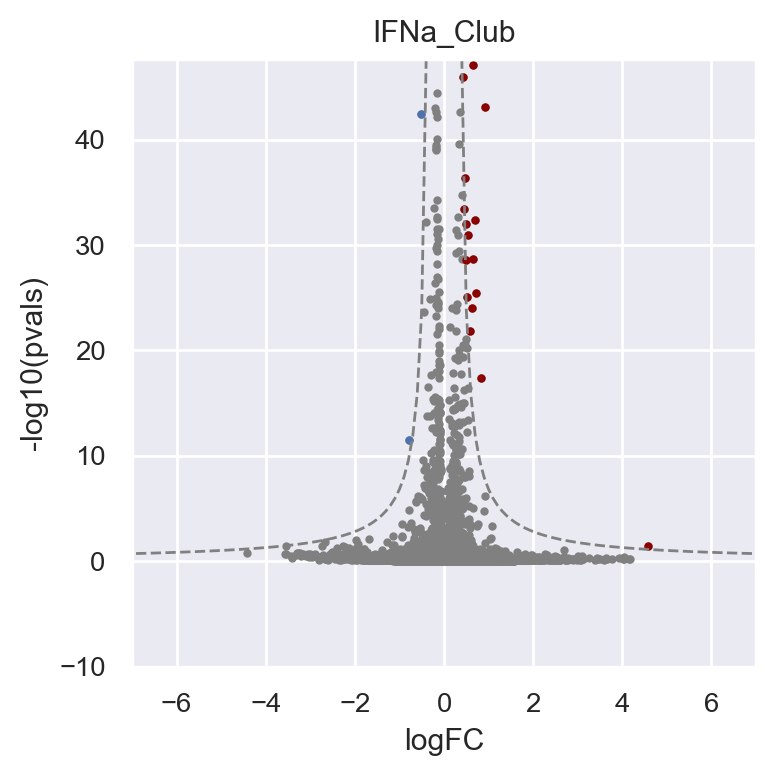

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


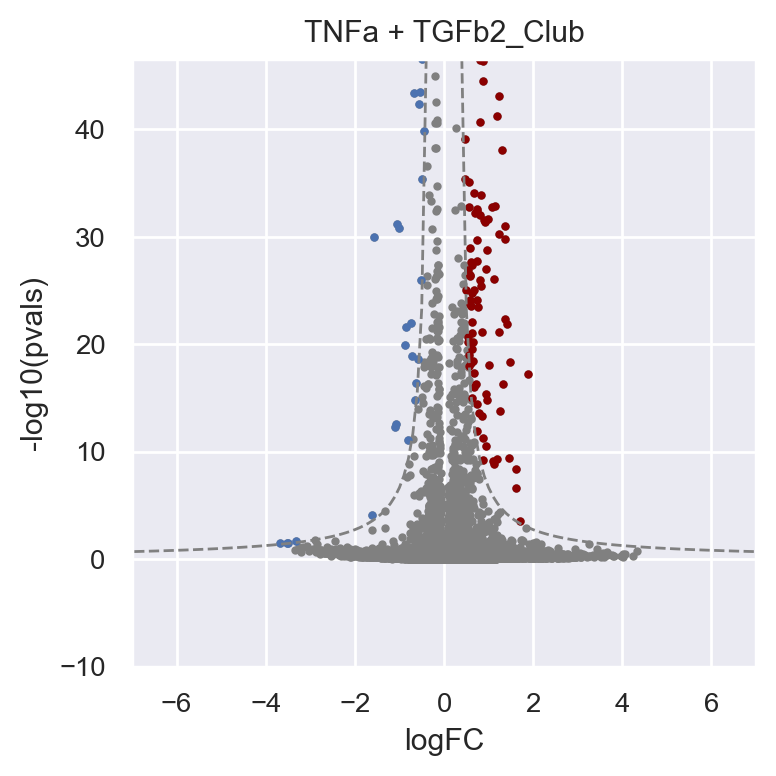

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


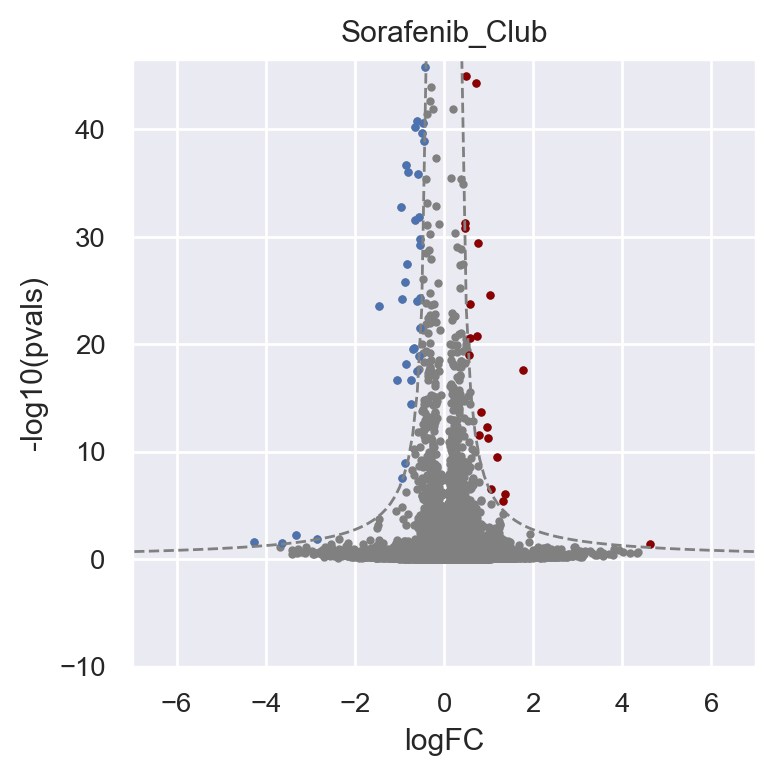

IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


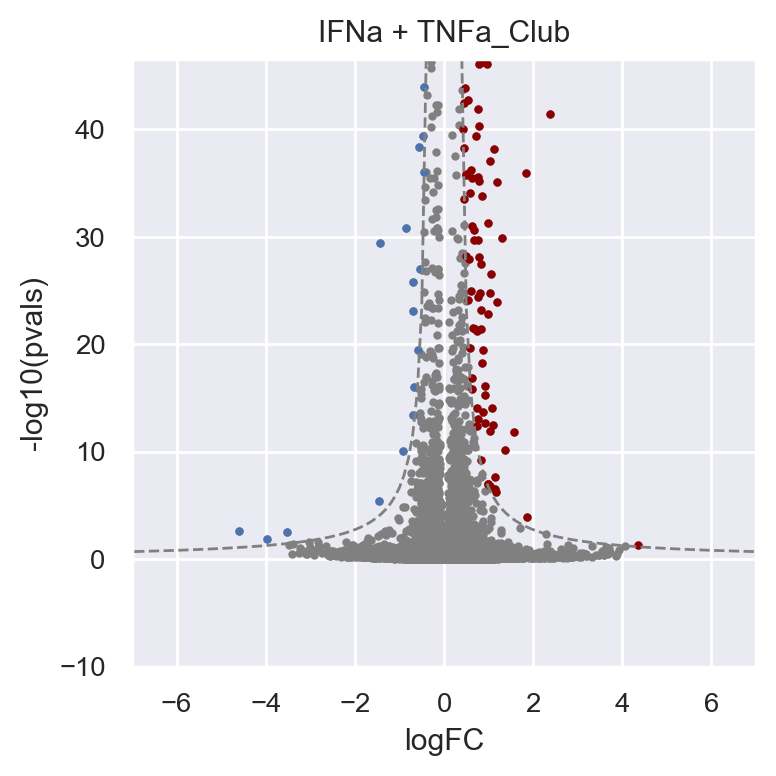

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


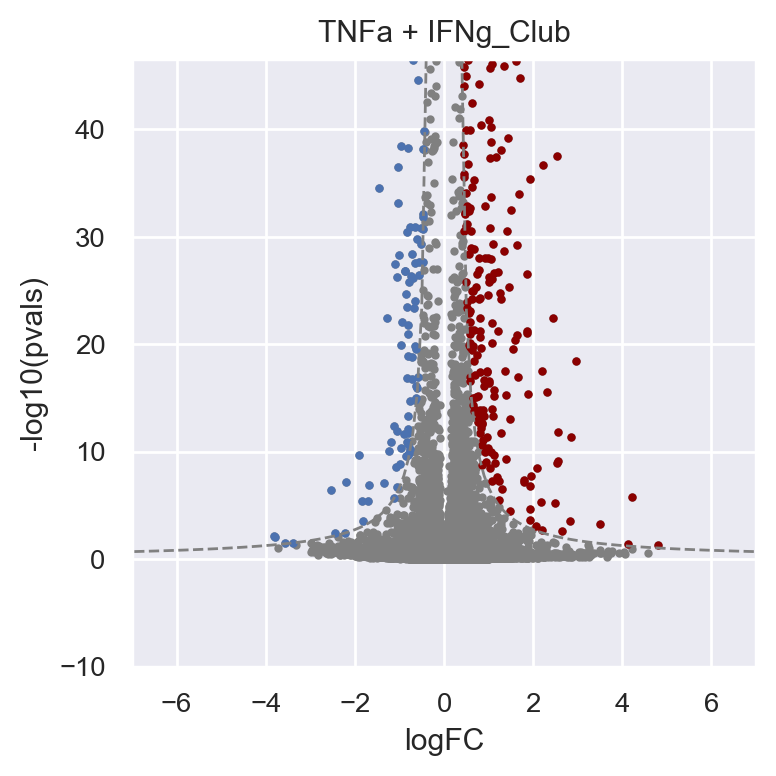

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


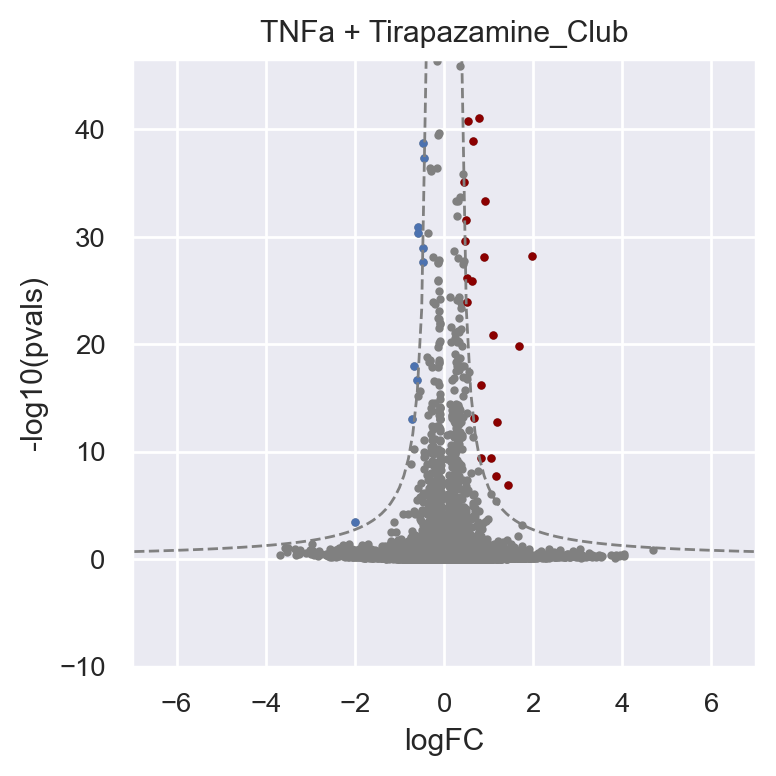

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNL


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


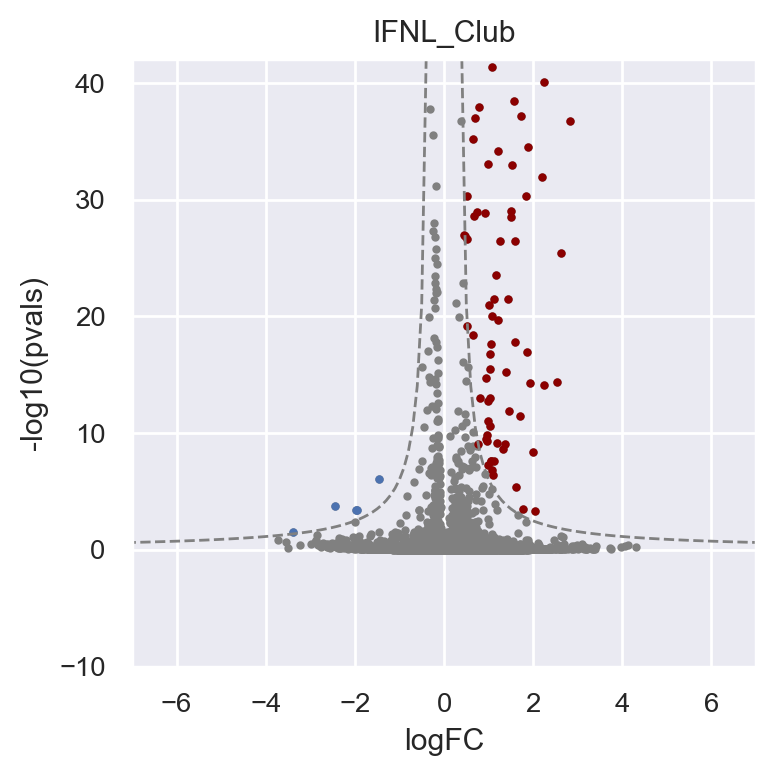

IFNg + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


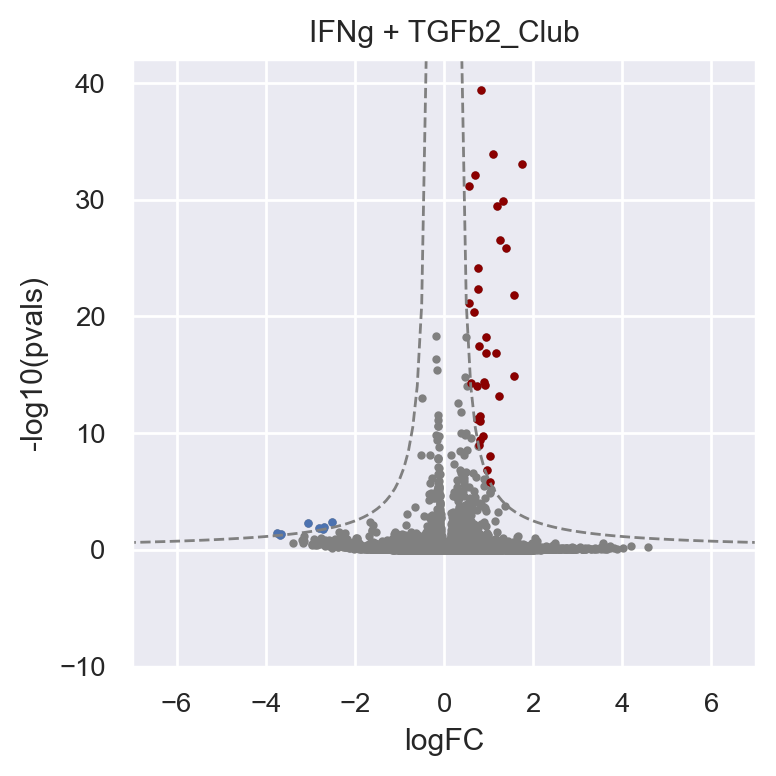

TGFb2 + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


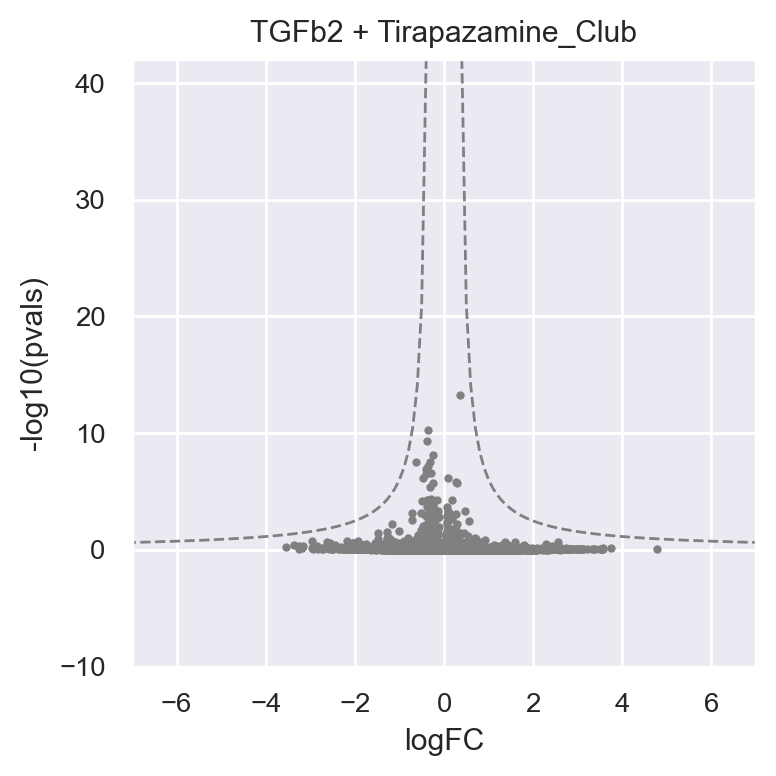

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


DMSO


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


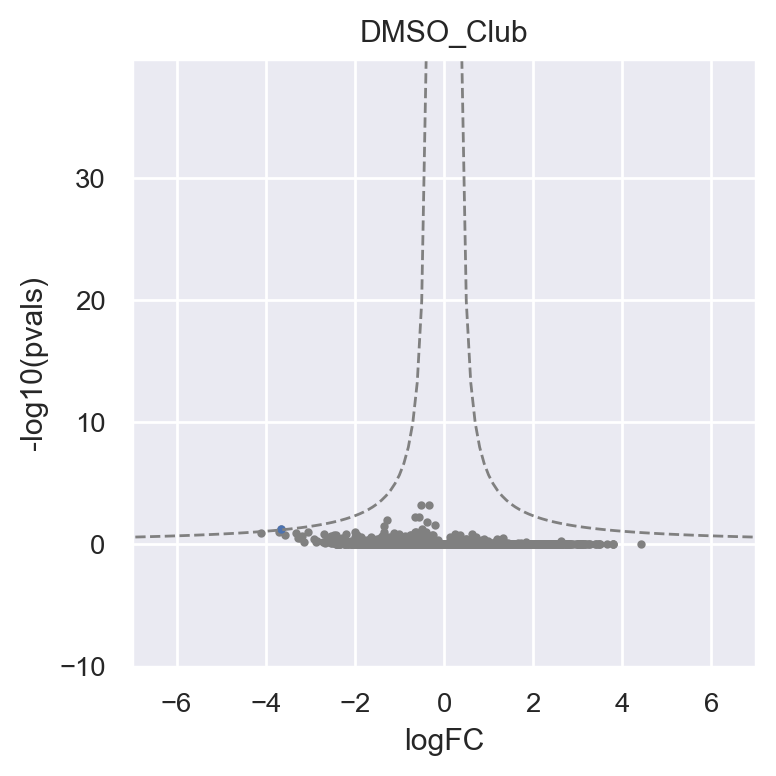

BB94


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


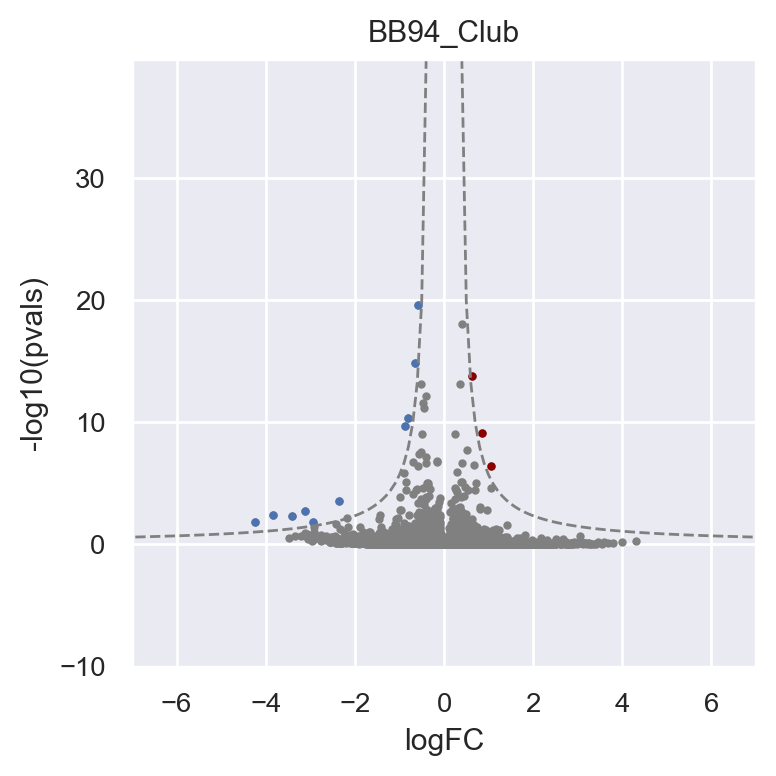

Gilteritinib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


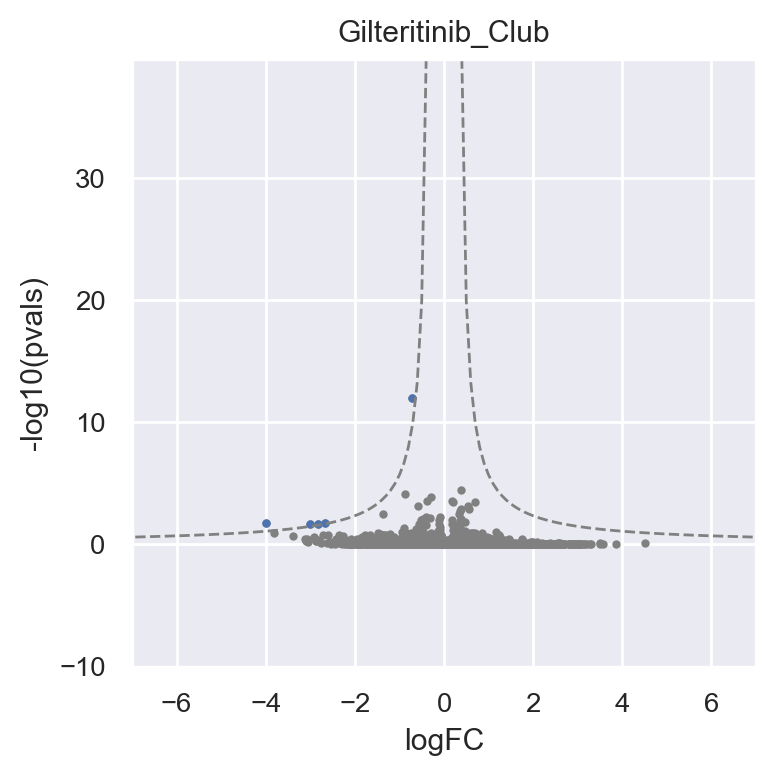

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


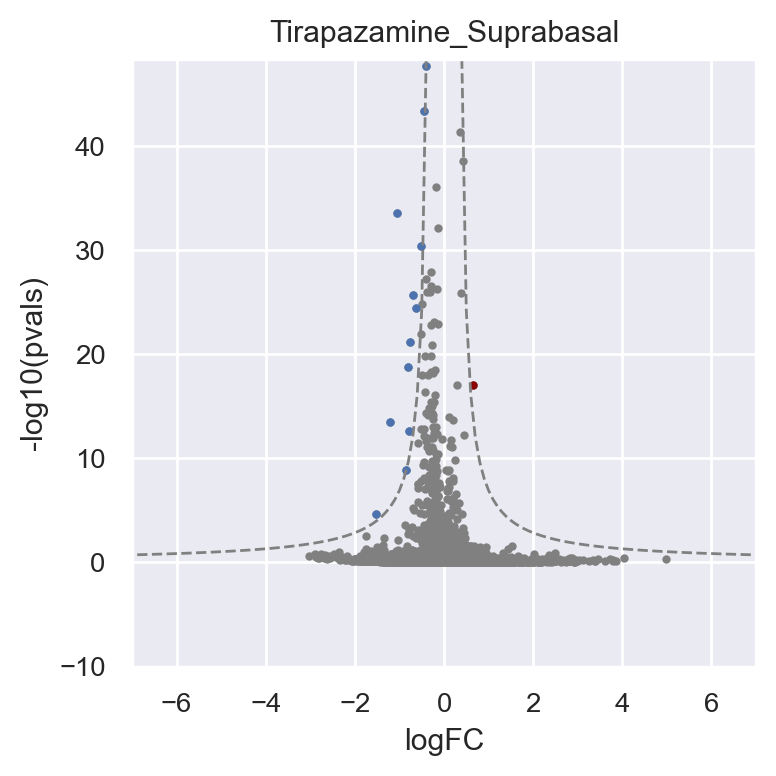

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


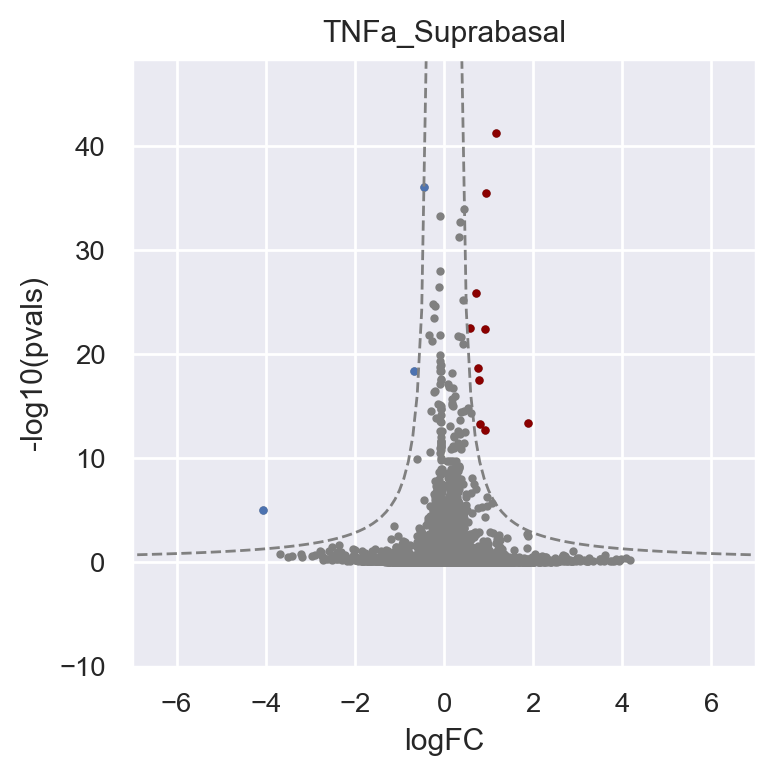

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


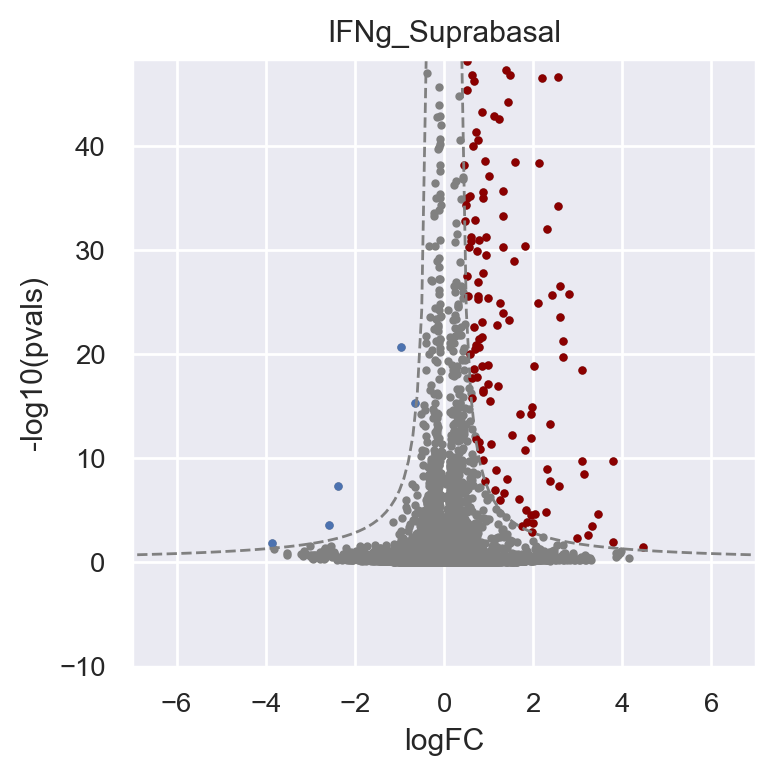

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


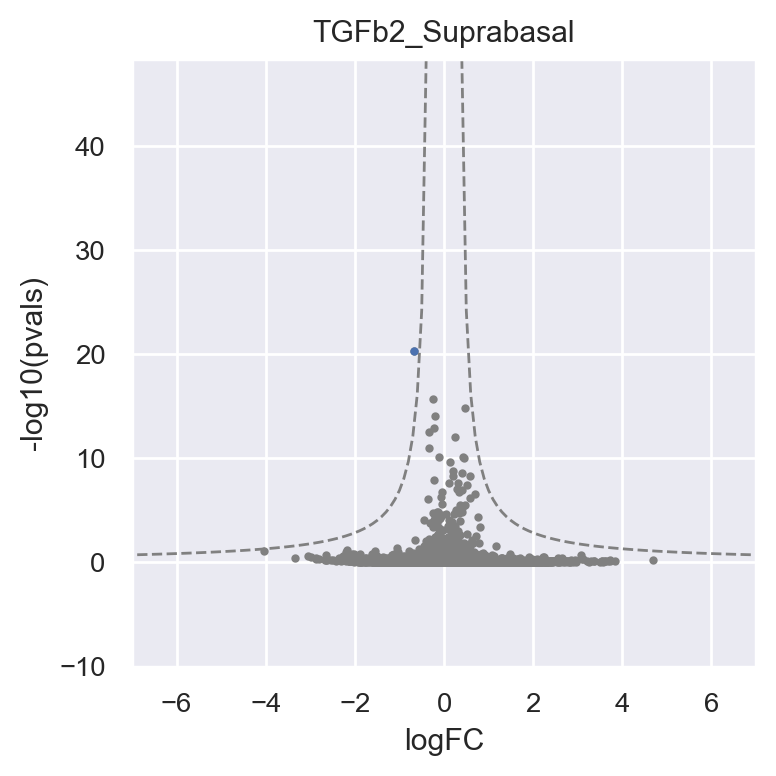

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


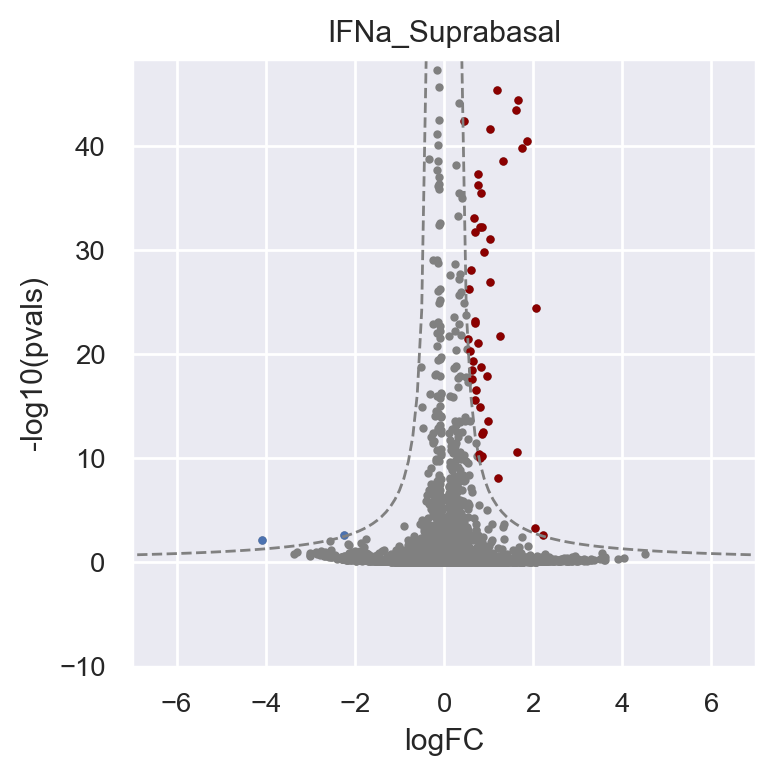

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


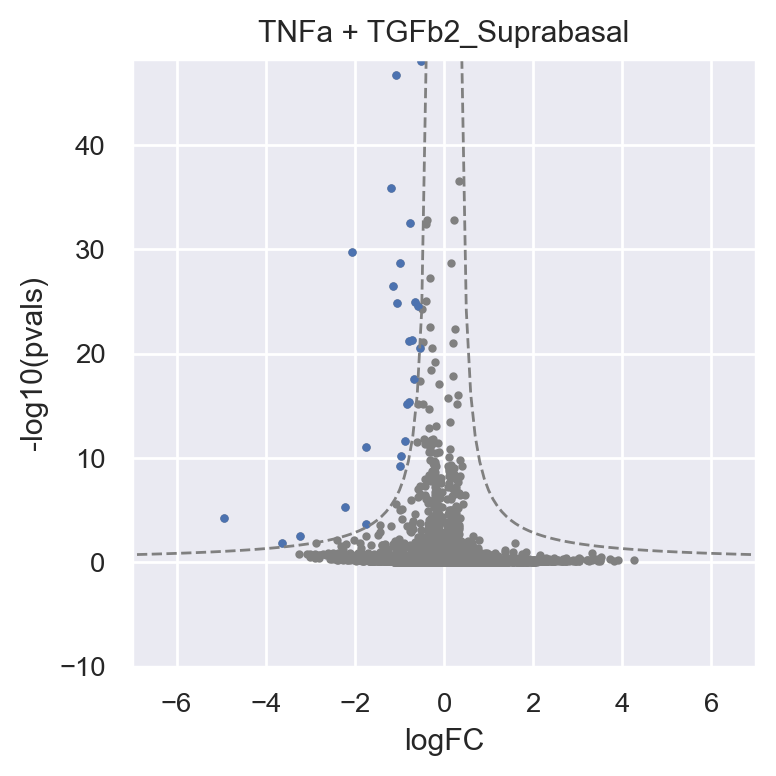

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


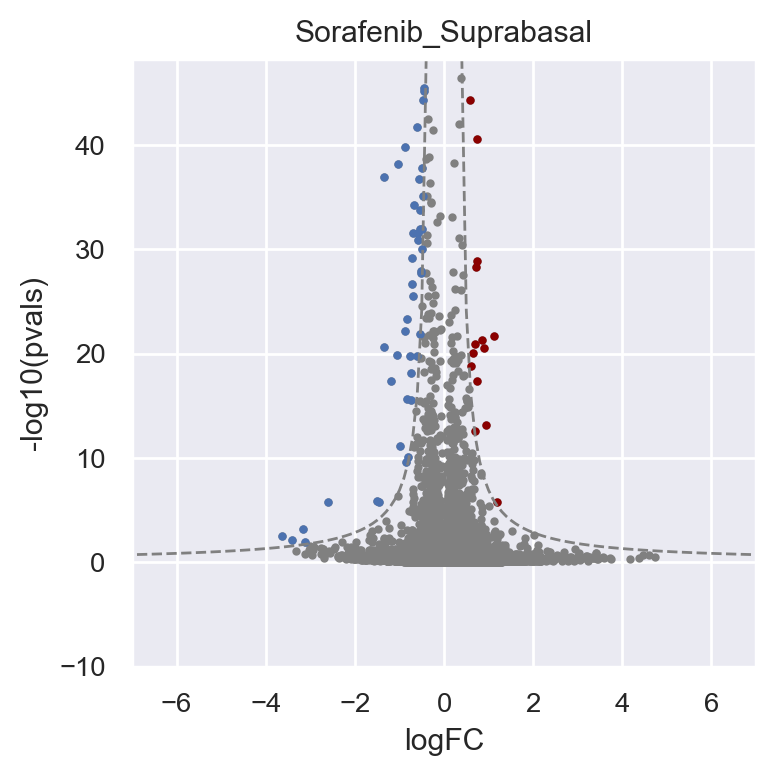

IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


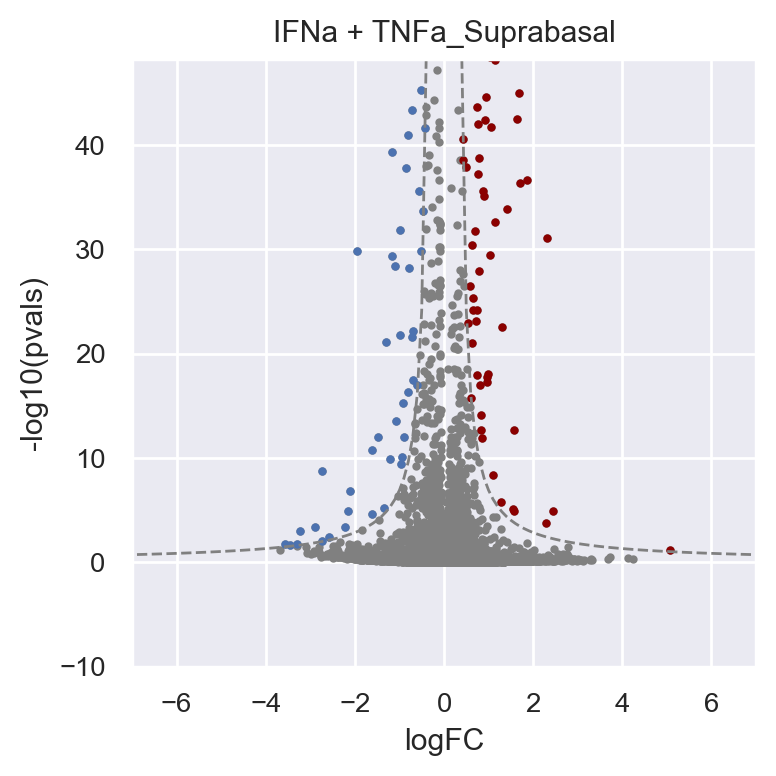

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


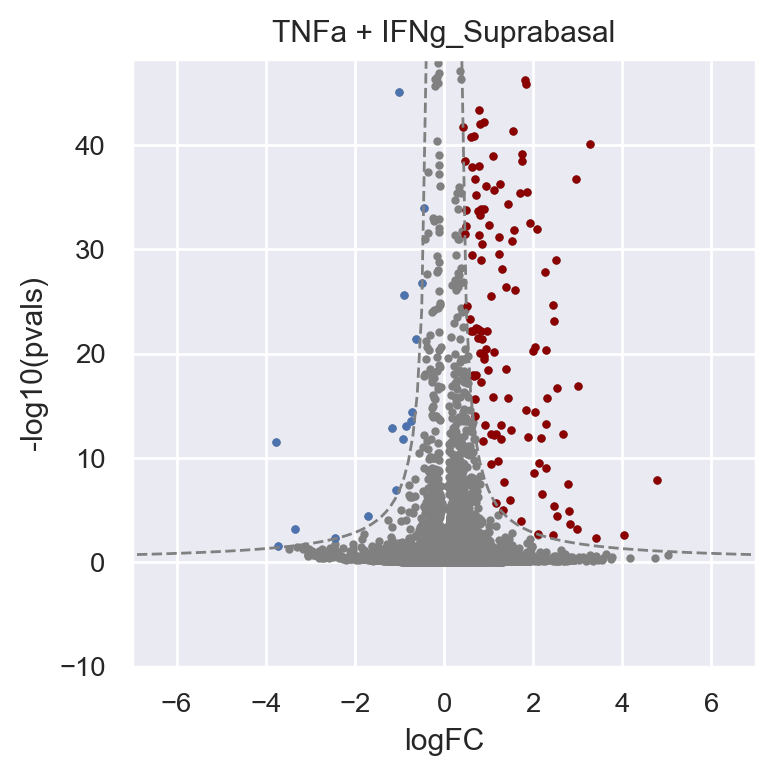

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


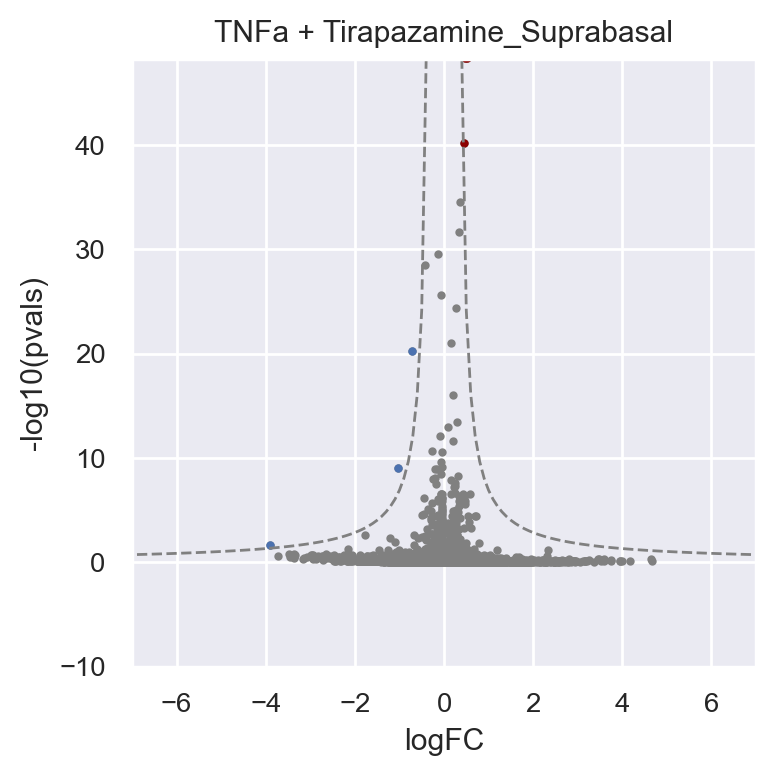

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNL


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


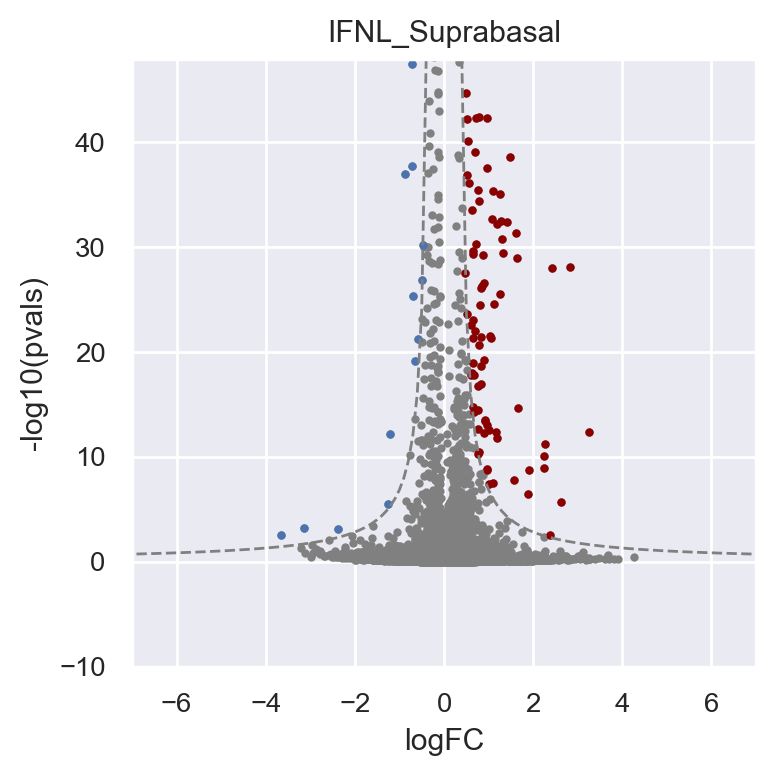

IFNg + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: RuntimeWarning: divide by zero encountered in log10
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


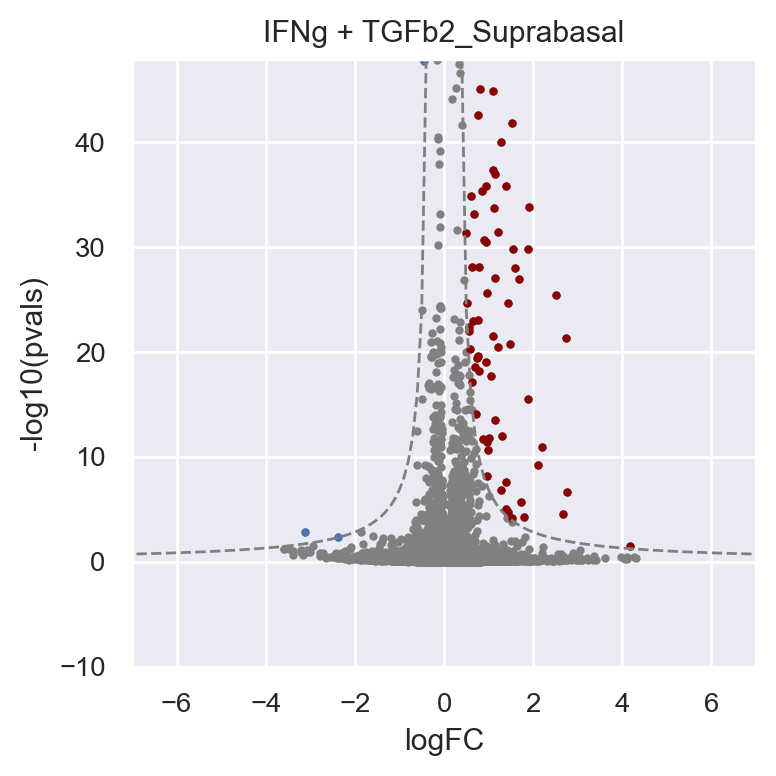

TGFb2 + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


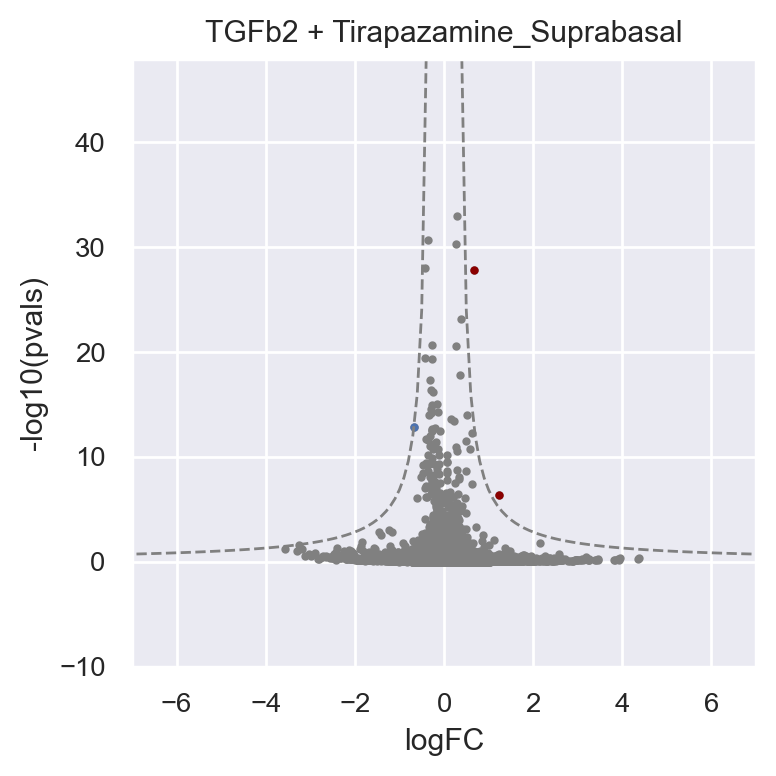

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


DMSO


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


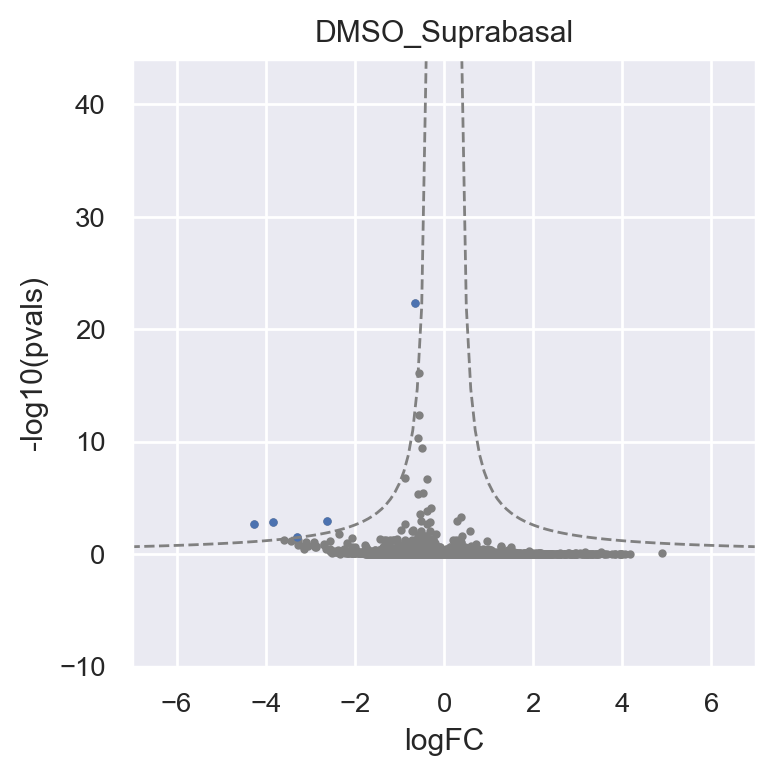

BB94


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


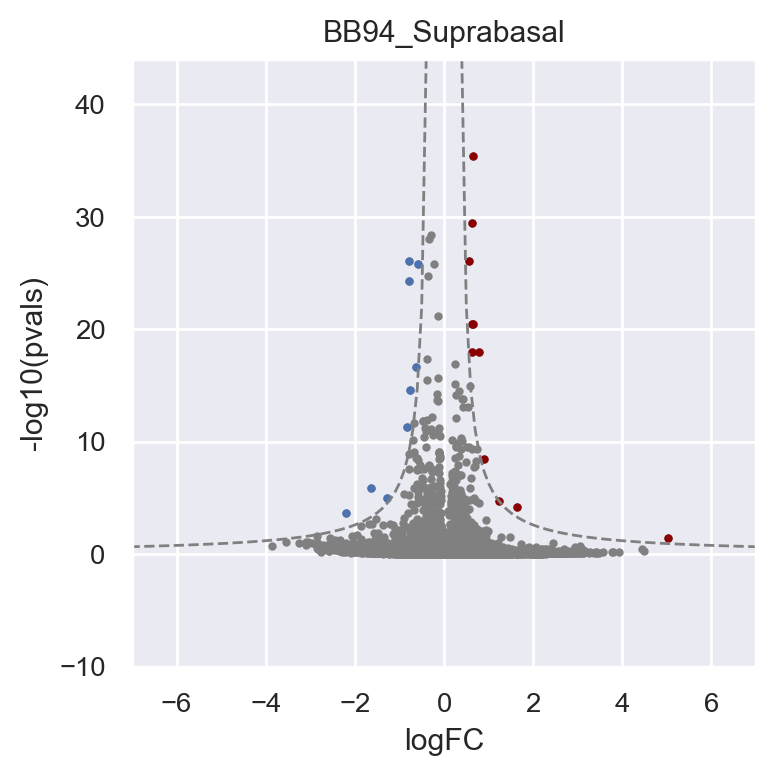

Gilteritinib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


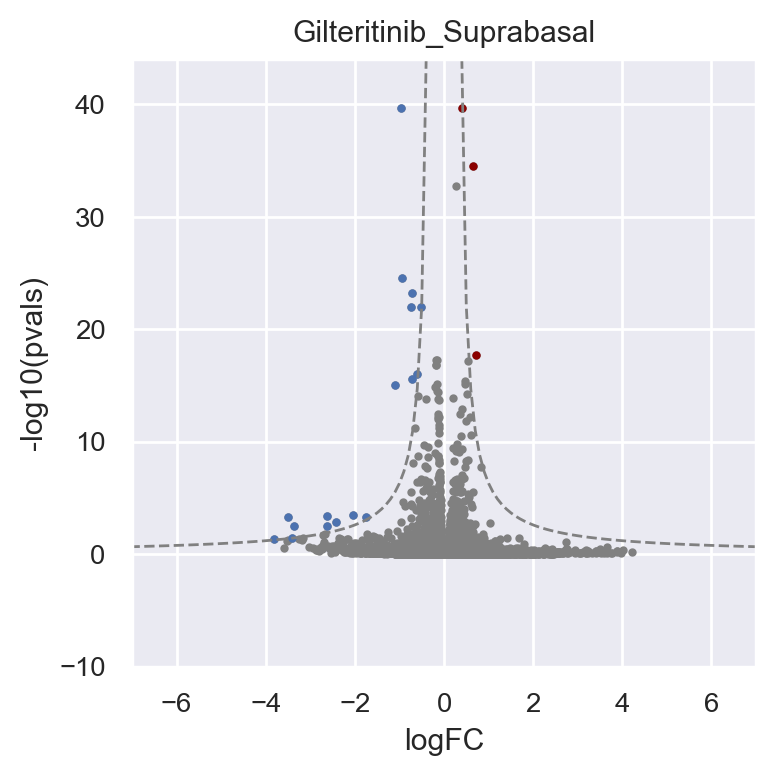

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


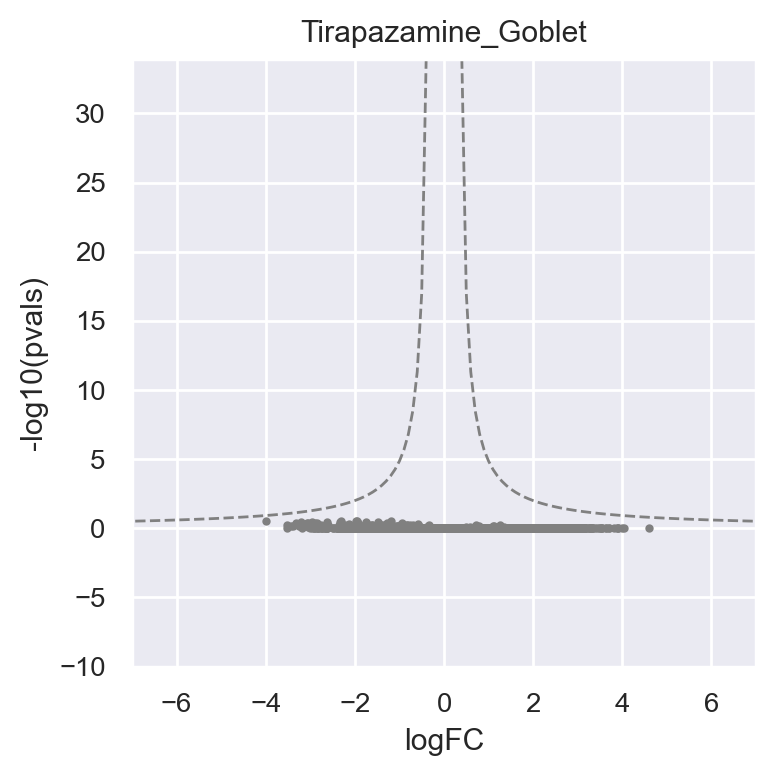

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


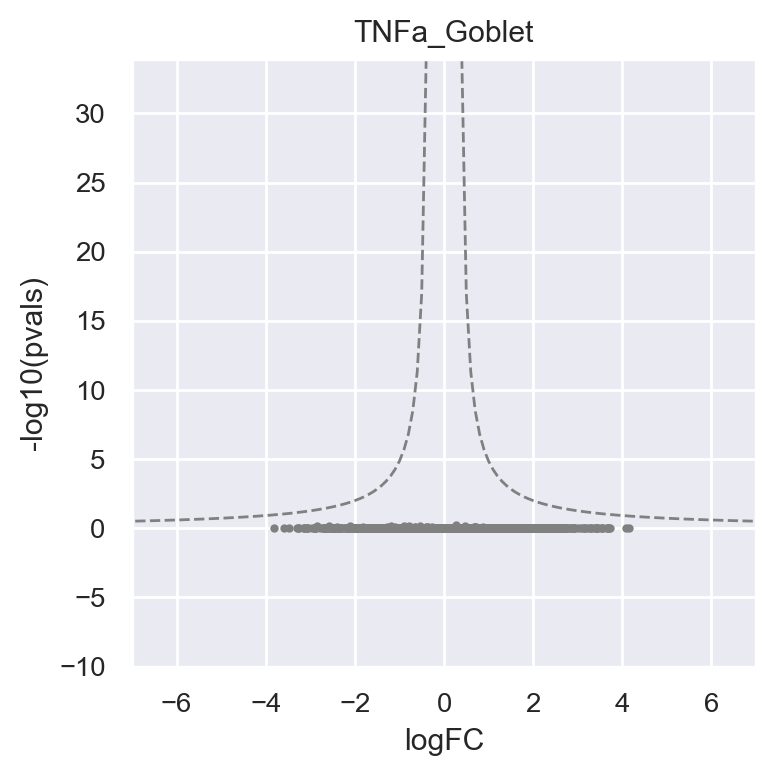

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


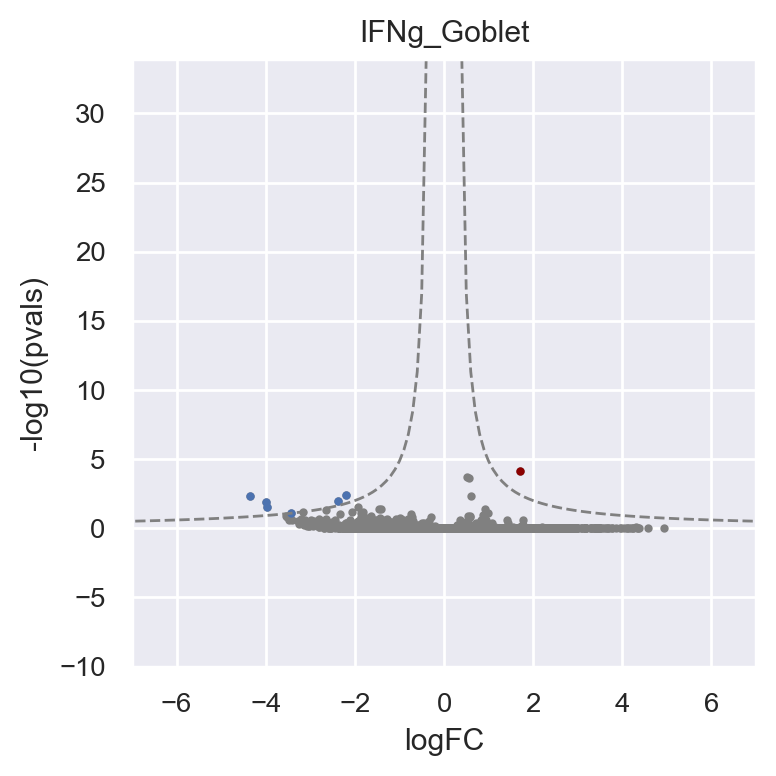

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


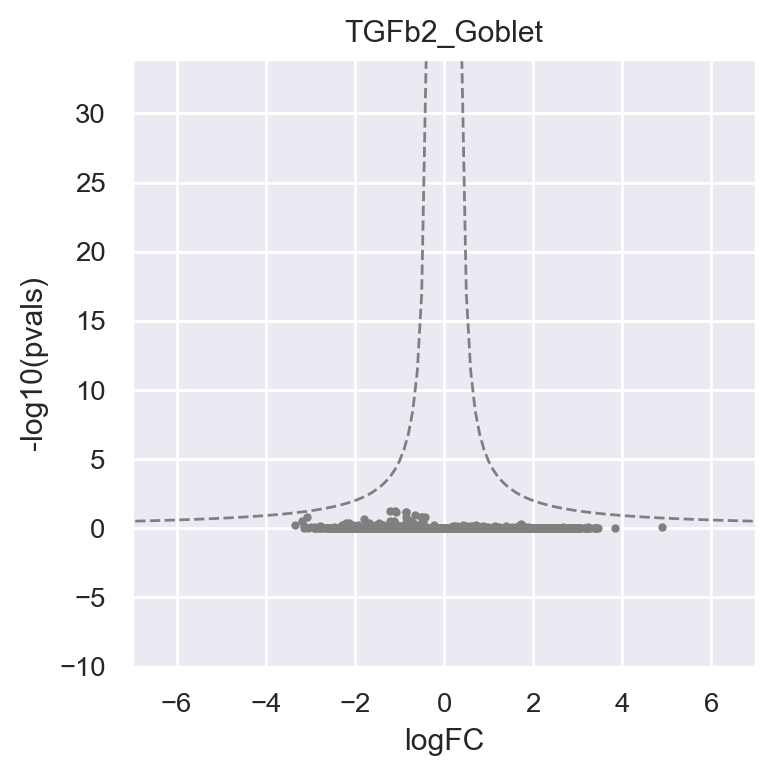

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


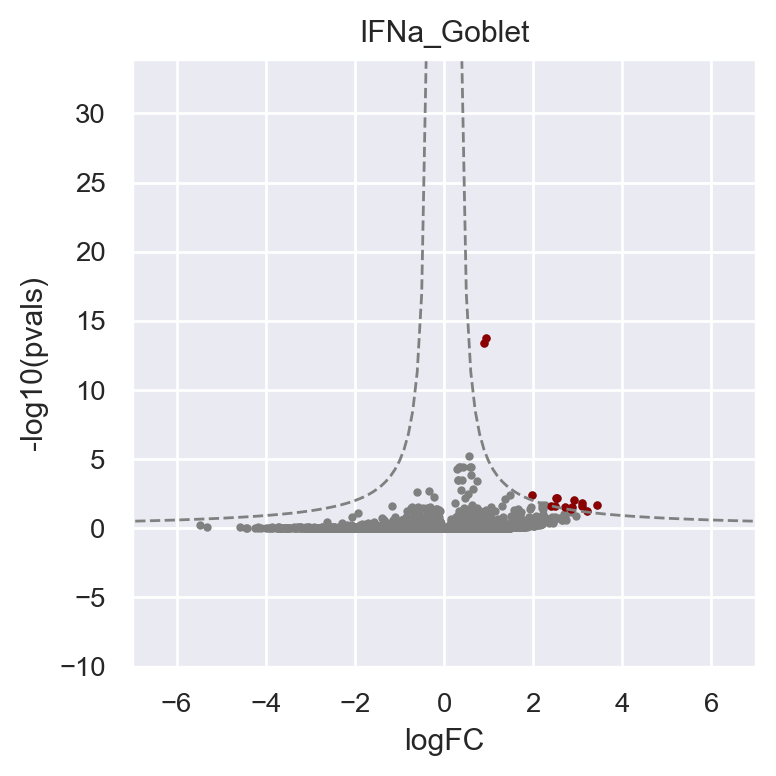

IFNa + TNFa


/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


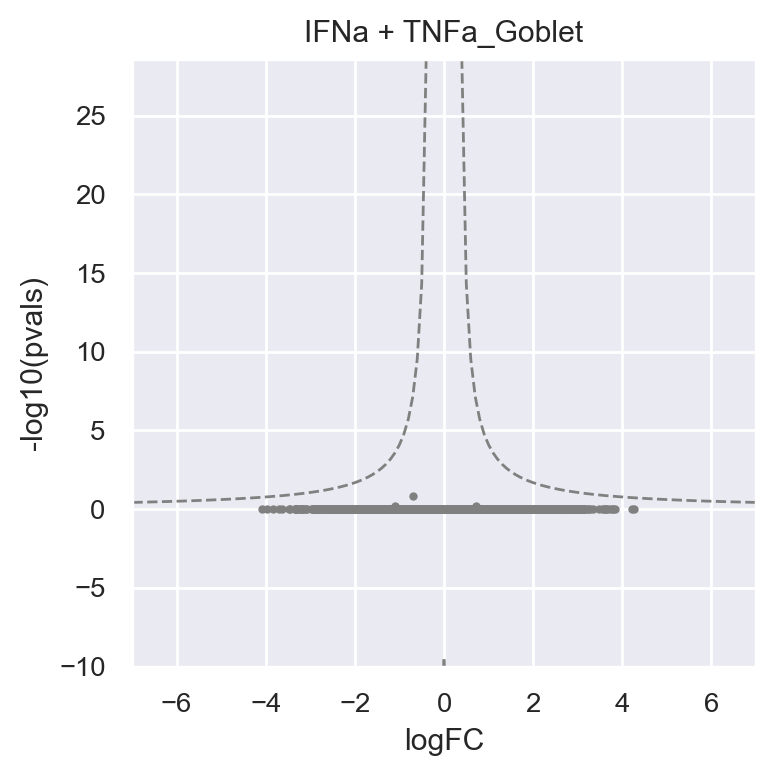

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


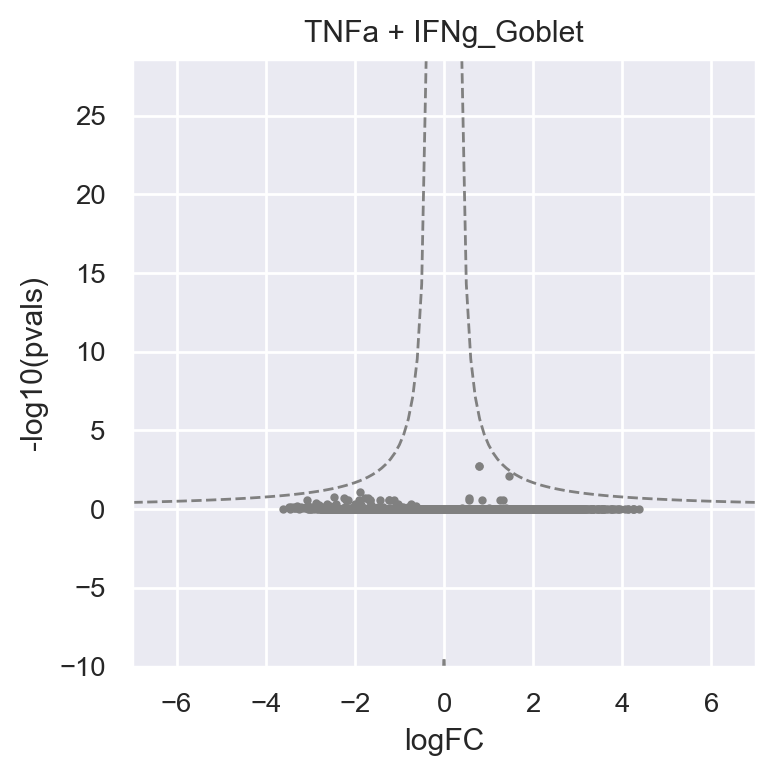

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


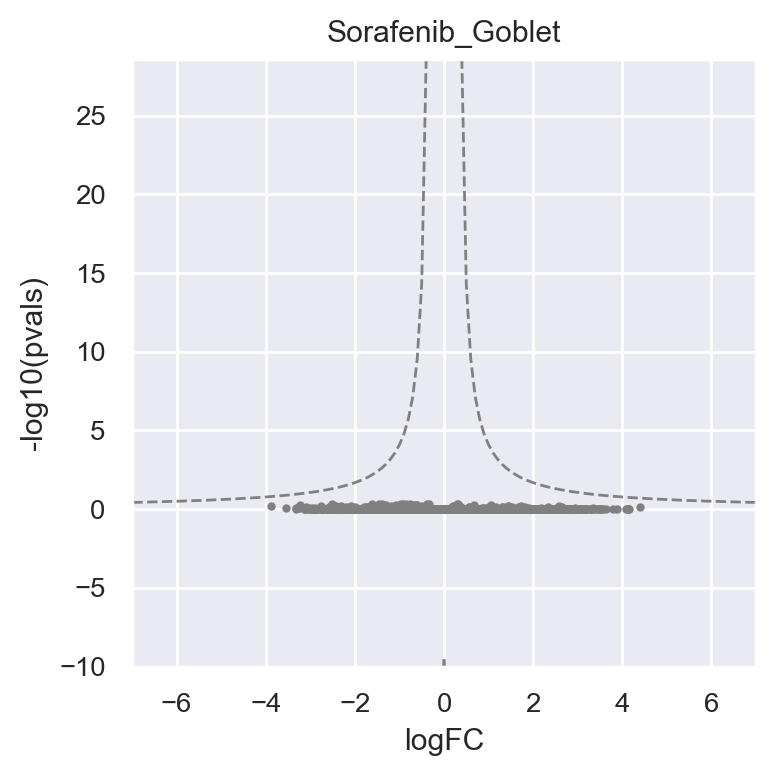

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


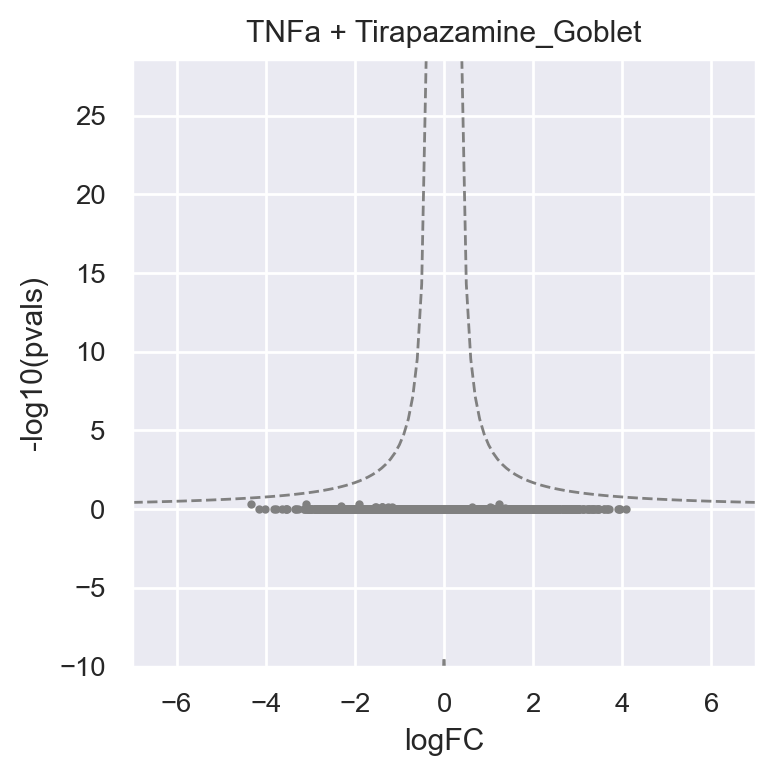

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


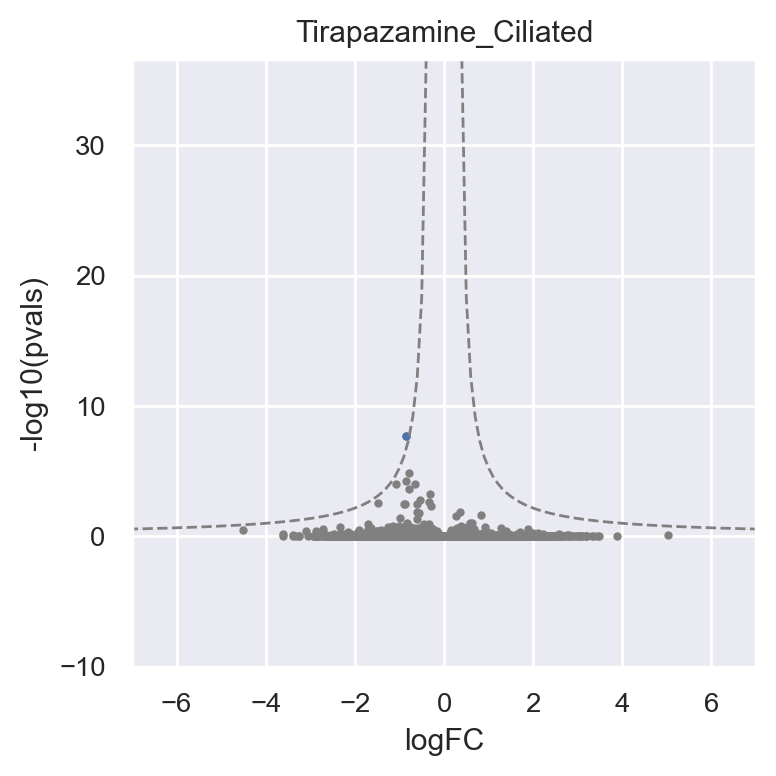

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


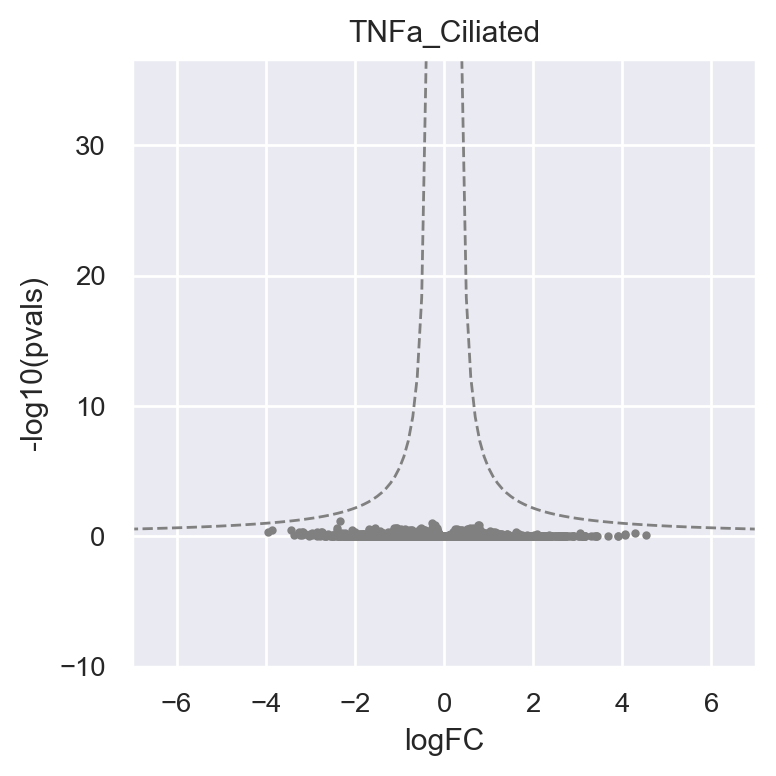

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


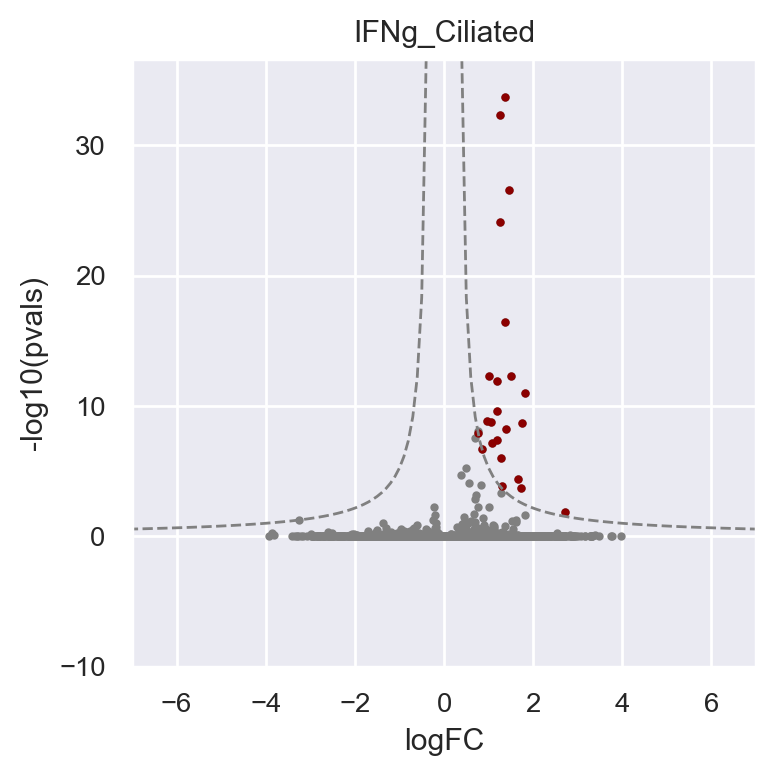

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


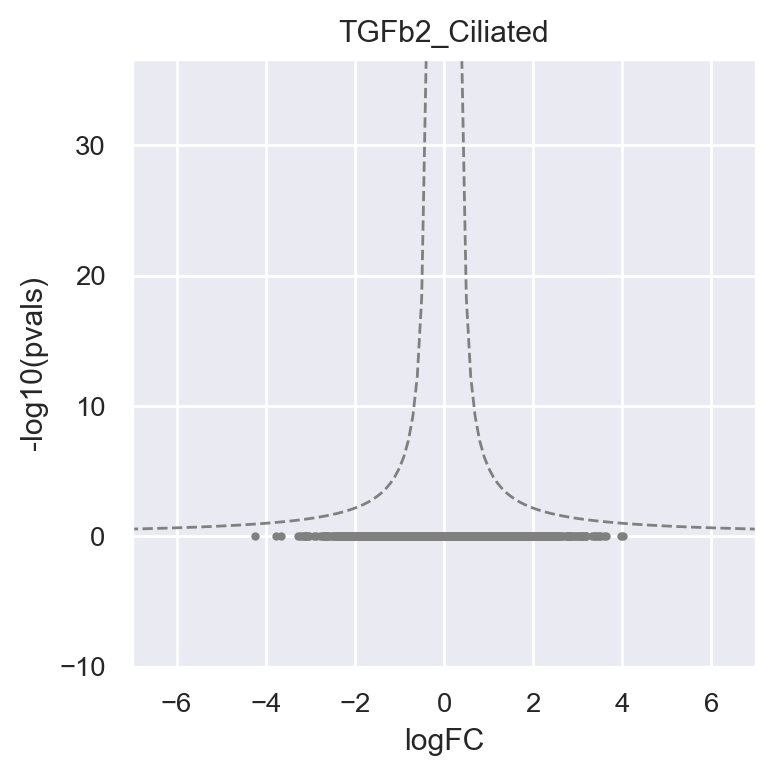

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


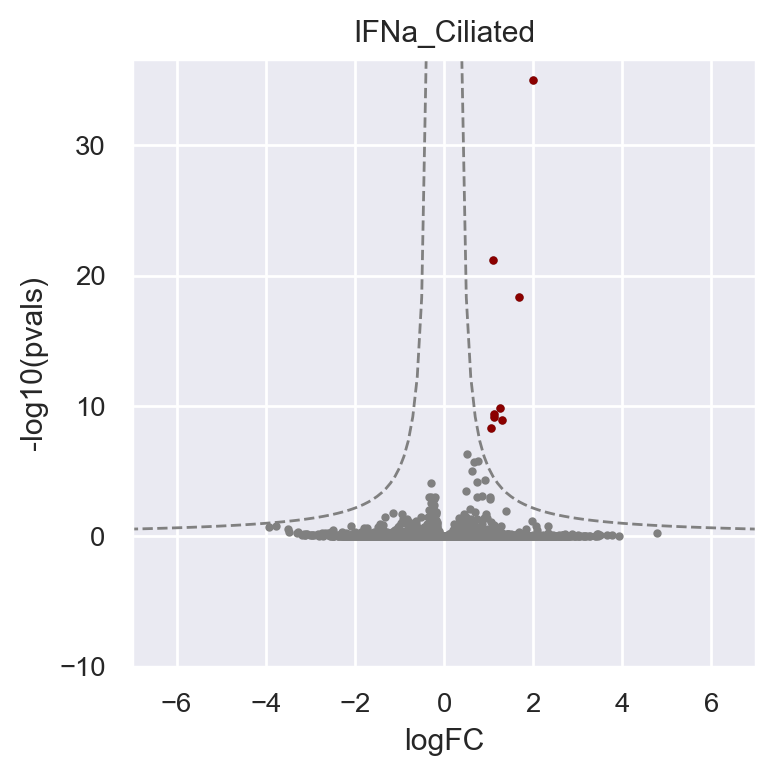

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


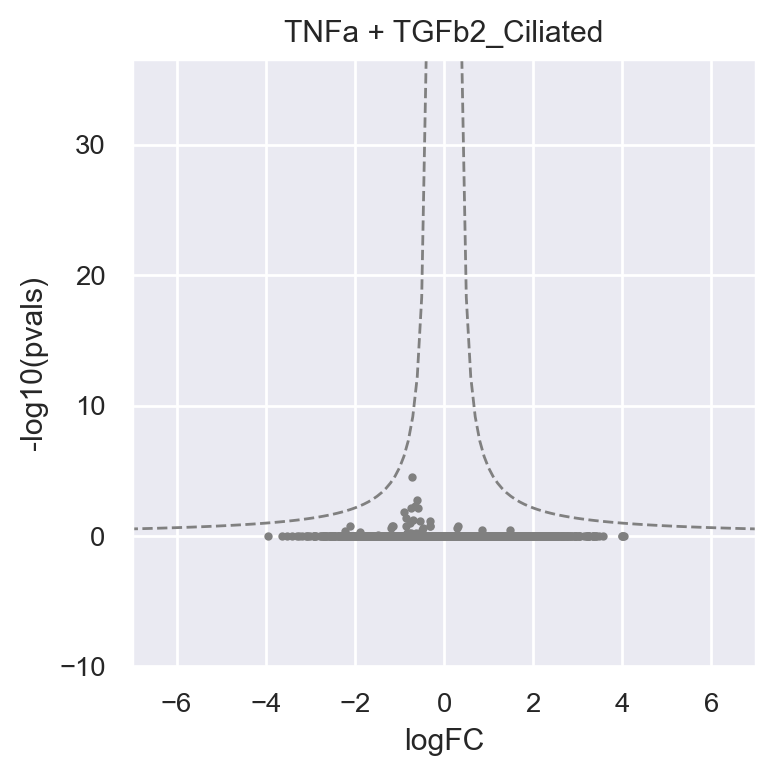

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


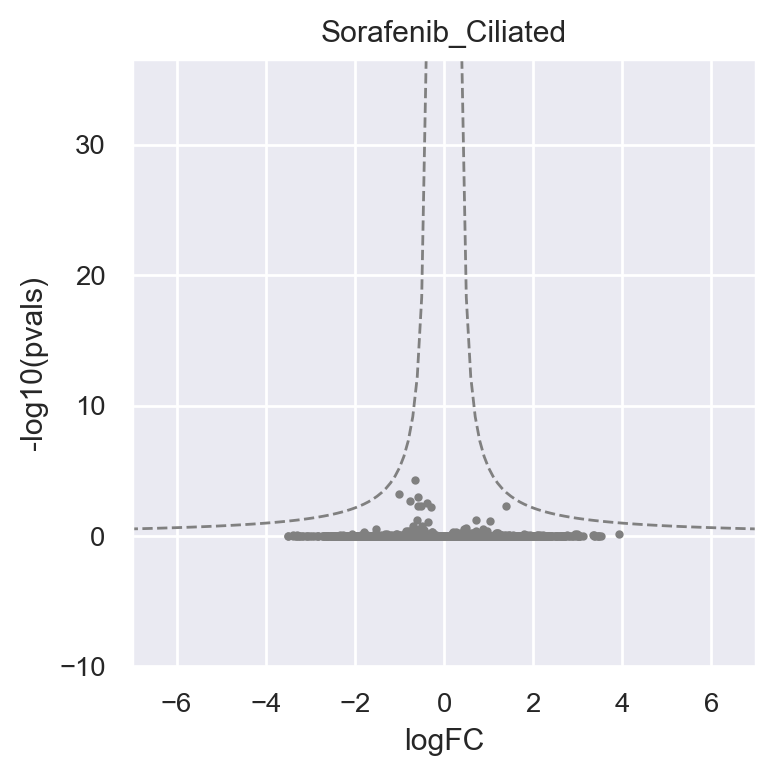

IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


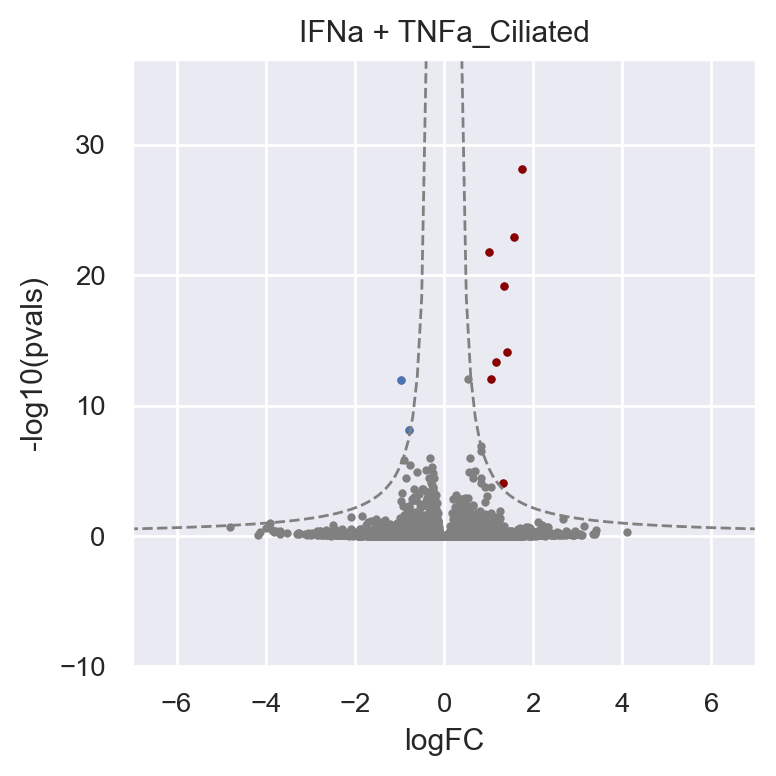

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


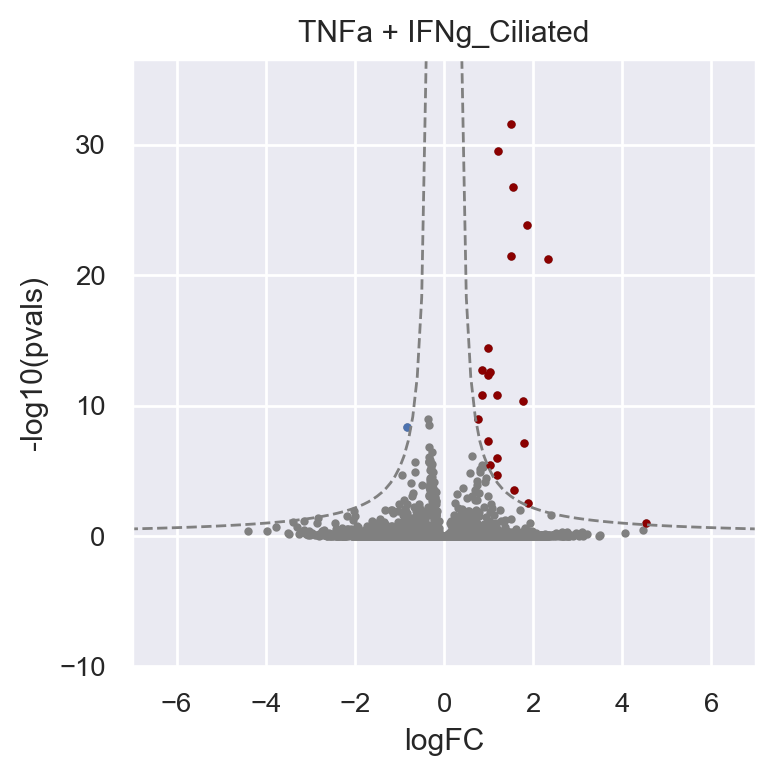

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


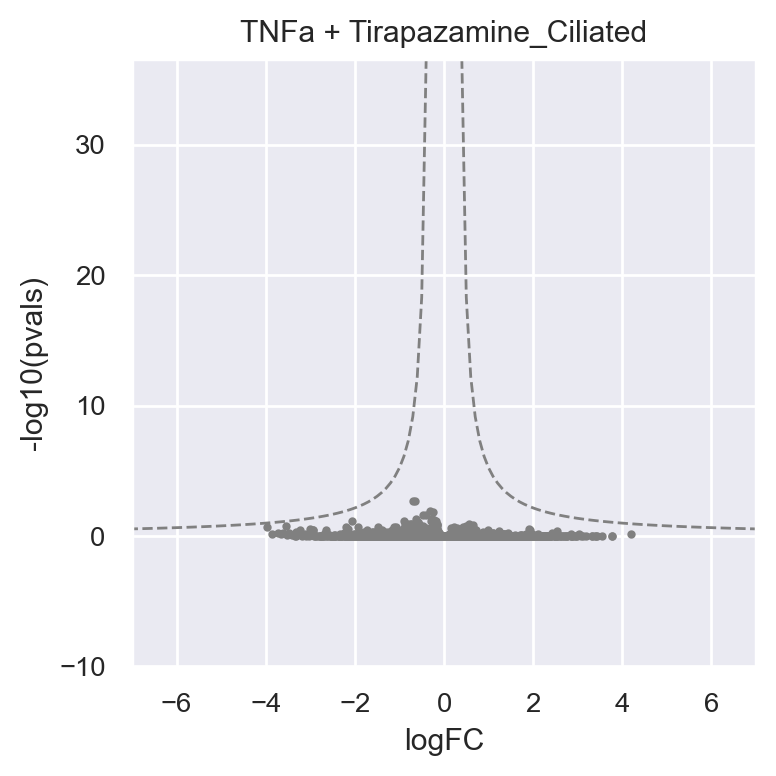

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNL


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


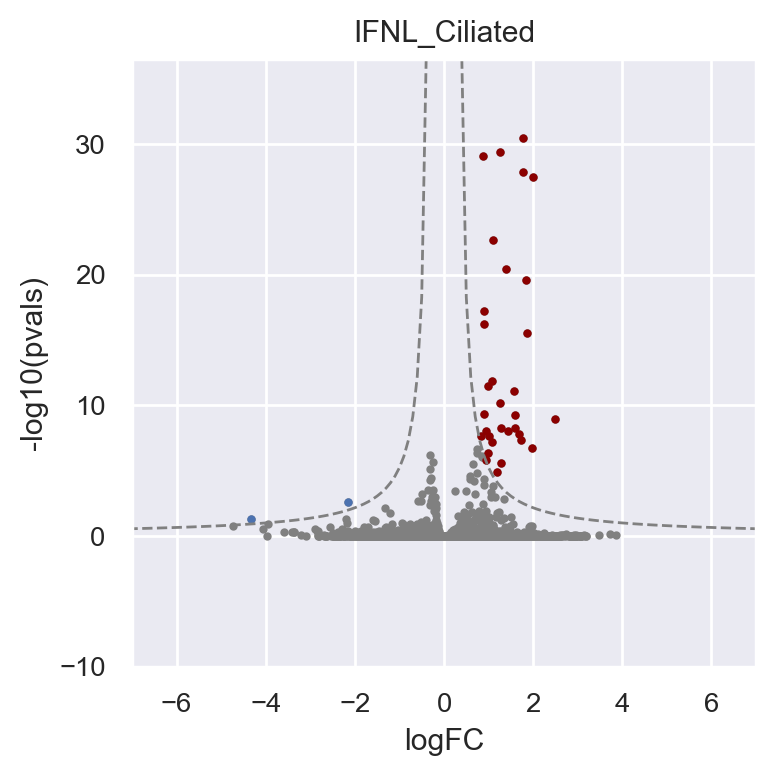

IFNg + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


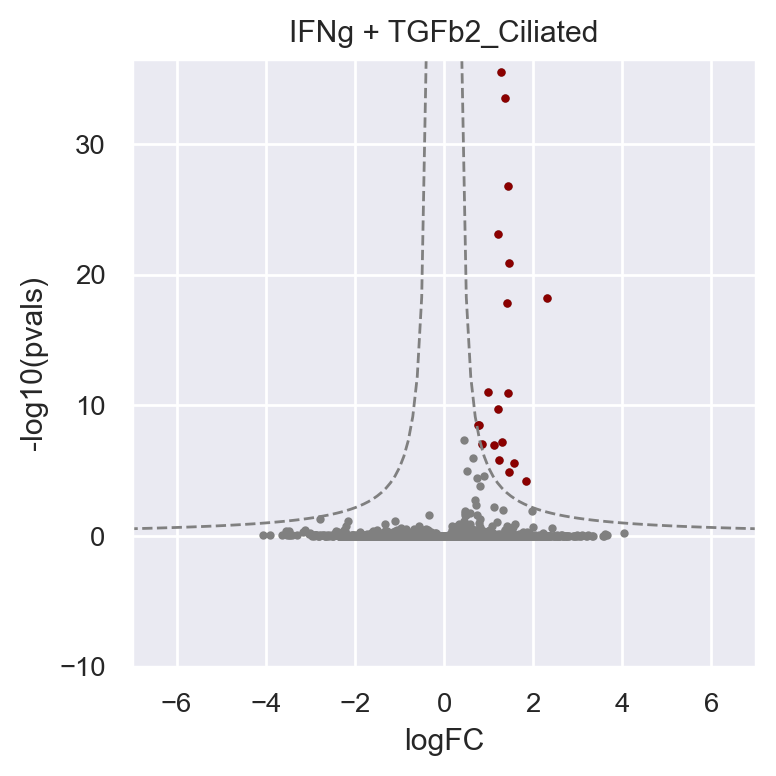

TGFb2 + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


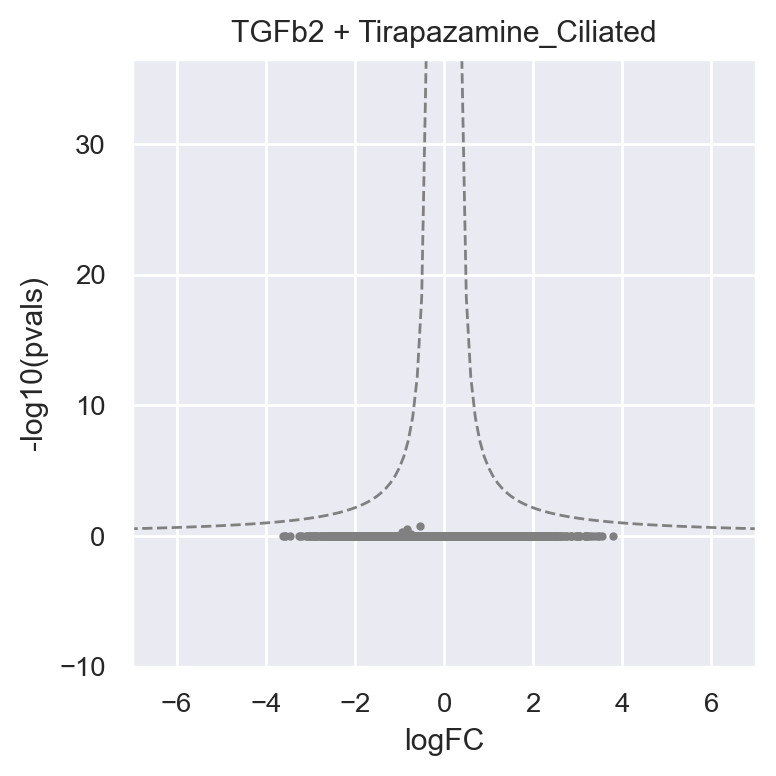

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


DMSO


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


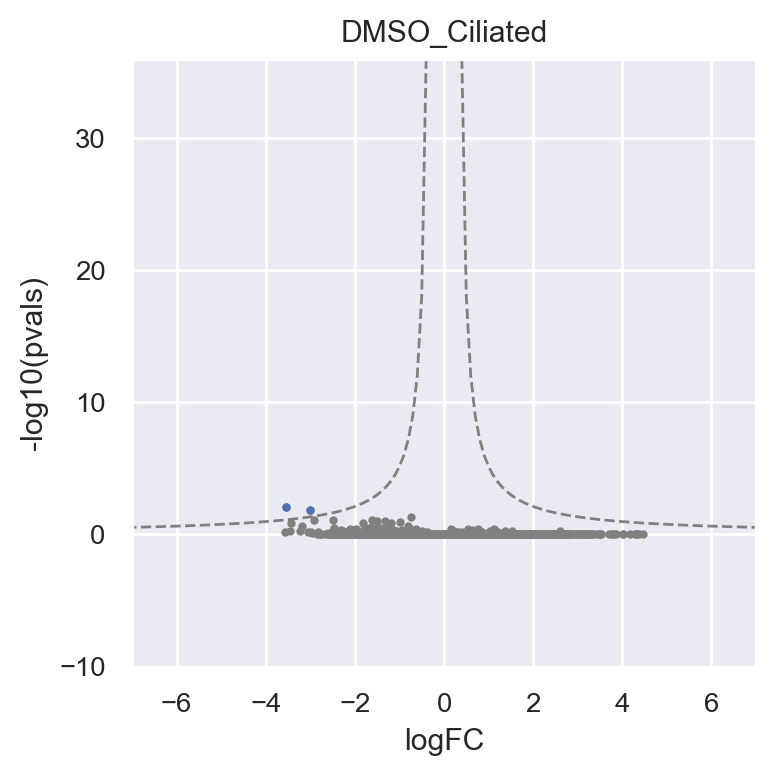

BB94


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


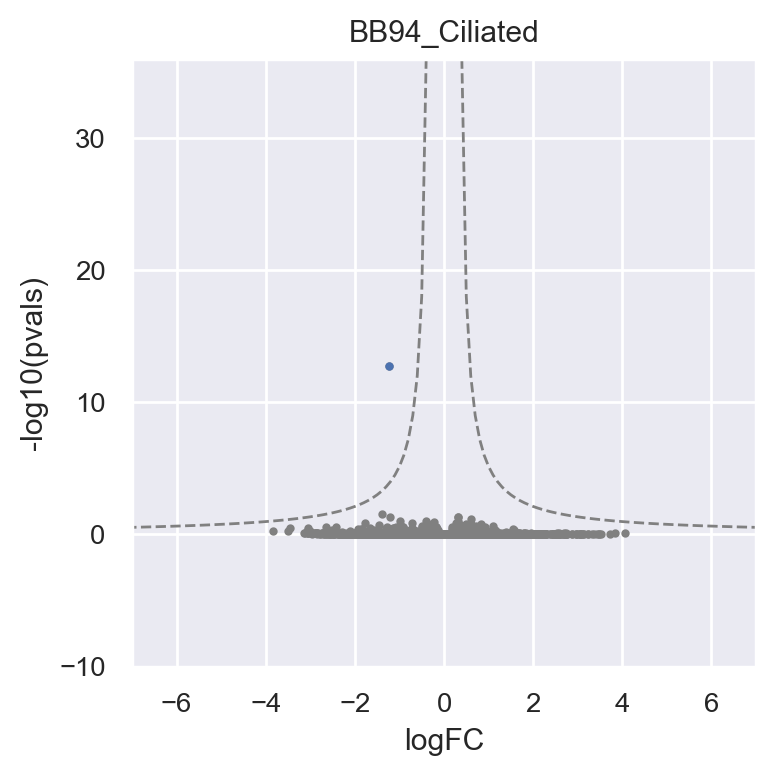

Gilteritinib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


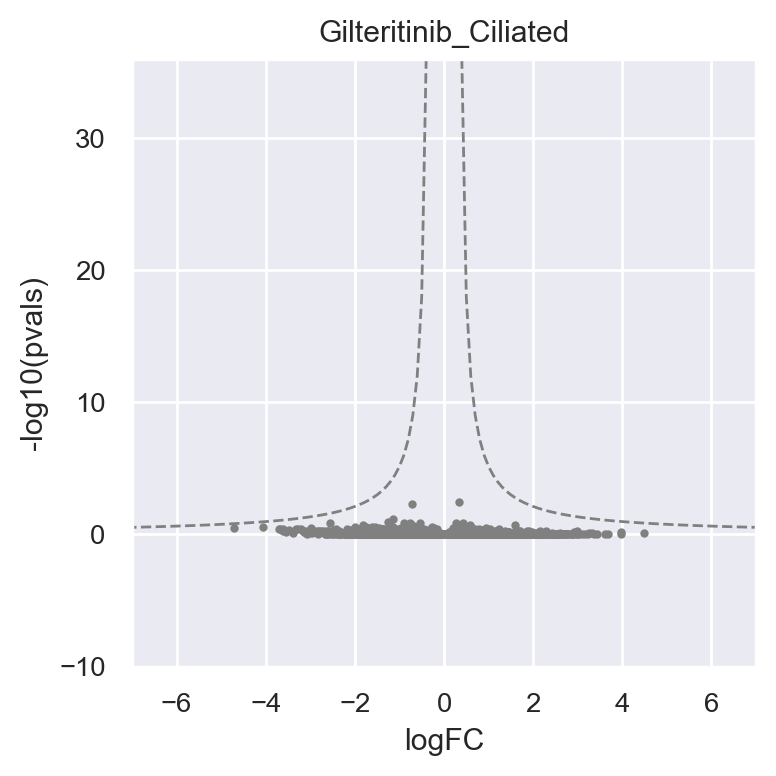

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


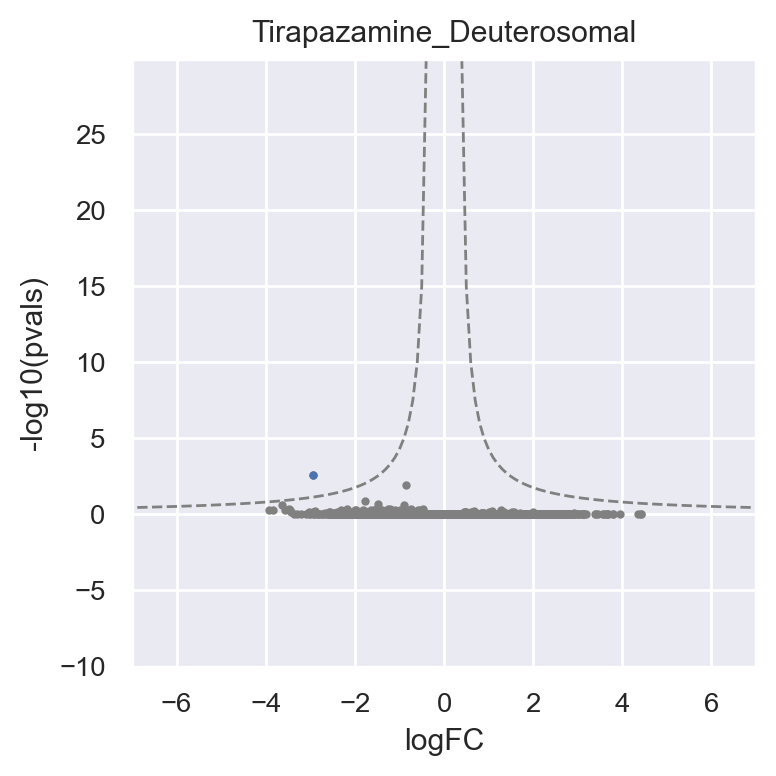

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


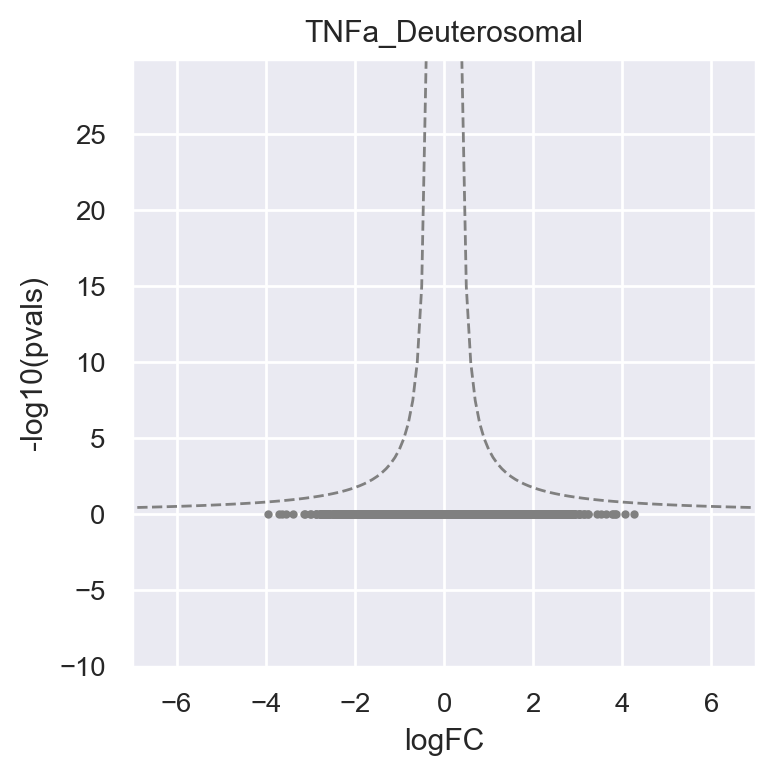

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


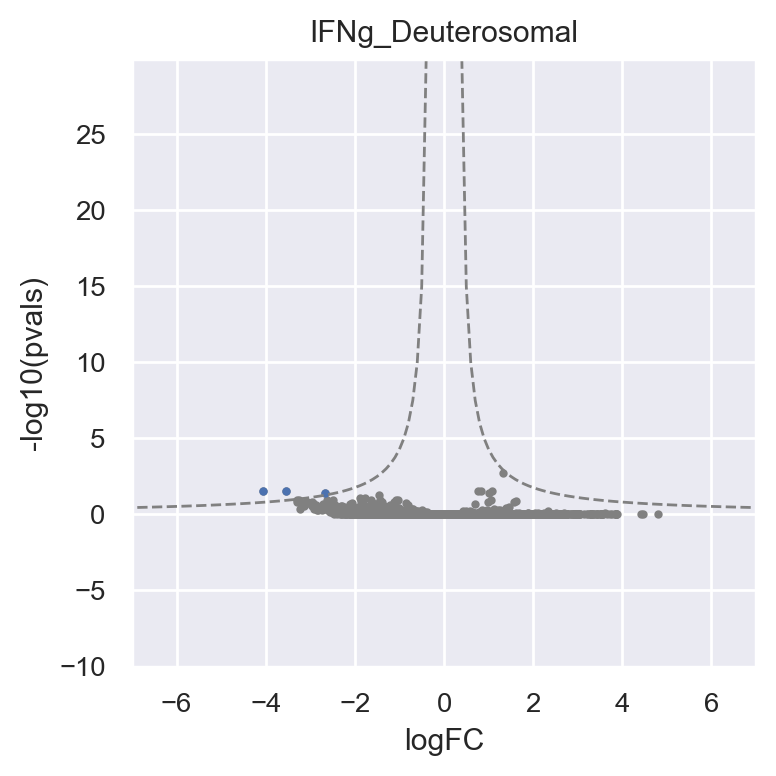

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


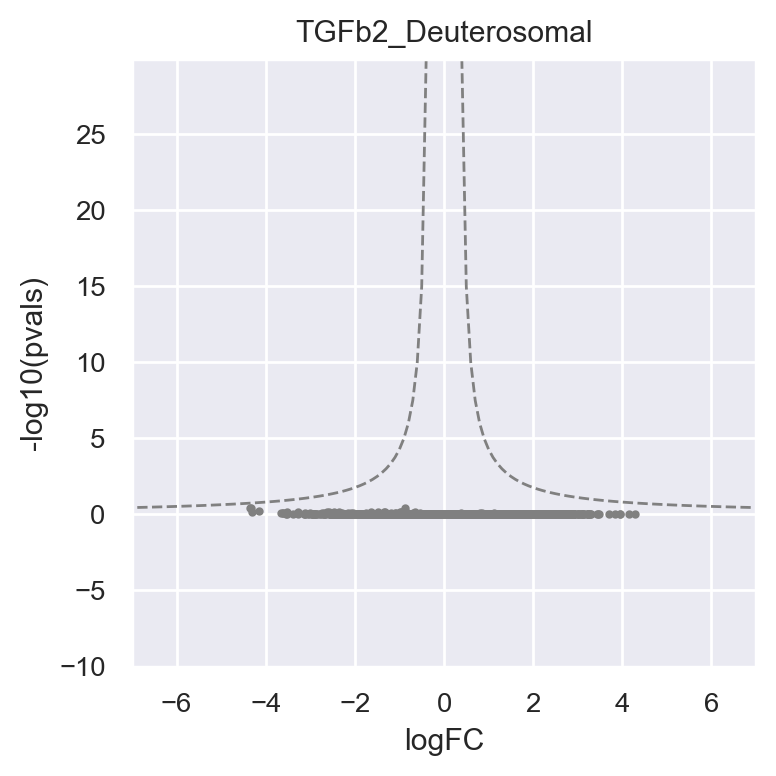

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


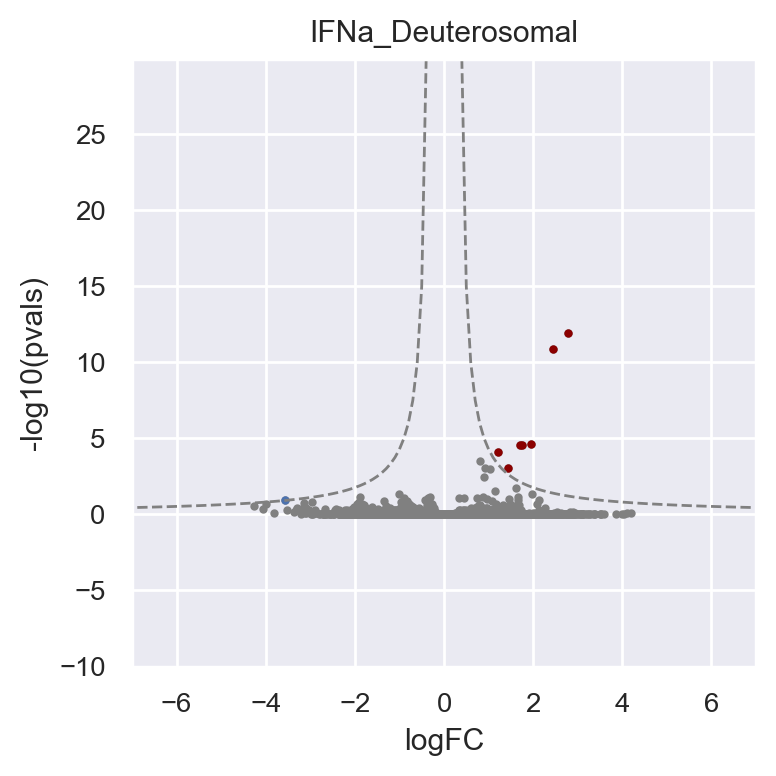

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


TNFa + TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


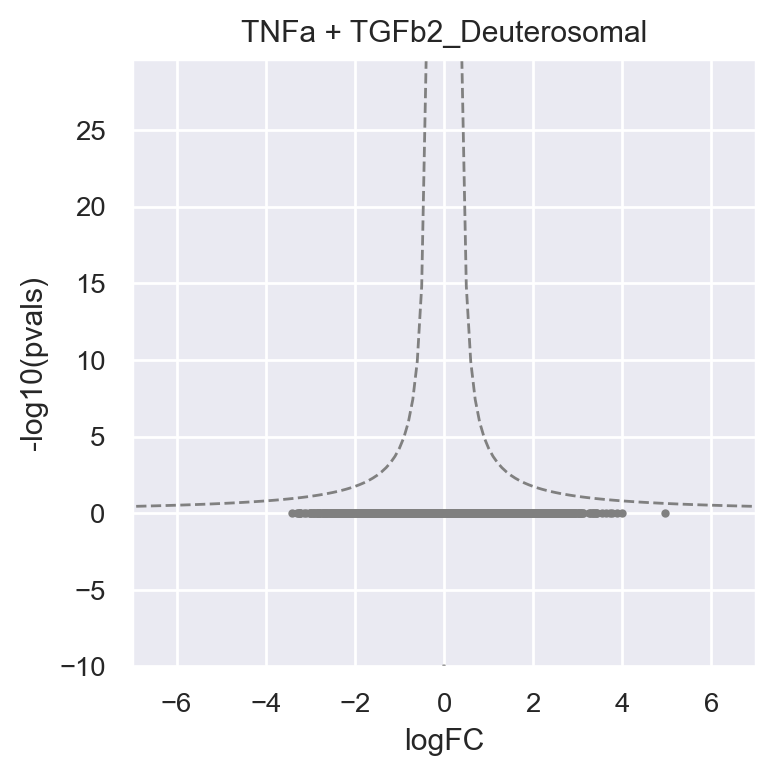

Sorafenib


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


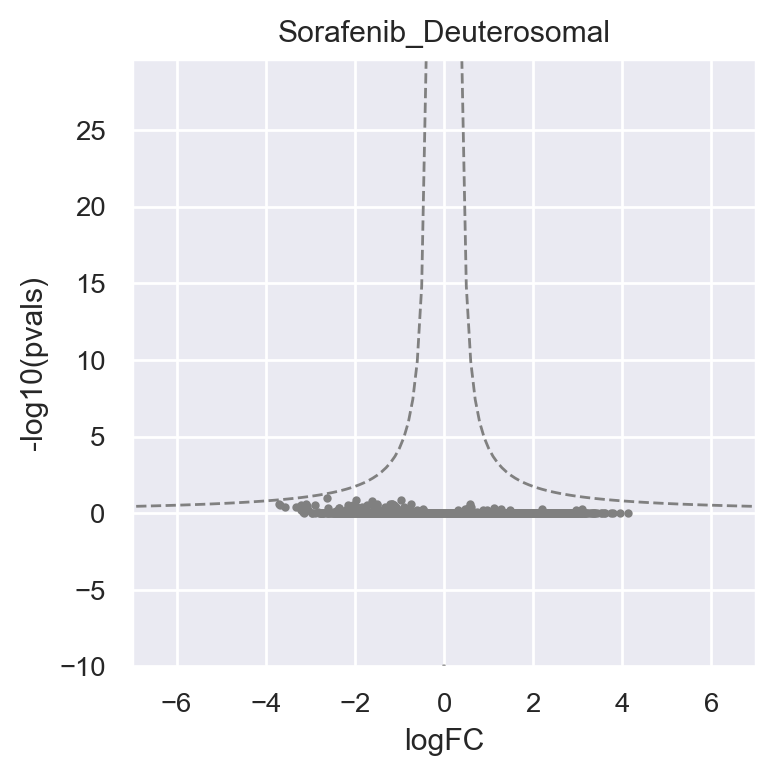

IFNa + TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


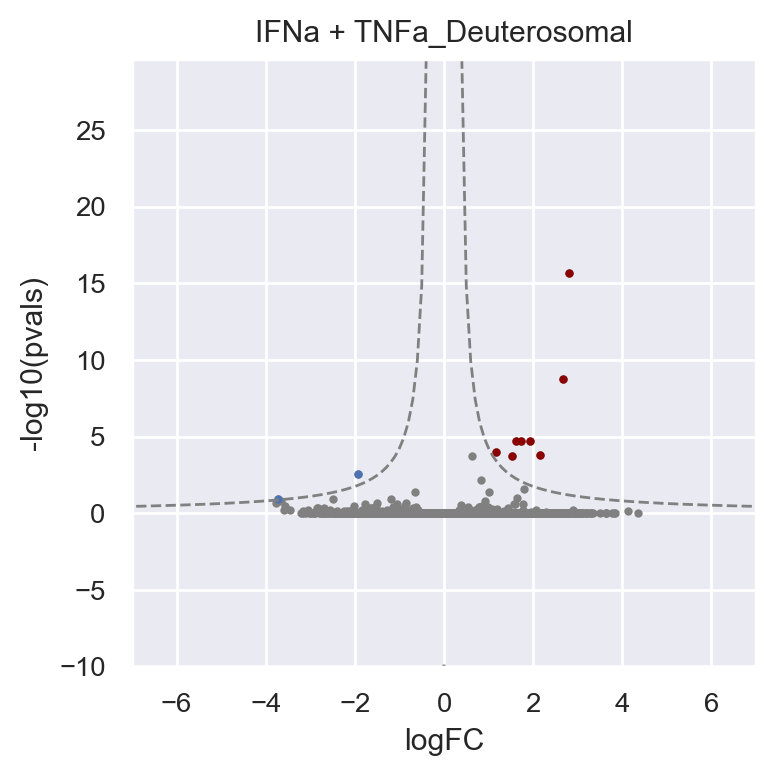

TNFa + IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


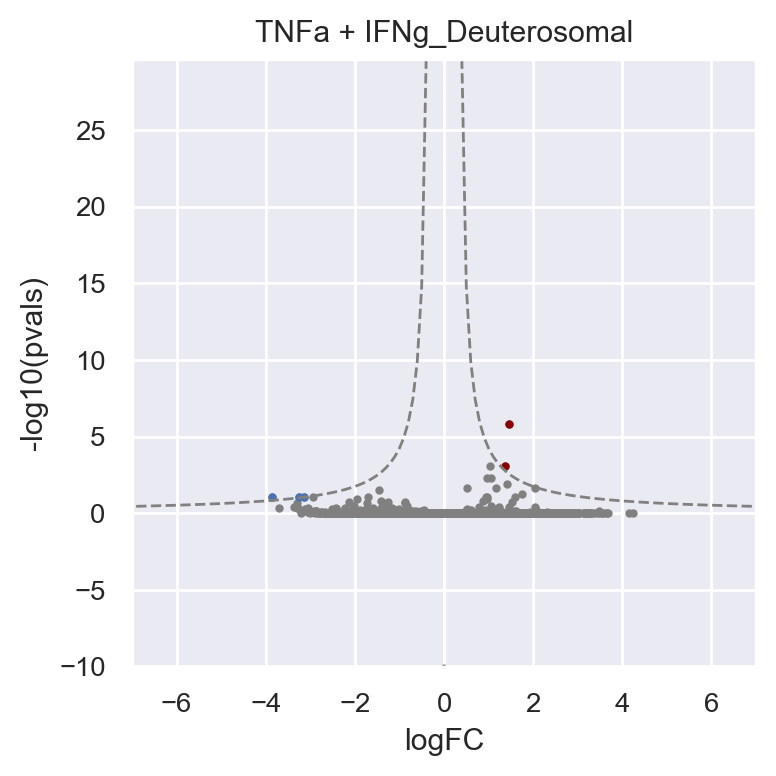

TNFa + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


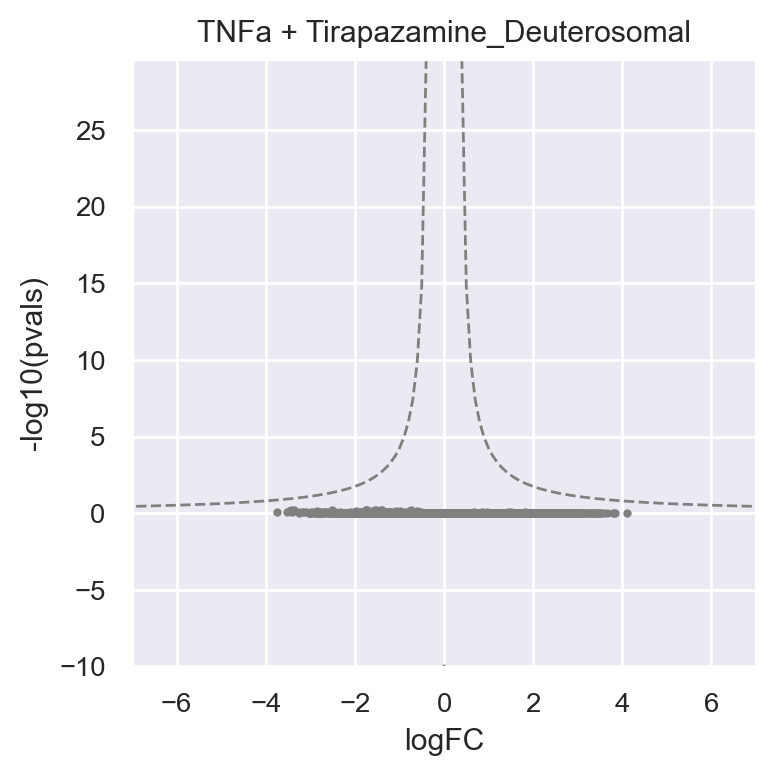

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


IFNL


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


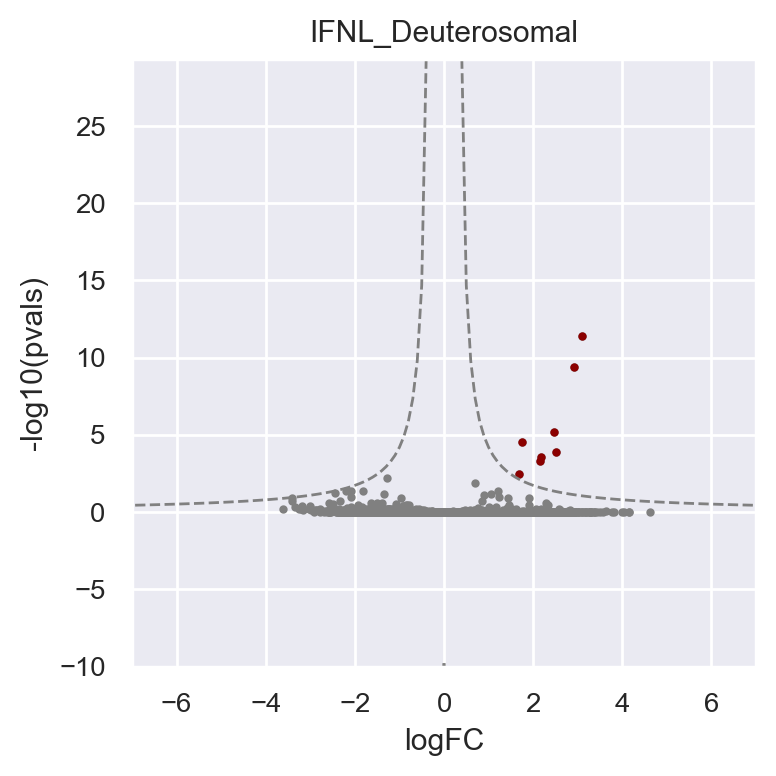

TGFb2 + Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


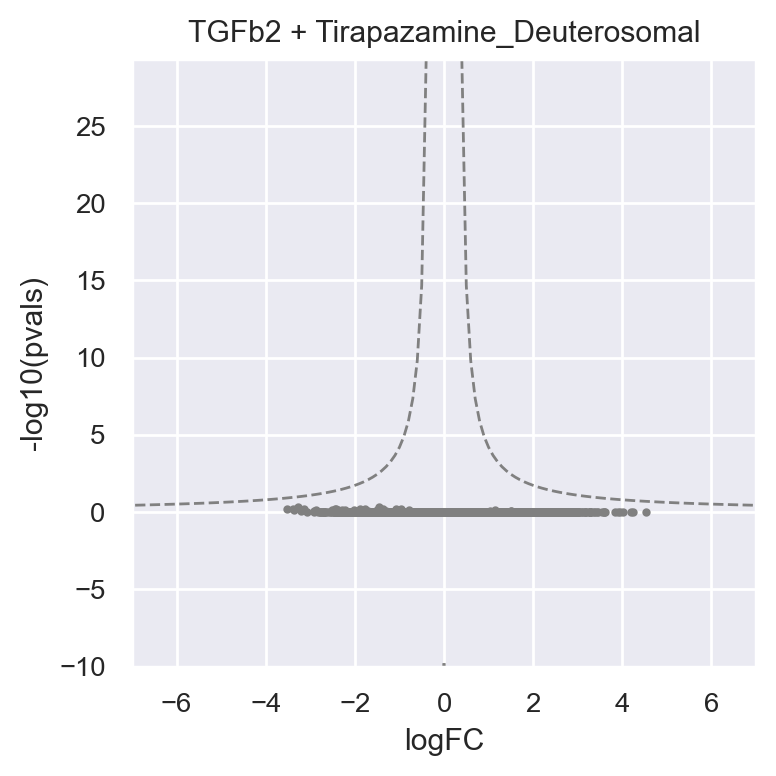

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


Tirapazamine


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


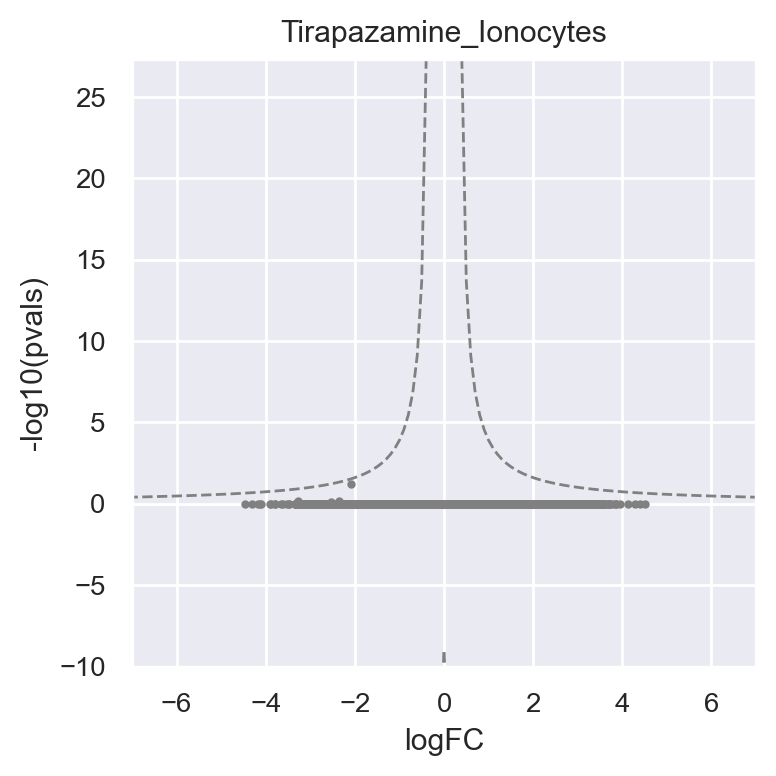

TNFa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


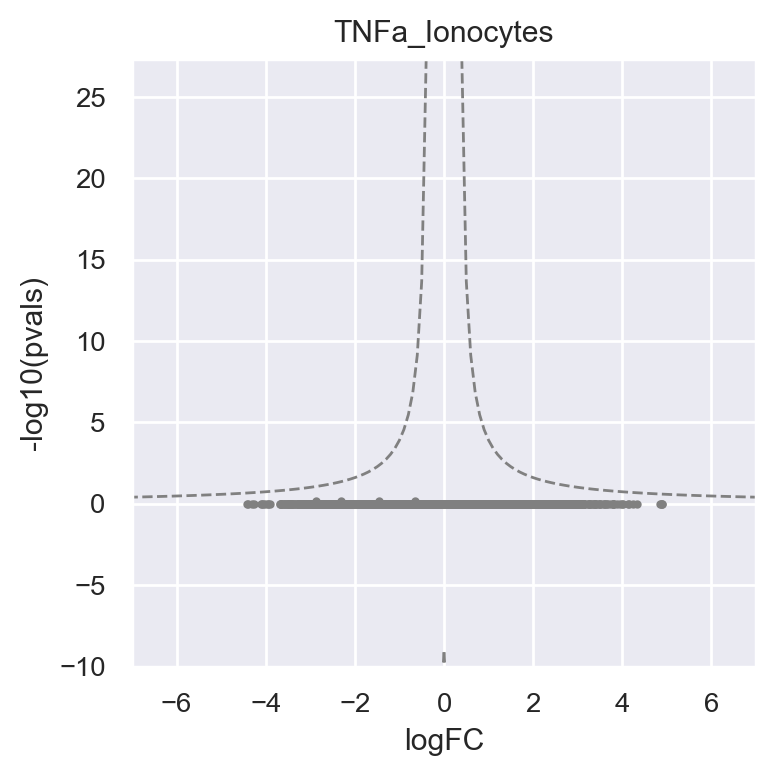

IFNg


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


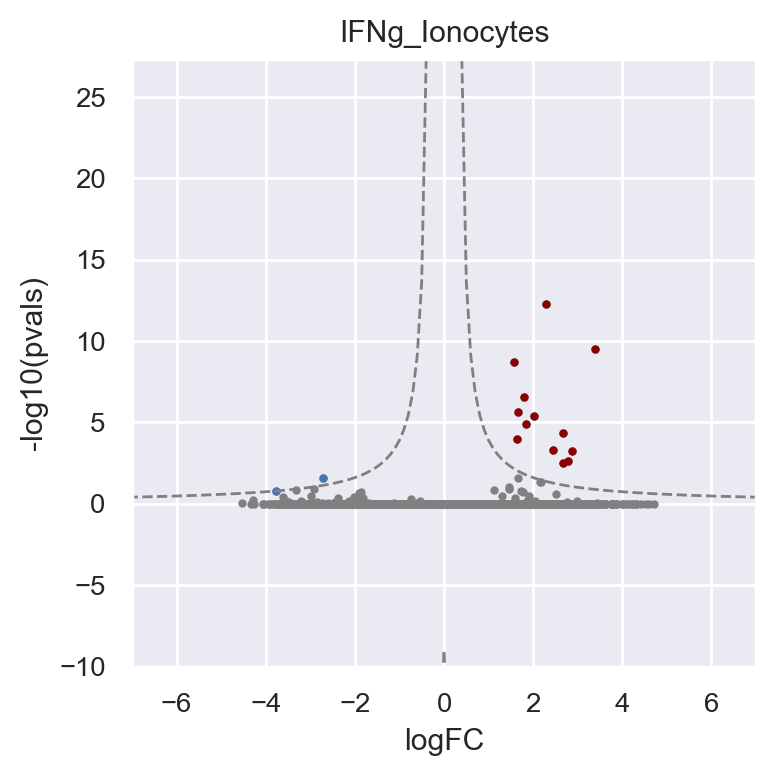

TGFb2


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


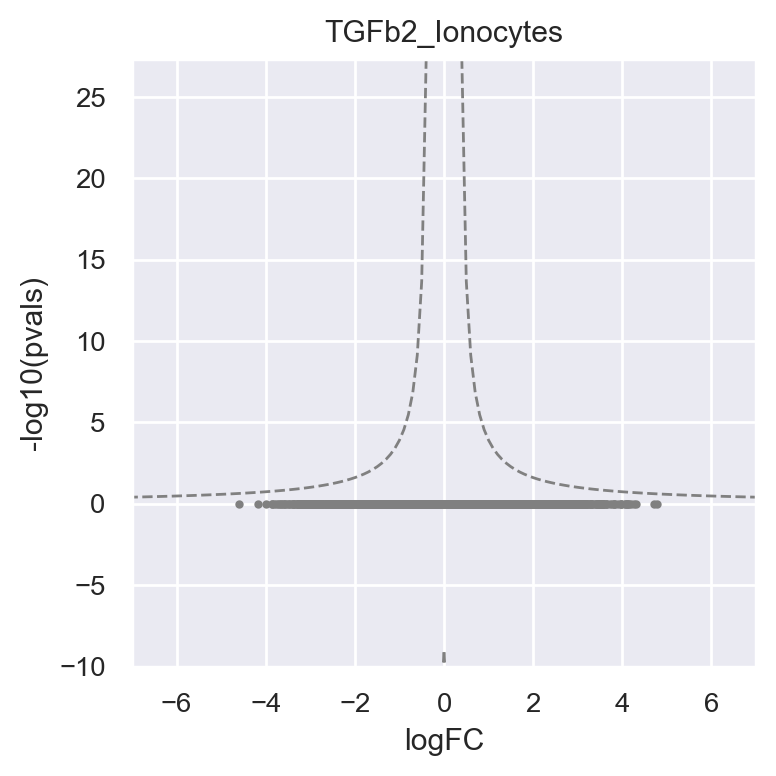

IFNa


/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['-log10(pvals)'] = -np.log10(df.pvals_adj.values)
/Users/yuge.ji/Desktop/marvin/covid-perturbation/utils.py:130: RuntimeWarning: divide by zero encountered in divide
  return logpval_thresh/(lfc - fc_thresh)


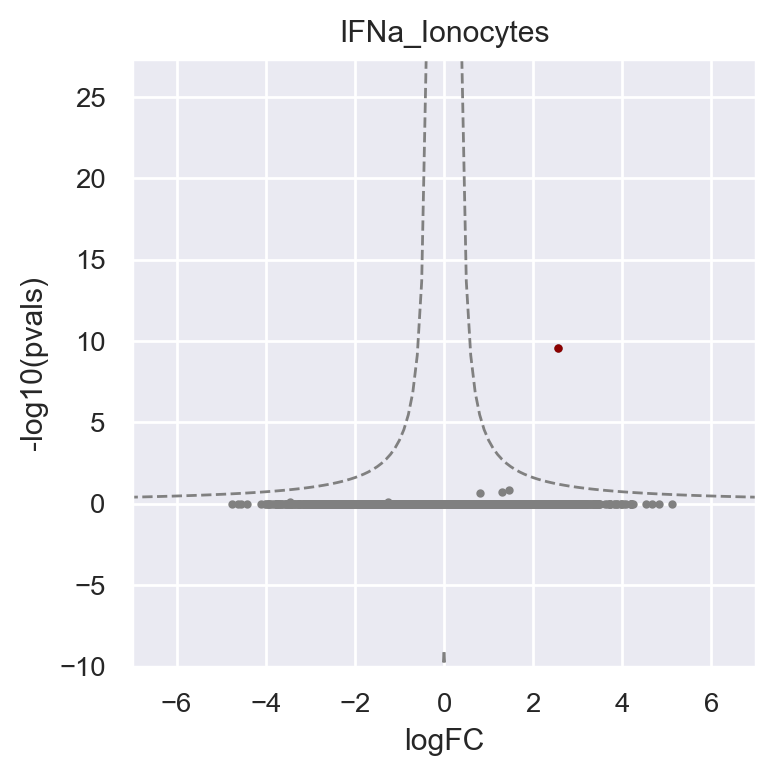

/Users/yuge.ji/miniconda3/envs/py38_analysis/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [287]:
def plot_sets(treatments, subset, fc_thresh=.3, logpval_thresh=30, plot=True, ct=''):
    """Plots volcano plots, runs enrichment, and records up-dn genes for treatment in treatments.
    Patient specific.
    """
    num_up_dn = {}
    up_dn_genes = {}
    
    subset = subset[subset.obs.groupby("treatment").filter(lambda x: len(x) > 40).index]  # need > 40 cells for signif
    
    if subset.shape[0] == 0:  # not enough of any treatment
        return num_up_dn, up_dn_genes  # {}, {}
    
    sc.tl.rank_genes_groups(subset, groupby='treatment', reference='mock')
    for trt in set(subset.obs.treatment.unique()) & set(treatments):

        print(trt)
        df, up, dn = plot_volcano(sc.get.rank_genes_groups_df(subset, group=trt), fc_thresh=fc_thresh, logpval_thresh=logpval_thresh)
        plt.title(f'{trt}_{ct}')
        plt.show()

        diff_genes = list(up) + list(dn)
        num_up_dn[trt] = (len(up), len(dn))
        up_dn_genes[trt] = diff_genes
        
        # general plotting    
        if plot:
            if len(diff_genes) > 10 and len(up) > 1:
        #         sc.pl.dotplot(adata, groupby='cell_type', var_names=diff_genes, standard_scale='var', swap_axes=True)
                print(up)
                try:  # only enrich upregulated genes
                    sns.barplot(data=enrich(up, subset.var_names).head(10), x='p_value', y='name', palette='Blues_r')
                    plt.show()
                except ValueError:  # no pathways
                    pass

    return num_up_dn, up_dn_genes

deg_cts = {}
cts = ['Basal', 'Basal prolif.', 'Club', 'Suprabasal', 'Goblet', 'Ciliated', 'Deuterosomal', 'Ionocytes'] 
for ct in cts:
    sub_adata = adata[adata.obs.cell_type == ct]
    up_dn_dict = {}
    genes_dict = {}
    for treatment_set, subset in [
            # patients 1, 2, 3, and 4
            (['IFNa', 'IFNg', 'TGFb2', 'TNFa', 'Tirapazamine'], sub_adata),
            # patients 1, 3, + 4
            (['IFNa + TNFa', 'Sorafenib', 'TNFa + IFNg', 'TNFa + TGFb2', 'TNFa + Tirapazamine'], sub_adata[sub_adata.obs.patient != 'Patient 2']),
            # patients 3 + 4
            (['IFNL', 'IFNg + TGFb2', 'TGFb2 + Tirapazamine'], sub_adata[sub_adata.obs.patient.isin(['Patient 3', 'Patient 4'])]),
            # patient 4 only
            (['BB94', 'DMSO', 'Gilteritinib'], sub_adata[sub_adata.obs.patient == 'Patient 4'])
        ]:
        num, lists = plot_sets(treatment_set, subset, fc_thresh=.3, logpval_thresh=np.log10(subset.shape[0]), plot=False, ct=ct)
        up_dn_dict = {**up_dn_dict, **num}
        genes_dict = {**genes_dict, **lists}
    deg_cts[ct] = up_dn_dict

In [307]:
dfs = []
for ct, dct in deg_cts.items():
    df = pd.DataFrame.from_dict(dct, orient='index')
    df.columns = [f'{ct}_up', f'{ct}_dn']
    dfs.append(df)
#     display(df)

<AxesSubplot: >

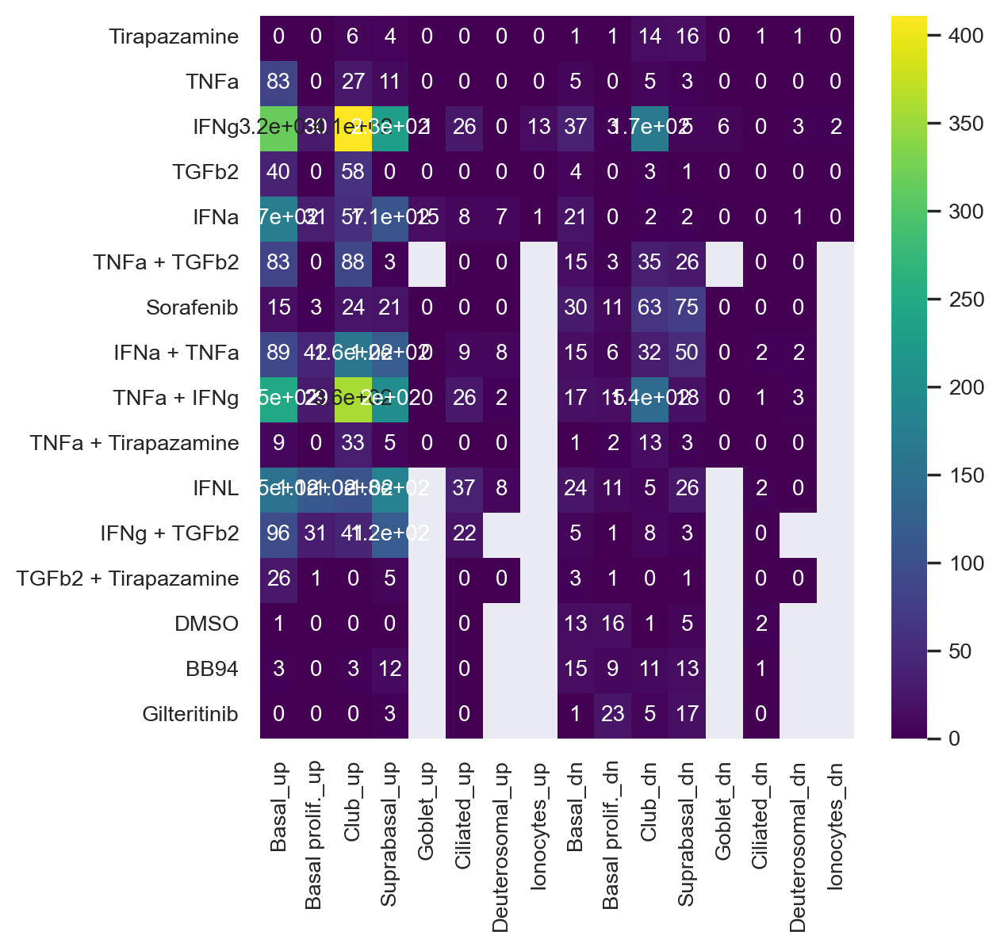

In [311]:
sns.set(font_scale=.9)
plt.figure(figsize=(6, 6))
cnts = pd.concat(dfs, axis=1)
sns.heatmap(
    cnts[[c for c in cnts.columns if '_up' in c] + [c for c in cnts.columns if '_dn' in c]],
    annot=True, cmap='viridis', annot_kws={"size": 10}
)

Hard to tell if this is because of low cell numbers. I adjusted based on cell count but it doesn't seem like it's enough. I could switch to using edgeR, or I could subsample each condition until the cell numbers approximately match.